# Lag Time Analysis 3A: Collect validation data 
Identify waves manually to create validation dataset

This page is set up to manually track individual flood waves as a check on the cross-correlation lag times.

In [1]:
import platform
print(f"Python version: {platform.python_version()}")

import hydrofunctions as hf
print("Hydrofunctions version: ", hf.__version__)

import pandas as pd
print("Pandas version: ", pd.__version__)
import numpy as np
print("Numpy version: ", np.__version__)

import matplotlib
import matplotlib.pyplot as plt
print("Matplotlib version: ", matplotlib.__version__)
#%matplotlib --list
#%matplotlib qt
#%matplotlib ipympl
%matplotlib inline

import analysis_functions
print("Analysis_functions version: ", analysis_functions.__version__)

from scipy.stats import linregress

Python version: 3.13.3
Hydrofunctions version:  0.2.4
Pandas version:  2.3.0
Numpy version:  2.3.0
Matplotlib version:  3.10.3
Analysis_functions version:  2025.06.09


## Import and organize datasets
- Stations were created in LTA_1_Stations.ipynb
    - Station names and id numbers refer to USGS stations;
    - Stream gage data obtained from NWIS.usgs.gov and saved locally to a file.
    - position_nhd_m is the distance from the station DS to the Chesapeake Bay in meters.
    - gauge_datum_m is elevation in meters above the 1929 datum
    - StageQ0root and StageMin are estimates of the elevation above the gauge datum where discharge is zero. Used for depth measurements.
- Reaches were created in LTA_2_Reaches.ipynb
    - reaches are defined as river segments between two stations.
    - US and DS are the USGS station ID for the stations upstream and downstream from the reach.
    - length is measured from the NHD in meters
    - head is the drop in elevation from US to DS stations in meters
    - gradient is head / length. dimensionless
    - symbol and colors are for plotting.

In [2]:
# Read station data
stations = pd.read_parquet('stations.parquet')
stations

,name,position_nhd_m,gauge_datum_m,basin_area_km2,medianQ_cms,color,StageQ0root,StageMin
01541200,Curwensville,507322,342.796368,951.0,9.967514,#4a58dd,0.579685,0.701040
01541303,Hyde,494288,333.420720,1228.0,14.186717,#27d7c4,0.645428,0.835152
01542500,Karthaus,422588,253.163832,3787.0,40.209856,#95fb51,-0.016348,0.280416
01545500,Renovo,367064,193.301112,7705.0,84.667232,#ffa423,-0.474518,-0.115824
01551500,Williamsport,273292,150.869904,14716.0,161.972096,#ba2208,-0.581263,-0.100584


In [3]:
# Read reach data
reaches = pd.read_parquet('reaches.parquet')
reaches

,us,ds,length,head,gradient,deltaQ,deltaA,symbol,color
Curwensville-Hyde,01541200,01541303,13034,9.309905,0.000714,1.423295,1.291272,+,#2f9df5
Hyde-Karthaus,01541303,01542500,71700,80.918664,0.001129,2.834331,3.083876,x,#4df884
Karthaus-Renovo,01542500,01545500,55524,60.320890,0.001086,2.105634,2.034592,*,#dedd32
Renovo-Williamsport,01545500,01551500,93772,42.537953,0.000454,1.913043,1.909929,o,#f65f18


In [4]:
# Load USGS stream gage data from a local *.parquet file.
# Depths are actual water depths in meters, not stage
# Discharge is in meters³/second
import pandas as pd
water_depth=pd.read_parquet('WBdata-depth.parquet')
discharge= pd.read_parquet('WBdata-discharge.parquet')

In [5]:
water_depth

,01541200,01541303,01542500,01545500,01551500
datetimeUTC,,,,,
2012-10-01 04:00:00+00:00,0.514547,0.345172,0.571084,0.730550,0.992743
2012-10-01 04:15:00+00:00,0.517595,0.345172,0.571084,0.730550,0.992743
2012-10-01 04:30:00+00:00,0.514547,0.345172,0.571084,0.724454,0.995791
2012-10-01 04:45:00+00:00,0.514547,0.345172,0.568036,0.724454,0.995791
2012-10-01 05:00:00+00:00,0.514547,0.345172,0.568036,0.721406,0.995791
...,...,...,...,...,...
2016-10-02 02:45:00+00:00,0.456635,0.363460,0.632044,0.593390,0.782431
2016-10-02 03:00:00+00:00,0.456635,0.363460,0.635092,0.593390,0.782431
2016-10-02 03:15:00+00:00,0.456635,0.363460,0.635092,0.590342,0.782431


In [6]:
water_depth.describe()

,01541200,01541303,01542500,01545500,01551500
count,140087.000000,140311.000000,140347.000000,140296.000000,140302.000000
mean,0.609435,0.618678,0.880297,1.143322,1.492794
std,0.239634,0.375343,0.392439,0.545377,0.735612
min,0.121355,0.189724,0.296764,0.358694,0.480679
25%,0.459683,0.326884,0.571084,0.718358,0.928735
50%,0.578555,0.531100,0.824068,1.065830,1.376791
75%,0.715715,0.793228,1.098388,1.413302,1.837039
max,1.883099,2.990836,2.671156,4.336334,5.430631


In [7]:
# Linear model estimate of maximum celerity
(9.8*5.43)**.5

7.294792663263295

In [8]:
discharge.head()

,01541200,01541303,01542500,01545500,01551500
datetimeUTC,,,,,
2012-10-01 04:00:00+00:00,6.852666,7.249101,18.462554,37.944512,83.534560
2012-10-01 04:15:00+00:00,6.965933,7.249101,18.462554,37.944512,83.534560
2012-10-01 04:30:00+00:00,6.852666,7.249101,18.462554,37.378176,84.100896
2012-10-01 04:45:00+00:00,6.852666,7.249101,18.292653,37.378176,84.100896
2012-10-01 05:00:00+00:00,6.852666,7.249101,18.292653,37.095008,84.100896


<Axes: xlabel='datetimeUTC'>

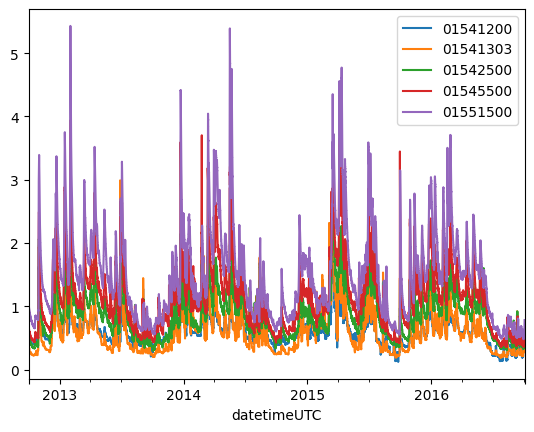

In [9]:
water_depth.plot()

## Data Collection Tools
- Create a function to plot data within a window and collect the maximum discharges within that window
- **This page will select waves completely by hand**

In [10]:
# Create two arrays to hold the observations in the 'Data Collection' section.
data_peak_times = {}
data_peak_depth = {}

# Set the start time for the analysis
time0 = water_depth.index.min()
print(f'Start time: {time0}')
print(f'length of time series: {water_depth.index.max()-time0}')

# Set up a standard array of plotting colors.
site_colors = stations['color'].to_dict()
site_colors

Start time: 2012-10-01 04:00:00+00:00
length of time series: 1461 days 23:45:00


{'01541200': '#4a58dd',
 '01541303': '#27d7c4',
 '01542500': '#95fb51',
 '01545500': '#ffa423',
 '01551500': '#ba2208'}

## Data Collection
Select flood waves from the dataset.
- Start at the beginning of the dataset (`start`)
- Plot a 7-day window
- move the window forward by adding an adjustment
- position the window around the first flood wave that meets the criteria:
    - the wave wasn't collected before
    - the maximum depth at two consecutive stations corresponds to the same flood peak.
    - There is no minimum size, but very small waves are unlikely to meet criteria #2.
- The algorithm will select the time and maximum value for the peak at each site
- for flat-topped waves, manually choose the leading top corner of the wave instead of the maximum
- skip sites where the wave cannot be matched to the other sites, 
- skip sites where the wave arrives downstream before it arrives upstream or it is unclear which peaks match

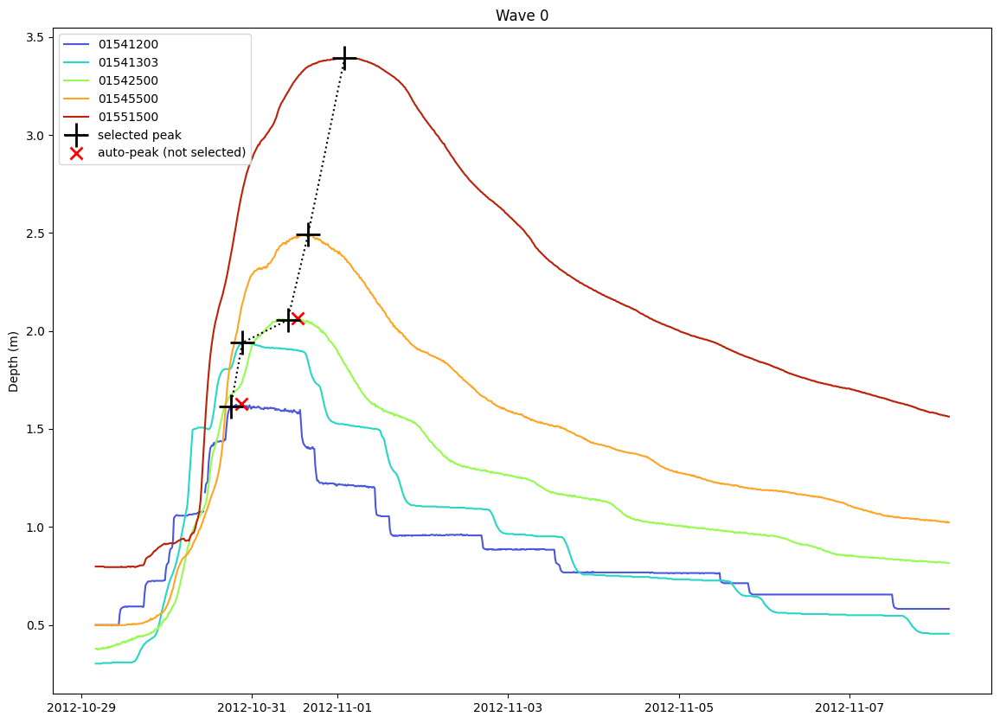

(01541200   2012-10-30 18:00:00+00:00
 01541303   2012-10-30 21:15:00+00:00
 01542500   2012-10-31 10:00:00+00:00
 01545500   2012-10-31 15:45:00+00:00
 01551500   2012-11-01 02:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.614875
 01541303    1.939276
 01542500    2.055460
 01545500    2.492294
 01551500    3.391519
 dtype: float64)

In [11]:
wave = 0
adjustment = pd.Timedelta('28 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2012-10-30 18:00:00+00:00',
          #'01541303':'',
          '01542500':'2012-10-31 10:00:00+00:00',
          #'01545500':'',
          #'01551500':'',
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

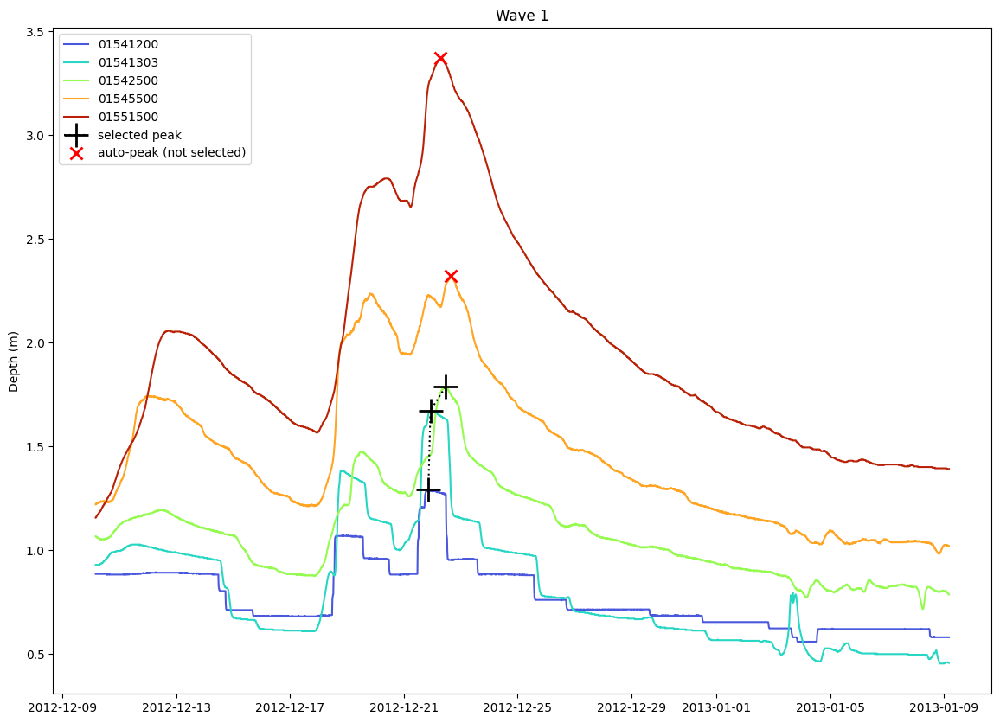

(01541200   2012-12-21 20:45:00+00:00
 01541303   2012-12-21 22:30:00+00:00
 01542500   2012-12-22 11:15:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.291787
 01541303    1.674100
 01542500    1.787236
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [12]:
wave = 1
adjustment = pd.Timedelta('70 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'',
          #'01541303':'',
          #'01542500':'',
          '01545500':'skip',
          '01551500':'skip',
         }

start = time0 + adjustment
period = '30 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

In [13]:
plt.show()

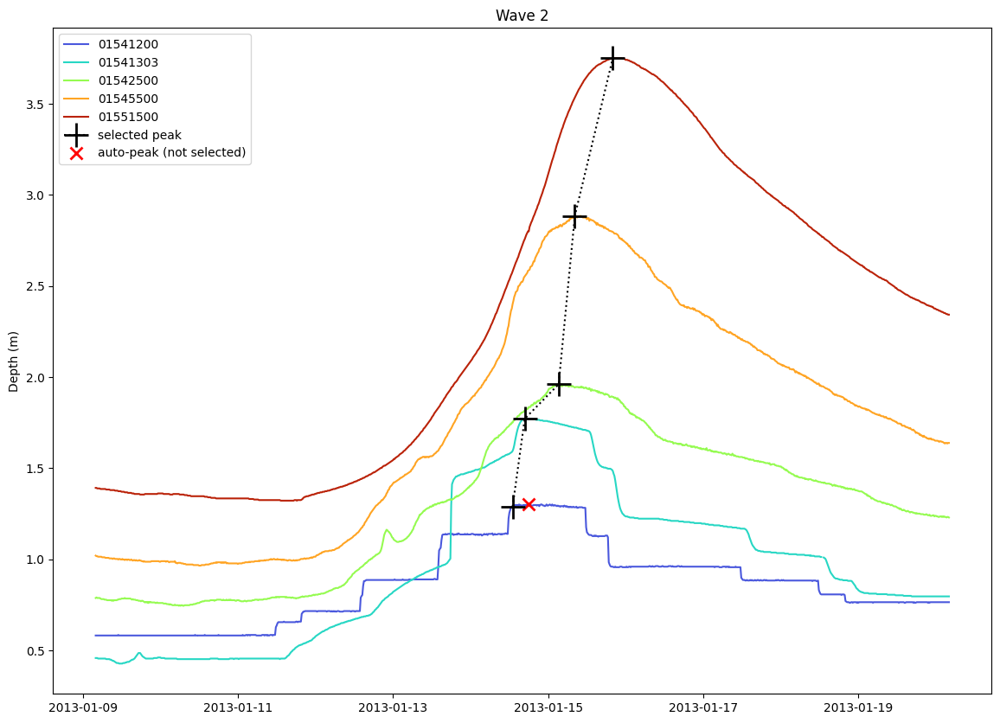

(01541200   2013-01-14 13:00:00+00:00
 01541303   2013-01-14 16:45:00+00:00
 01542500   2013-01-15 03:15:00+00:00
 01545500   2013-01-15 08:15:00+00:00
 01551500   2013-01-15 20:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.288739
 01541303    1.771636
 01542500    1.960972
 01545500    2.885486
 01551500    3.751183
 dtype: float64)

In [14]:
wave = 2
adjustment = pd.Timedelta('100 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2013-01-14 13:00:00+00:00',
          #'01541303':'',
          #'01542500':'',
          #'01545500':'',
          #'01551500':'',
         }

start = time0 + adjustment
period = '11 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

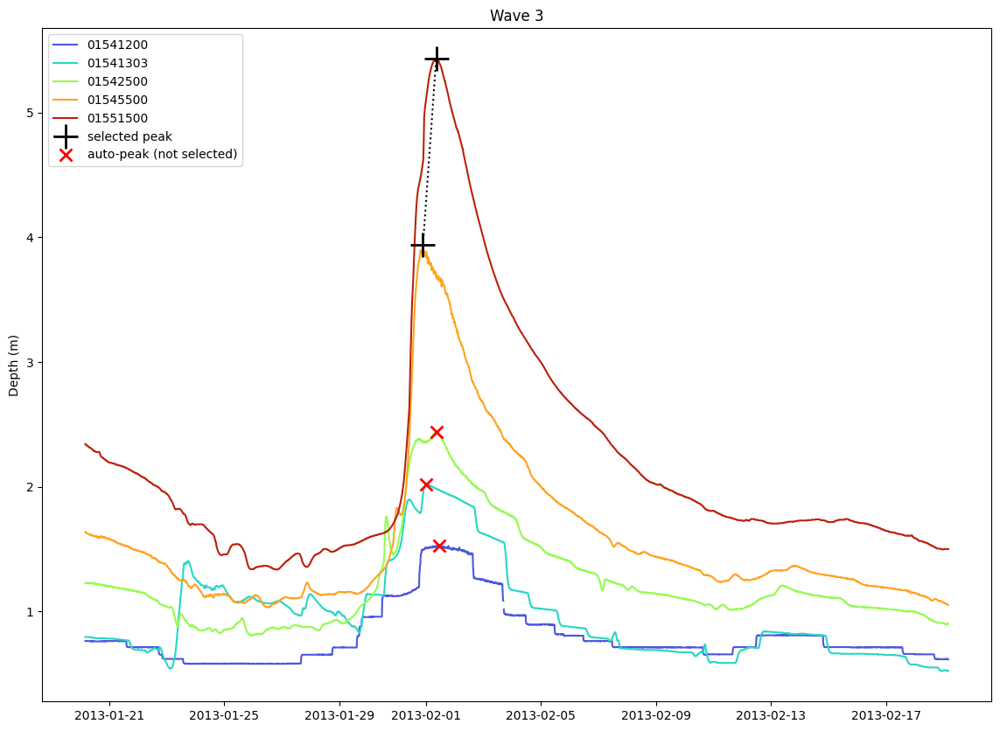

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-01-31 21:45:00+00:00
 01551500   2013-02-01 08:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    3.937046
 01551500    5.430631
 dtype: float64)

In [15]:
wave = 3
adjustment = pd.Timedelta('111 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'',
          #'01551500':'',
         }

start = time0 + adjustment
period = '30 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

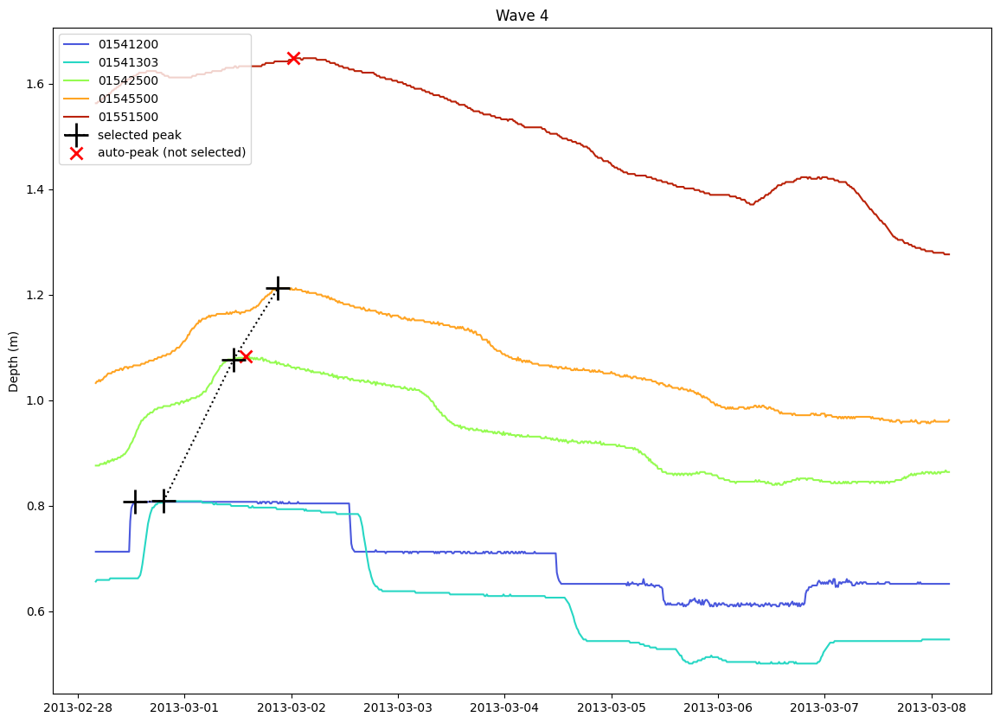

(01541200   2013-02-28 12:45:00+00:00
 01541303   2013-02-28 19:15:00+00:00
 01542500   2013-03-01 11:00:00+00:00
 01545500   2013-03-01 21:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.807155
 01541303    0.808468
 01542500    1.077052
 01545500    1.212134
 01551500         NaN
 dtype: float64)

In [16]:
wave = 4
adjustment = pd.Timedelta('150 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'',
          #'01541303':'',
          '01542500':'2013-03-01 11:00:00+00:00',
          #'01545500':'',
          '01551500':'skip',
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

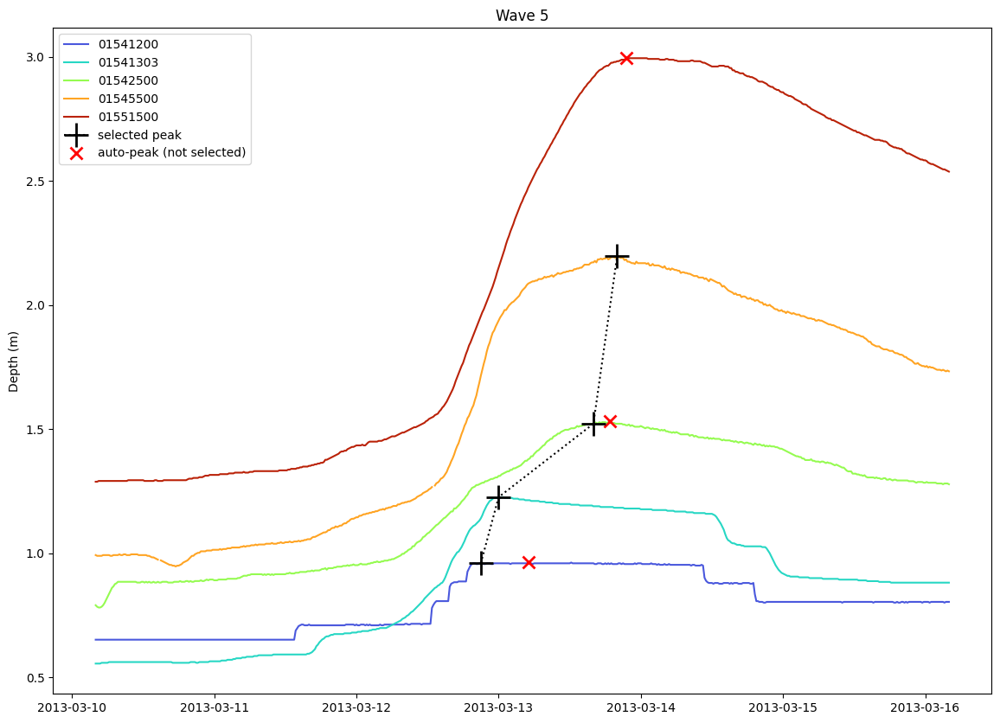

(01541200   2013-03-12 21:00:00+00:00
 01541303   2013-03-13 00:00:00+00:00
 01542500   2013-03-13 16:00:00+00:00
 01545500   2013-03-13 20:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.959555
 01541303    1.226044
 01542500    1.522060
 01545500    2.196638
 01551500         NaN
 dtype: float64)

In [17]:
wave = 5
adjustment = pd.Timedelta('160 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2013-03-12 21:00:00+00:00',
          #'01541303':'',
          '01542500':'2013-03-13 16:00:00+00:00',
          #'01545500':'',
          '01551500':'skip',
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

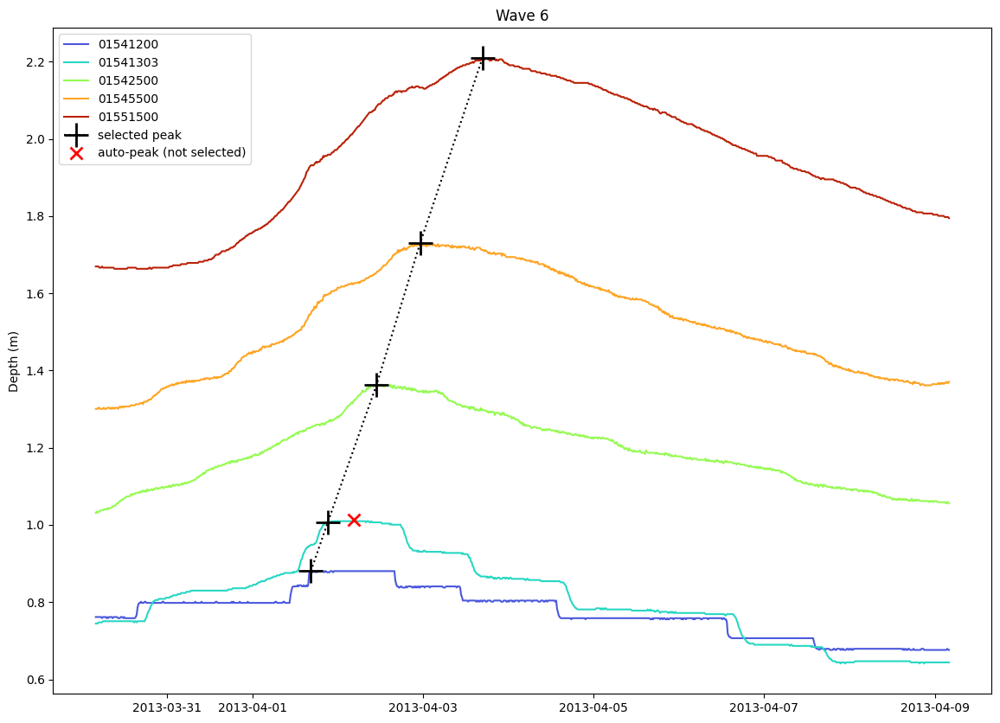

(01541200   2013-04-01 16:30:00+00:00
 01541303   2013-04-01 21:15:00+00:00
 01542500   2013-04-02 11:00:00+00:00
 01545500   2013-04-02 23:15:00+00:00
 01551500   2013-04-03 16:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.880307
 01541303    1.006588
 01542500    1.363564
 01545500    1.730294
 01551500    2.208895
 dtype: float64)

In [18]:
wave = 6
adjustment = pd.Timedelta('180 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'',
          '01541303':'2013-04-01 21:15:00+00:00',
          #'01542500':'',
          #'01545500':'',
          #'01551500':'',
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

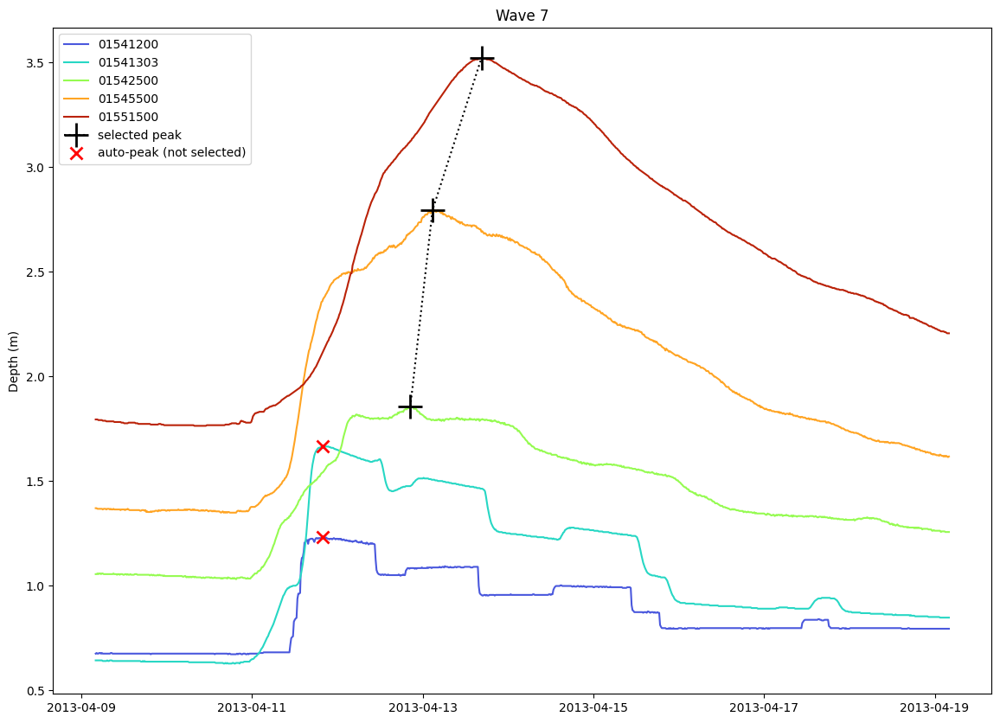

(01541200                         NaT
 01541303                         NaT
 01542500   2013-04-12 20:30:00+00:00
 01545500   2013-04-13 02:45:00+00:00
 01551500   2013-04-13 16:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.854292
 01545500    2.794046
 01551500    3.519535
 dtype: float64)

In [19]:
wave = 7
adjustment = pd.Timedelta('190 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2013-04-11 15:45:00+00:00',
          '01541200': 'skip',
          '01541303': 'skip',
          #'01542500':'',
          #'01545500':'',
          #'01551500':'',
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

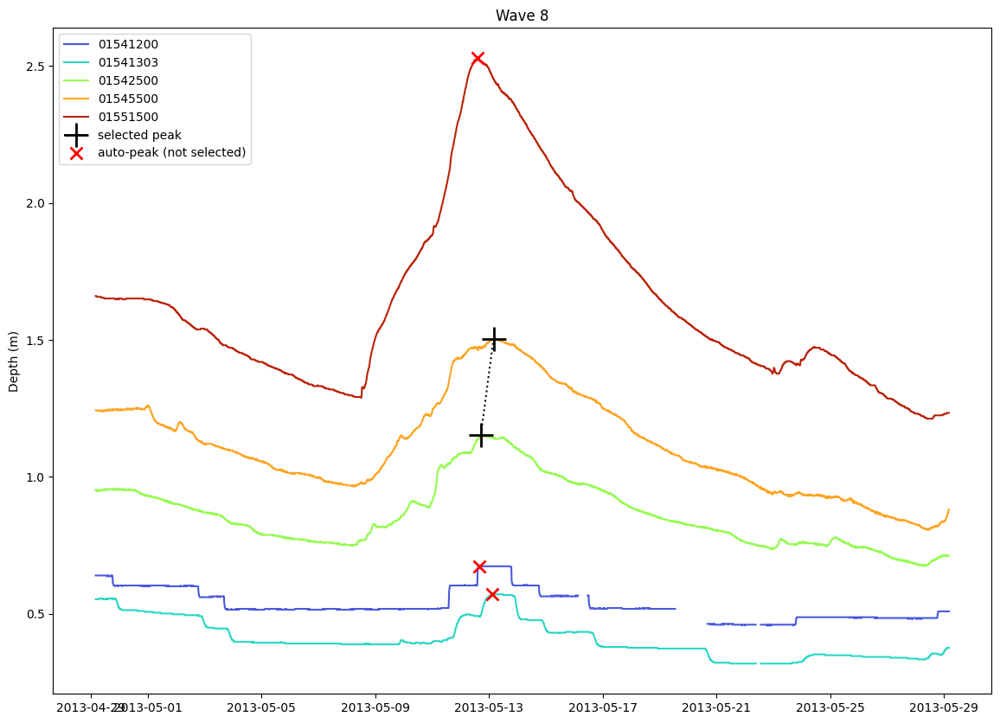

(01541200                         NaT
 01541303                         NaT
 01542500   2013-05-12 17:00:00+00:00
 01545500   2013-05-13 03:45:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.153252
 01545500    1.504742
 01551500         NaN
 dtype: float64)

In [20]:
wave = 8
adjustment = pd.Timedelta('210 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'',
          #'01545500':'',
          '01551500':'skip',
         }

start = time0 + adjustment
period = '30 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

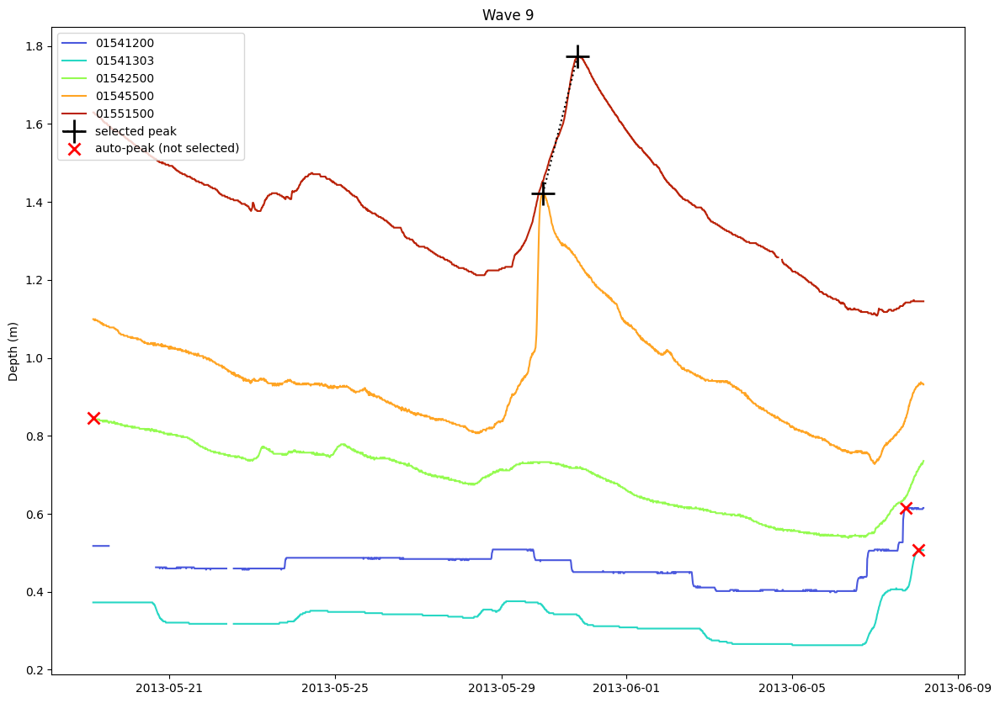

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-05-30 00:00:00+00:00
 01551500   2013-05-30 20:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.422446
 01551500    1.773031
 dtype: float64)

In [21]:
wave = 9
adjustment = pd.Timedelta('230 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'',
          #'01551500':'',
         }

start = time0 + adjustment
period = '20 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

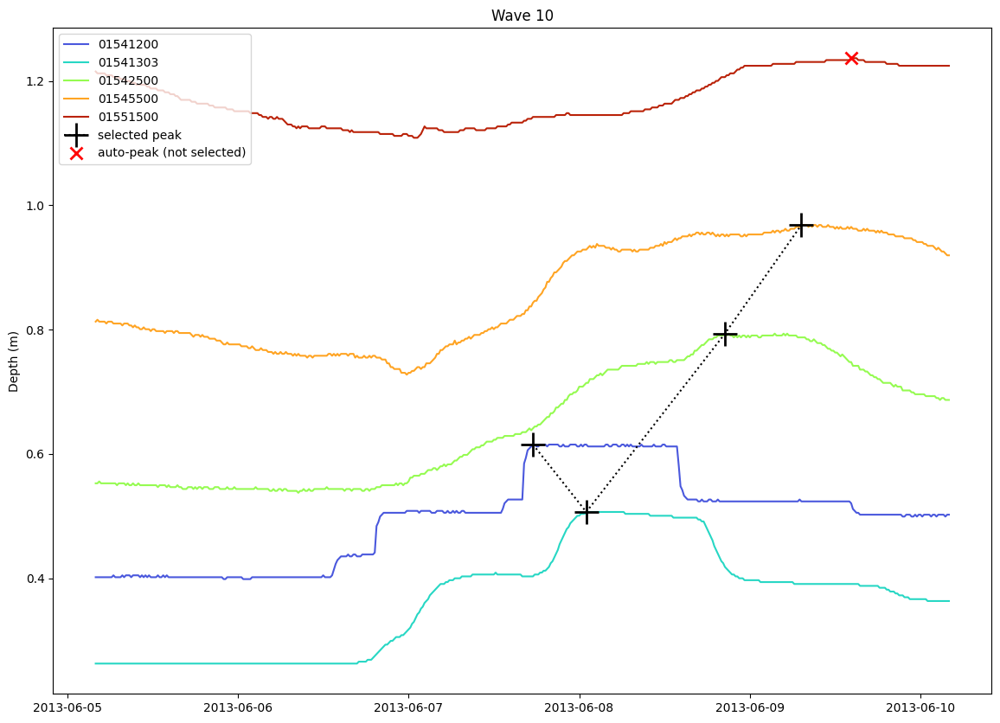

(01541200   2013-06-07 17:30:00+00:00
 01541303   2013-06-08 01:00:00+00:00
 01542500   2013-06-08 20:30:00+00:00
 01545500   2013-06-09 07:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.615131
 01541303    0.506716
 01542500    0.793588
 01545500    0.968294
 01551500         NaN
 dtype: float64)

In [22]:
wave = 10
adjustment = pd.Timedelta('247 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          '01551500':'skip',
         }

start = time0 + adjustment
period = '5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

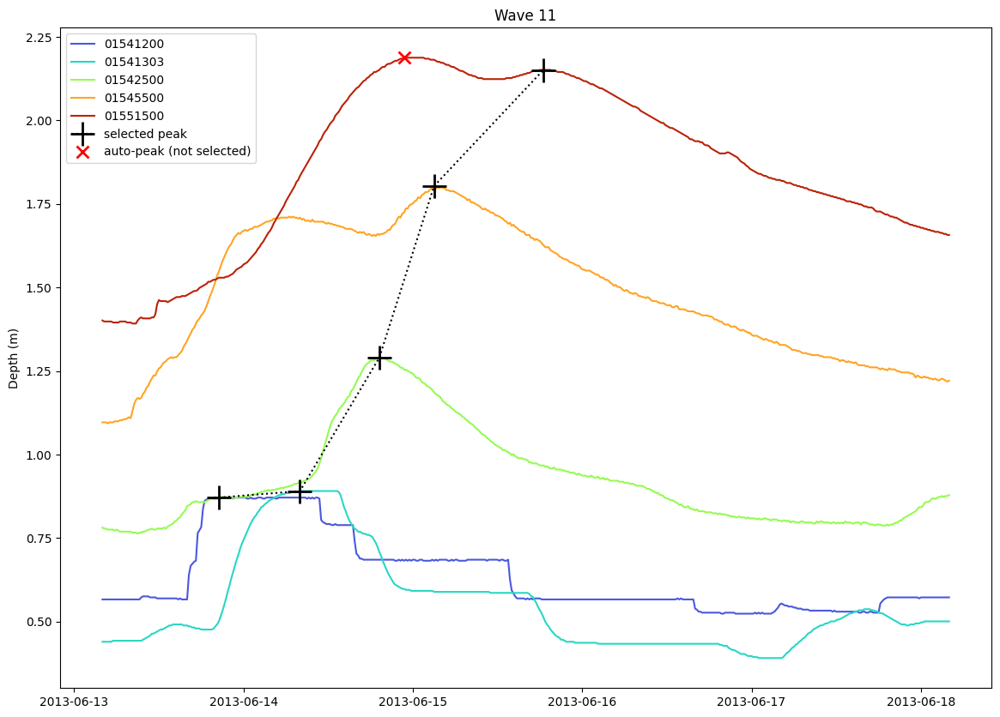

(01541200   2013-06-13 20:30:00+00:00
 01541303   2013-06-14 08:00:00+00:00
 01542500   2013-06-14 19:15:00+00:00
 01545500   2013-06-15 03:00:00+00:00
 01551500   2013-06-15 18:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.871163
 01541303    0.890764
 01542500    1.290412
 01545500    1.803446
 01551500    2.150983
 dtype: float64)

In [23]:
wave = 11
adjustment = pd.Timedelta('255 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          '01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

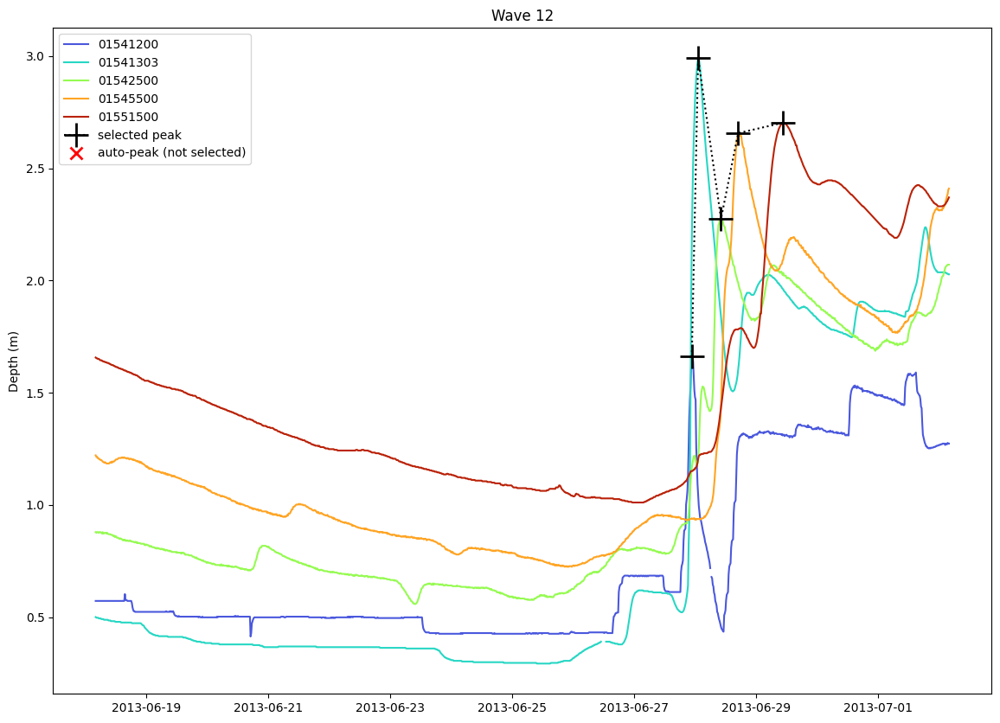

(01541200   2013-06-27 22:45:00+00:00
 01541303   2013-06-28 01:15:00+00:00
 01542500   2013-06-28 10:15:00+00:00
 01545500   2013-06-28 17:00:00+00:00
 01551500   2013-06-29 10:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.660595
 01541303    2.990836
 01542500    2.274916
 01545500    2.656886
 01551500    2.702671
 dtype: float64)

In [24]:
wave = 12
adjustment = pd.Timedelta('260 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '14 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

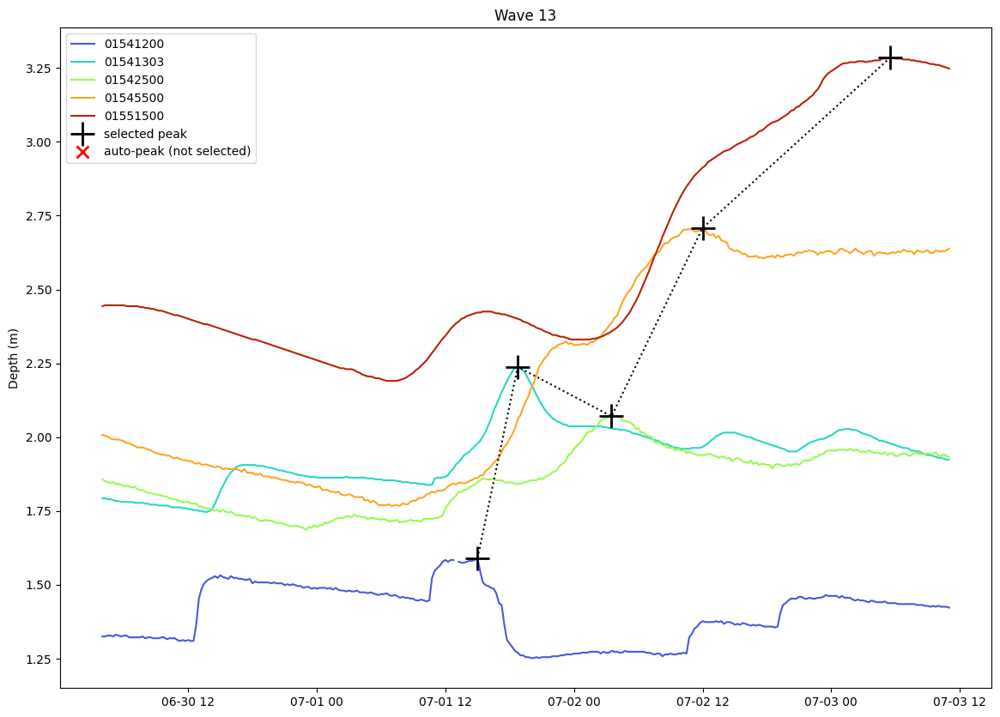

(01541200   2013-07-01 15:00:00+00:00
 01541303   2013-07-01 18:45:00+00:00
 01542500   2013-07-02 03:30:00+00:00
 01545500   2013-07-02 12:00:00+00:00
 01551500   2013-07-03 05:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.590491
 01541303    2.237980
 01542500    2.070700
 01545500    2.708702
 01551500    3.284839
 dtype: float64)

In [25]:
wave = 13
adjustment = pd.Timedelta('272 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '3.3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

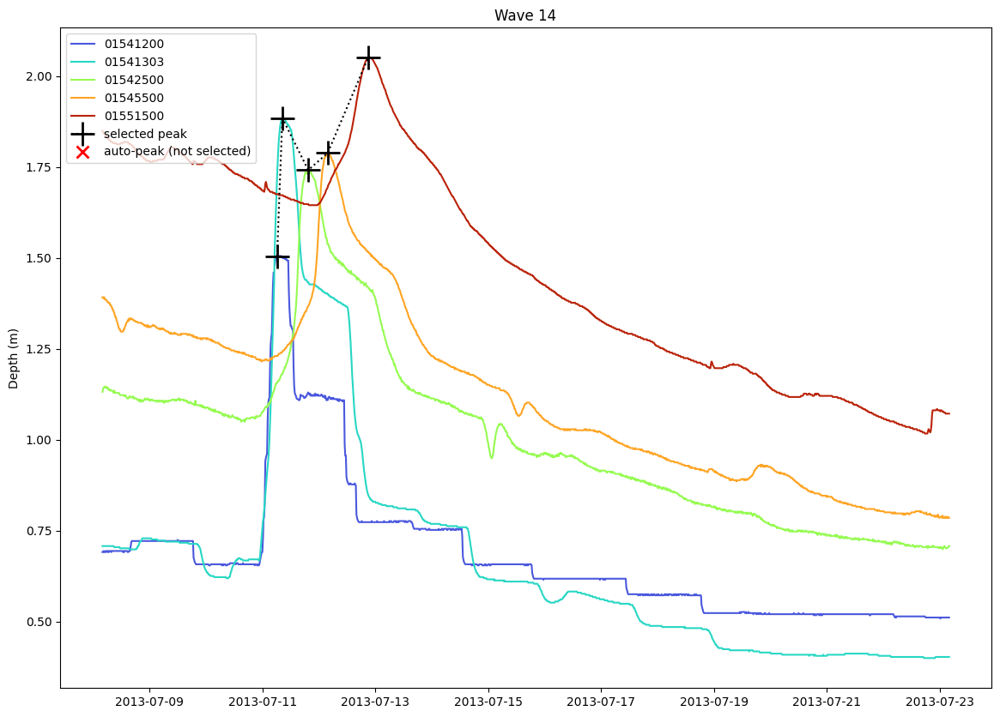

(01541200   2013-07-11 06:15:00+00:00
 01541303   2013-07-11 08:30:00+00:00
 01542500   2013-07-11 19:30:00+00:00
 01545500   2013-07-12 03:45:00+00:00
 01551500   2013-07-12 21:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.505147
 01541303    1.884412
 01542500    1.741516
 01545500    1.788206
 01551500    2.050399
 dtype: float64)

In [26]:
wave = 14
adjustment = pd.Timedelta('280 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '15 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

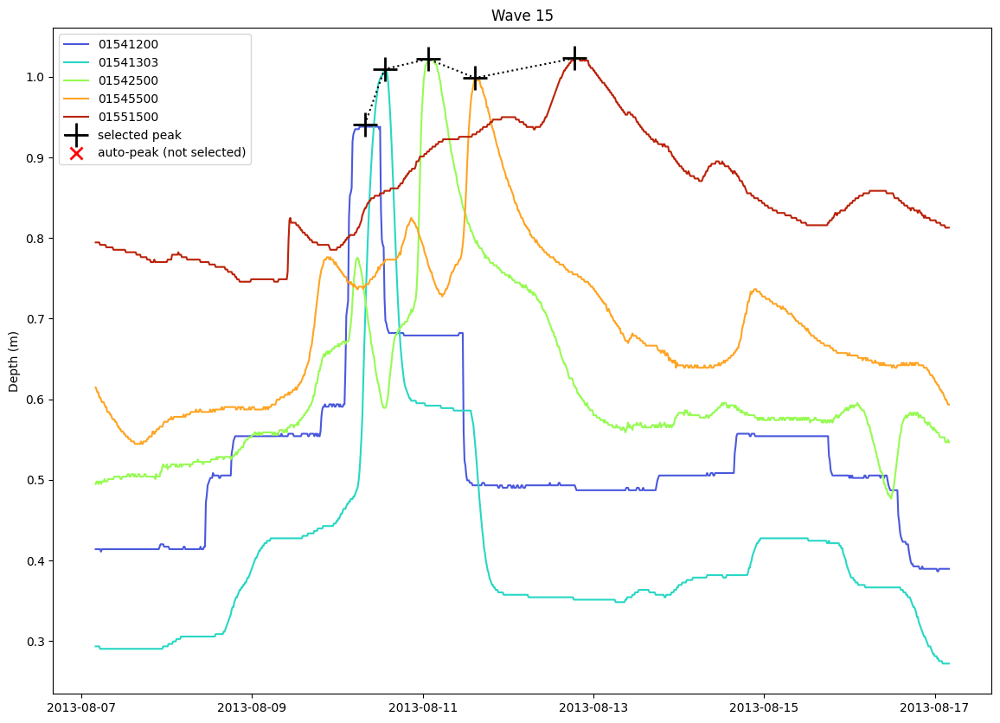

(01541200   2013-08-10 07:45:00+00:00
 01541303   2013-08-10 13:15:00+00:00
 01542500   2013-08-11 01:30:00+00:00
 01545500   2013-08-11 14:45:00+00:00
 01551500   2013-08-12 18:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.941267
 01541303    1.009636
 01542500    1.022188
 01545500    0.998774
 01551500    1.023223
 dtype: float64)

In [27]:
wave = 15
adjustment = pd.Timedelta('310 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

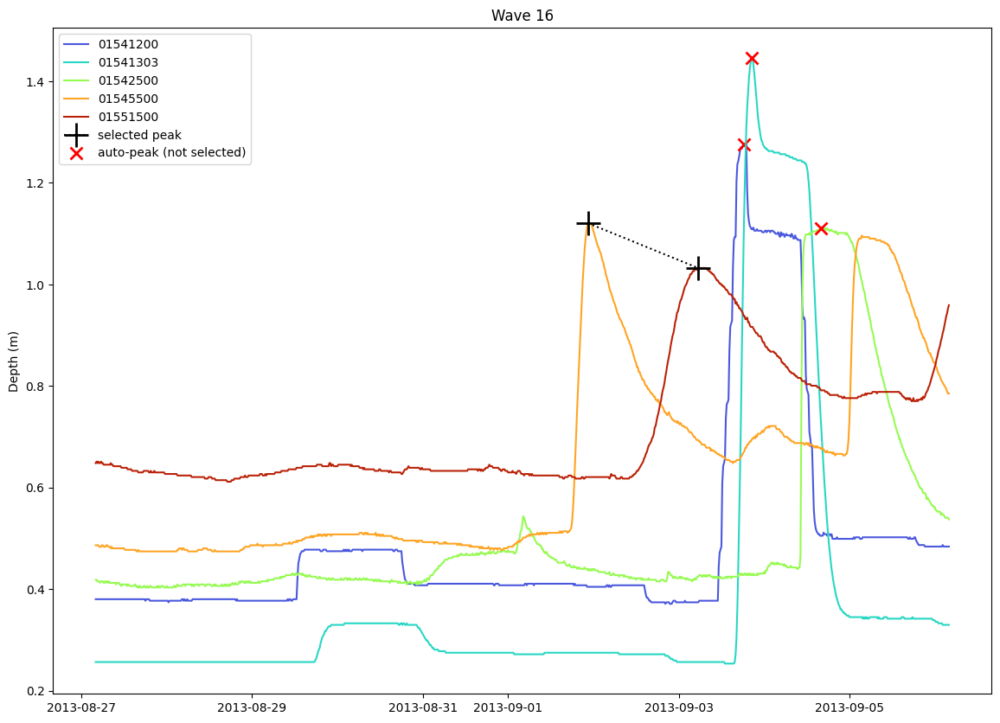

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-09-01 22:30:00+00:00
 01551500   2013-09-03 05:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.120694
 01551500    1.032367
 dtype: float64)

In [28]:
wave = 16
adjustment = pd.Timedelta('330 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

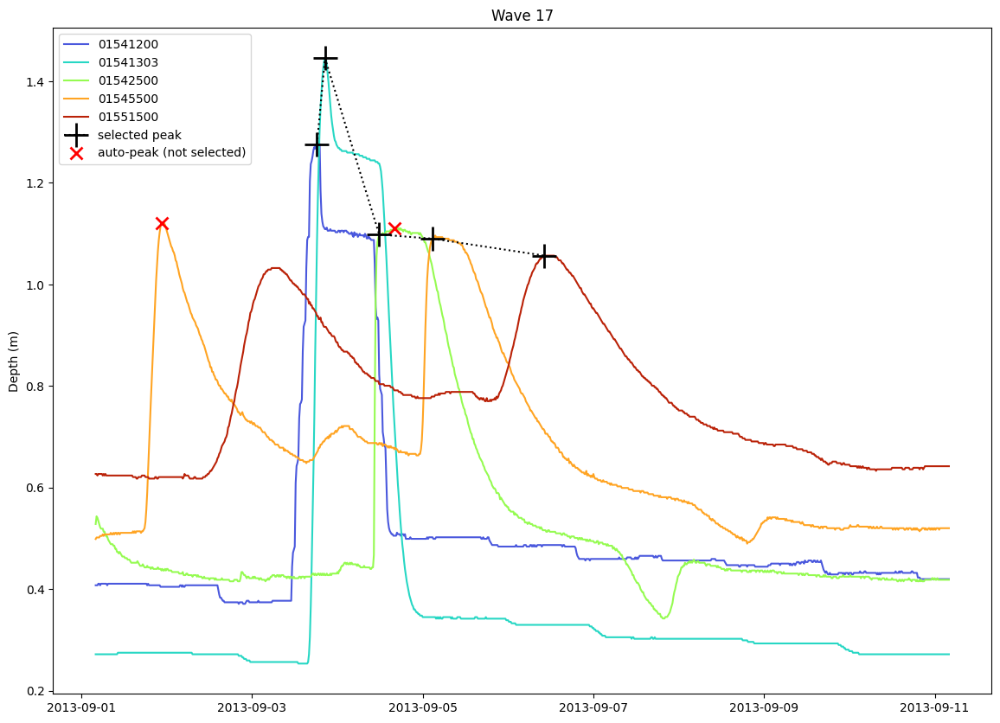

(01541200   2013-09-03 18:15:00+00:00
 01541303   2013-09-03 20:30:00+00:00
 01542500   2013-09-04 11:45:00+00:00
 01545500   2013-09-05 02:45:00+00:00
 01551500   2013-09-06 10:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.276547
 01541303    1.445500
 01542500    1.098388
 01545500    1.090214
 01551500    1.056751
 dtype: float64)

In [29]:
wave = 17
adjustment = pd.Timedelta('335 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'2013-09-04 11:45:00+00:00',
          '01545500':'2013-09-05 02:45:00+00:00',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

# Data Collection for Year 2

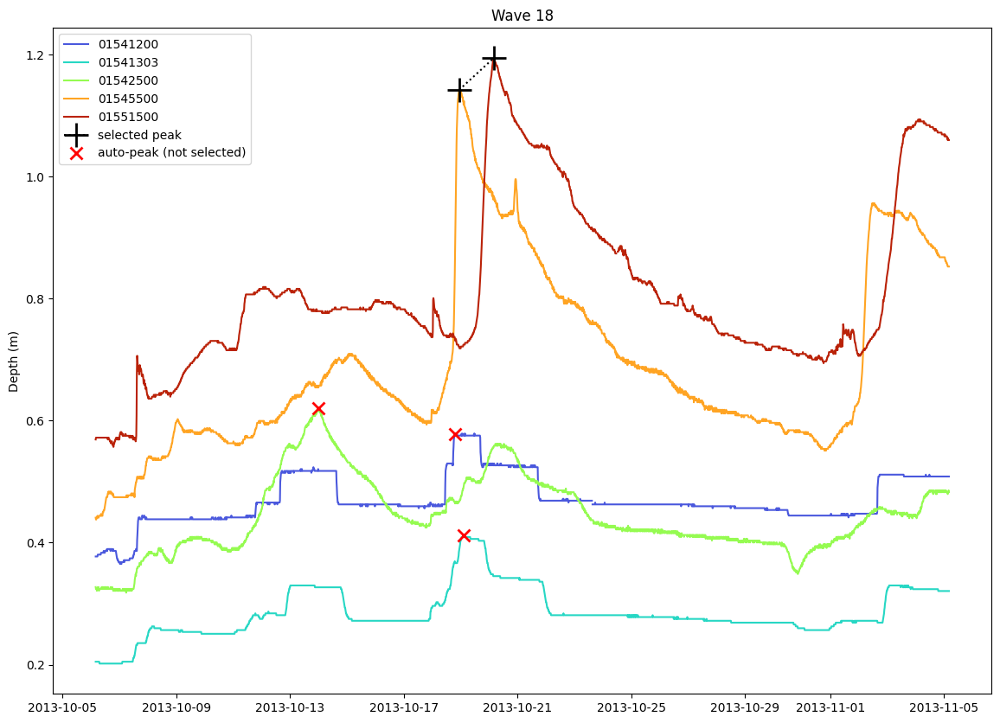

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-10-18 22:45:00+00:00
 01551500   2013-10-20 03:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.142030
 01551500    1.193911
 dtype: float64)

In [30]:
wave = 18
adjustment = pd.Timedelta('370 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '30 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

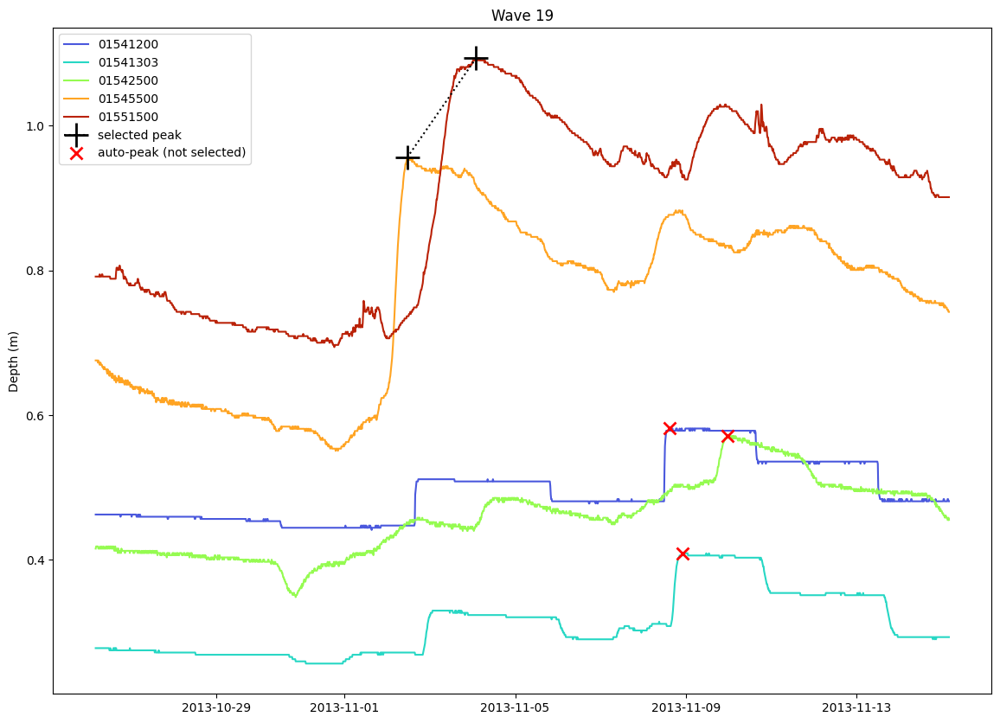

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-11-02 11:15:00+00:00
 01551500   2013-11-04 02:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    0.956102
 01551500    1.093327
 dtype: float64)

In [31]:
wave = 19
adjustment = pd.Timedelta('390 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '20 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

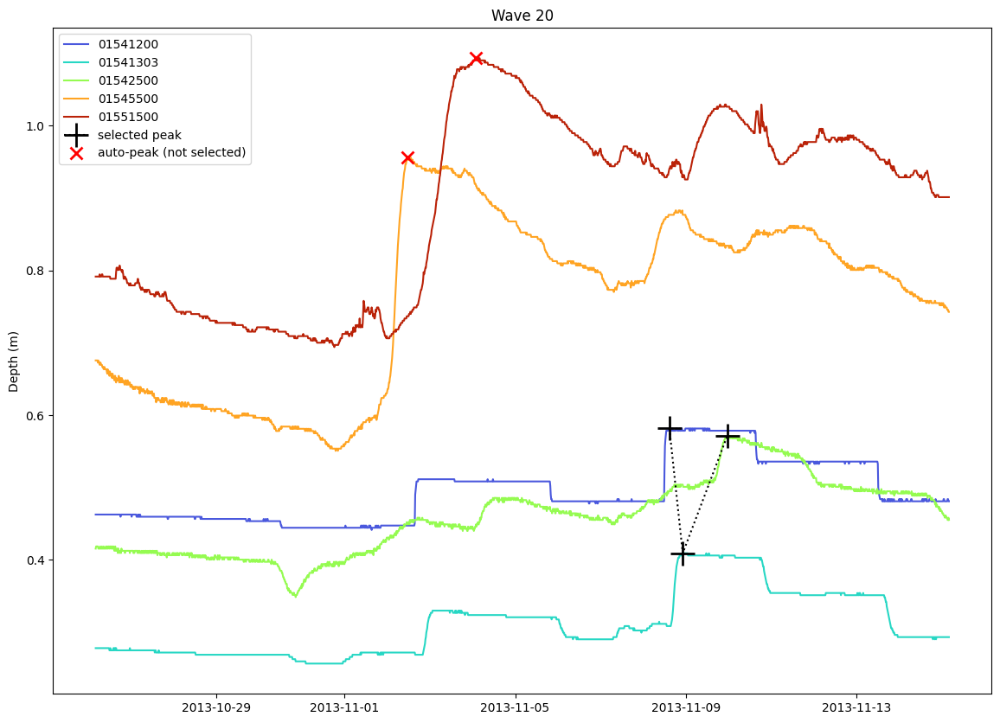

(01541200   2013-11-08 14:45:00+00:00
 01541303   2013-11-08 22:15:00+00:00
 01542500   2013-11-09 23:15:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.581603
 01541303    0.409180
 01542500    0.571084
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [32]:
wave = 20
adjustment = pd.Timedelta('390 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          '01545500':'skip',
          '01551500':'skip',
         }

start = time0 + adjustment
period = '20 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

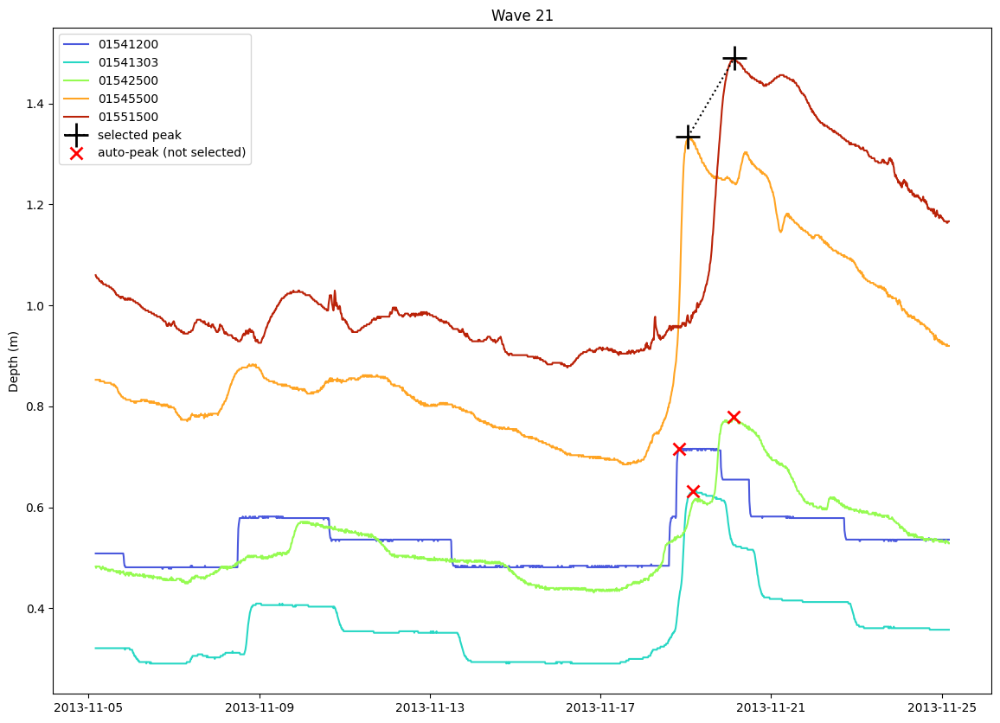

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-11-19 01:15:00+00:00
 01551500   2013-11-20 03:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.334054
 01551500    1.489567
 dtype: float64)

In [33]:
wave = 21
adjustment = pd.Timedelta('400 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-06-15 18:30:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '20 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

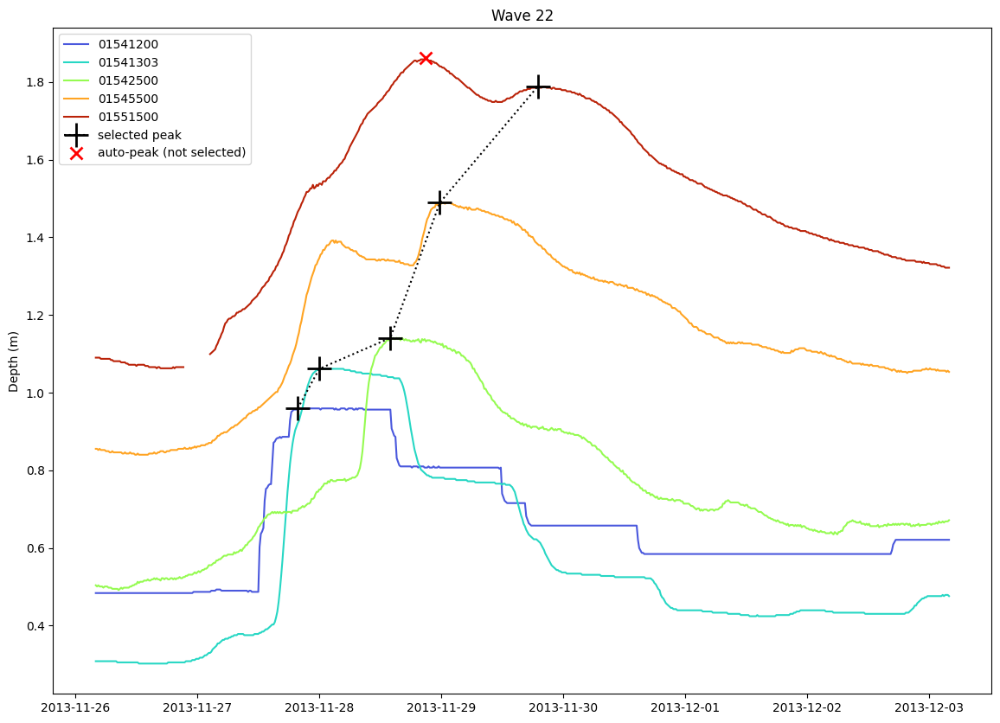

(01541200   2013-11-27 19:45:00+00:00
 01541303   2013-11-28 00:00:00+00:00
 01542500   2013-11-28 14:00:00+00:00
 01545500   2013-11-28 23:45:00+00:00
 01551500   2013-11-29 19:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.959555
 01541303    1.061452
 01542500    1.141060
 01545500    1.489502
 01551500    1.788271
 dtype: float64)

In [34]:
wave = 22
adjustment = pd.Timedelta('421 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          '01551500':'2013-11-29 19:00:00+00:00', #selecting this way is crude!
         }

start = time0 + adjustment
period = '7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

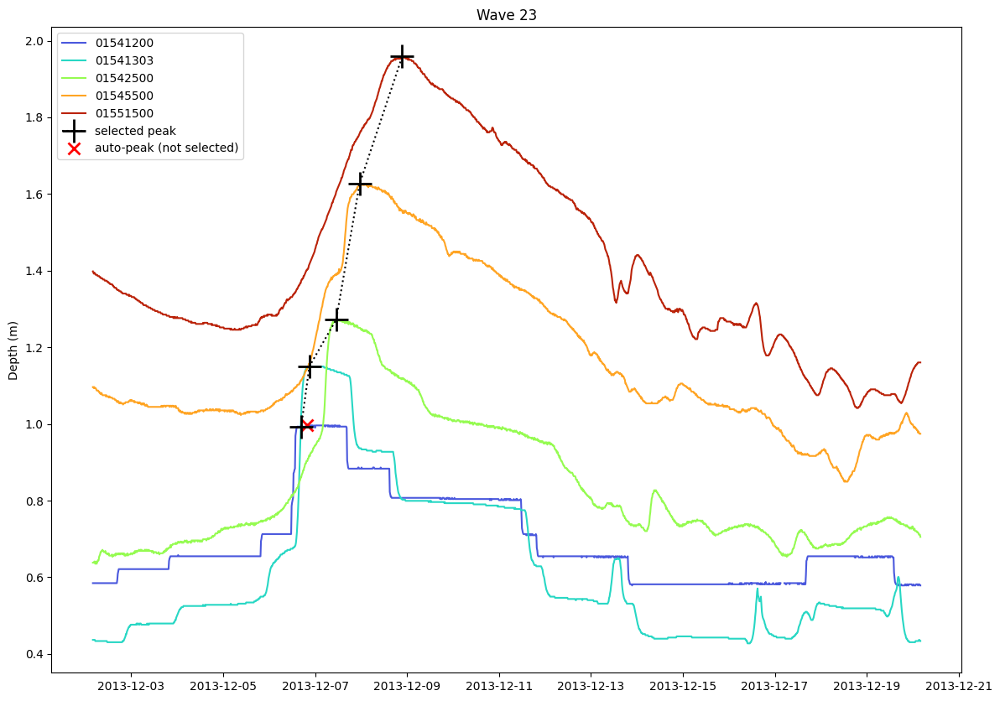

(01541200   2013-12-06 16:45:00+00:00
 01541303   2013-12-06 21:00:00+00:00
 01542500   2013-12-07 11:00:00+00:00
 01545500   2013-12-07 23:15:00+00:00
 01551500   2013-12-08 21:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.993083
 01541303    1.149844
 01542500    1.272124
 01545500    1.626662
 01551500    1.958959
 dtype: float64)

In [35]:
wave = 23
adjustment = pd.Timedelta('427 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2013-12-06 16:45:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-11-29 19:00:00+00:00', 
         }

start = time0 + adjustment
period = '18 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

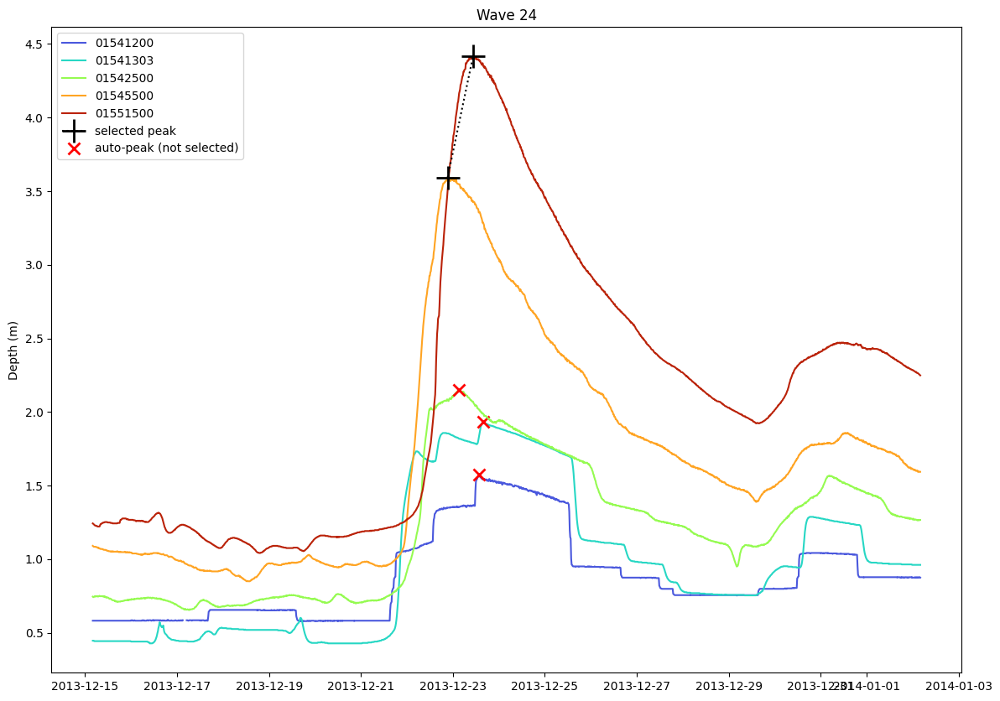

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-12-22 21:15:00+00:00
 01551500   2013-12-23 10:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    3.592622
 01551500    4.415647
 dtype: float64)

In [36]:
wave = 24
adjustment = pd.Timedelta('440 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'',
          #'01551500':'2013-11-29 19:00:00+00:00', 
         }

start = time0 + adjustment
period = '18 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

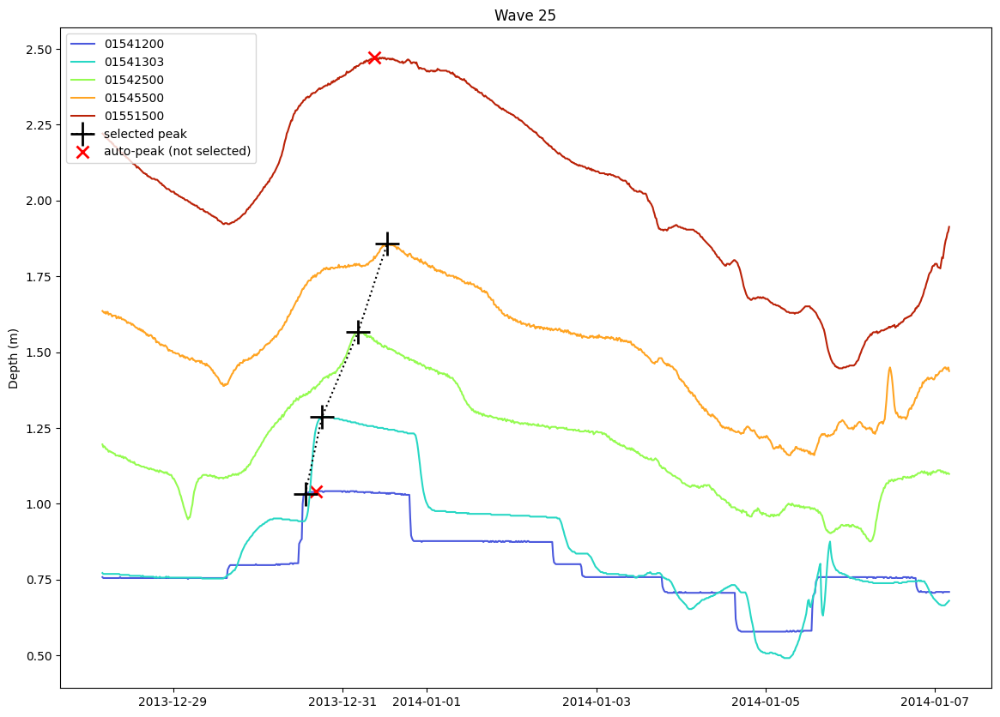

(01541200   2013-12-30 13:30:00+00:00
 01541303   2013-12-30 18:15:00+00:00
 01542500   2013-12-31 04:30:00+00:00
 01545500   2013-12-31 12:45:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.032707
 01541303    1.287004
 01542500    1.567780
 01545500    1.858310
 01551500         NaN
 dtype: float64)

In [37]:
wave = 25
adjustment = pd.Timedelta('453 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2013-12-30 13:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

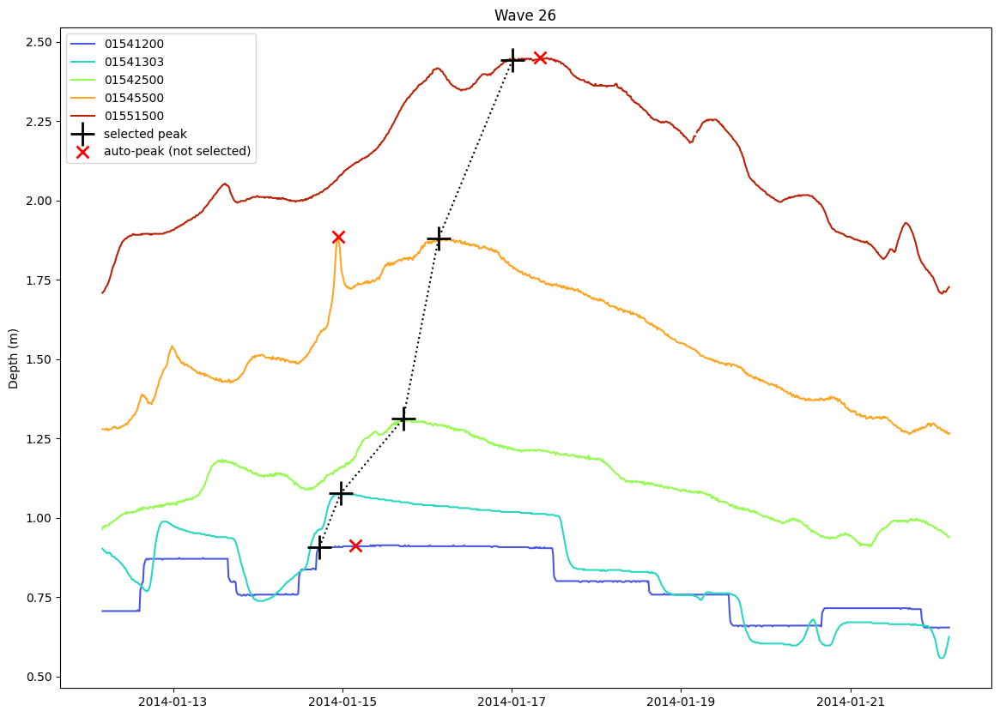

(01541200   2014-01-14 17:30:00+00:00
 01541303   2014-01-14 23:30:00+00:00
 01542500   2014-01-15 17:15:00+00:00
 01545500   2014-01-16 03:15:00+00:00
 01551500   2014-01-17 00:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.907739
 01541303    1.076692
 01542500    1.311748
 01545500    1.879646
 01551500    2.443591
 dtype: float64)

In [38]:
wave = 26
adjustment = pd.Timedelta('468 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-01-14 17:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          '01545500':'2014-01-16 03:15:00+00:00',
          '01551500':'2014-01-17 00:15:00+00:00', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

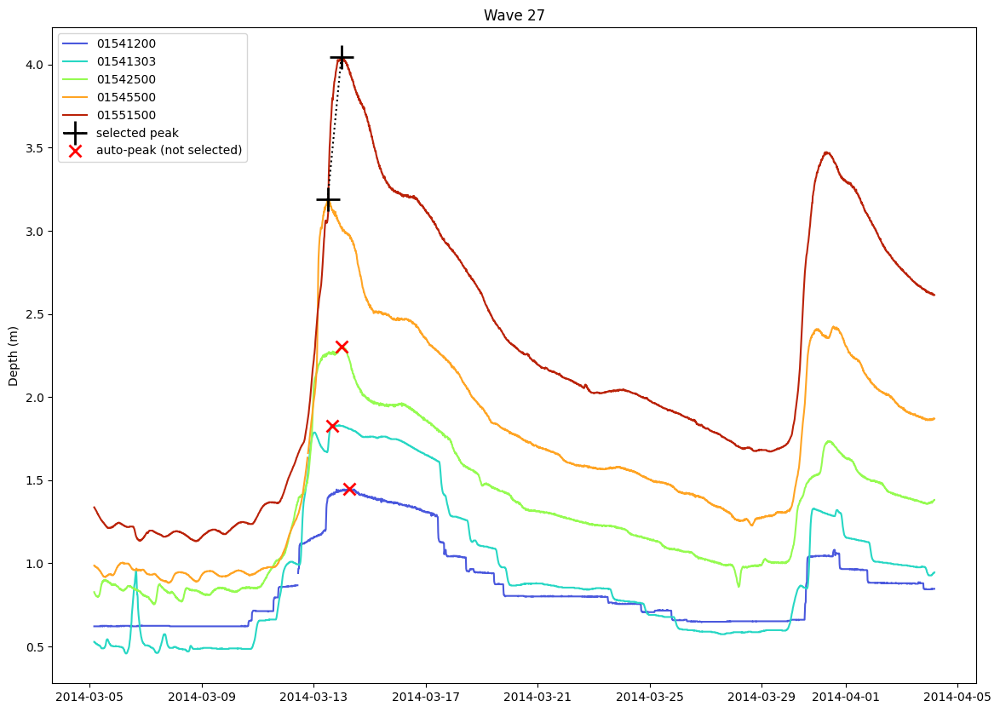

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2014-03-13 12:00:00+00:00
 01551500   2014-03-13 23:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    3.187238
 01551500    4.043791
 dtype: float64)

In [39]:
wave = 27
adjustment = pd.Timedelta('520 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'2014-01-16 03:15:00+00:00',
          #'01551500':'2013-11-29 19:00:00+00:00', 
         }

start = time0 + adjustment
period = '30 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

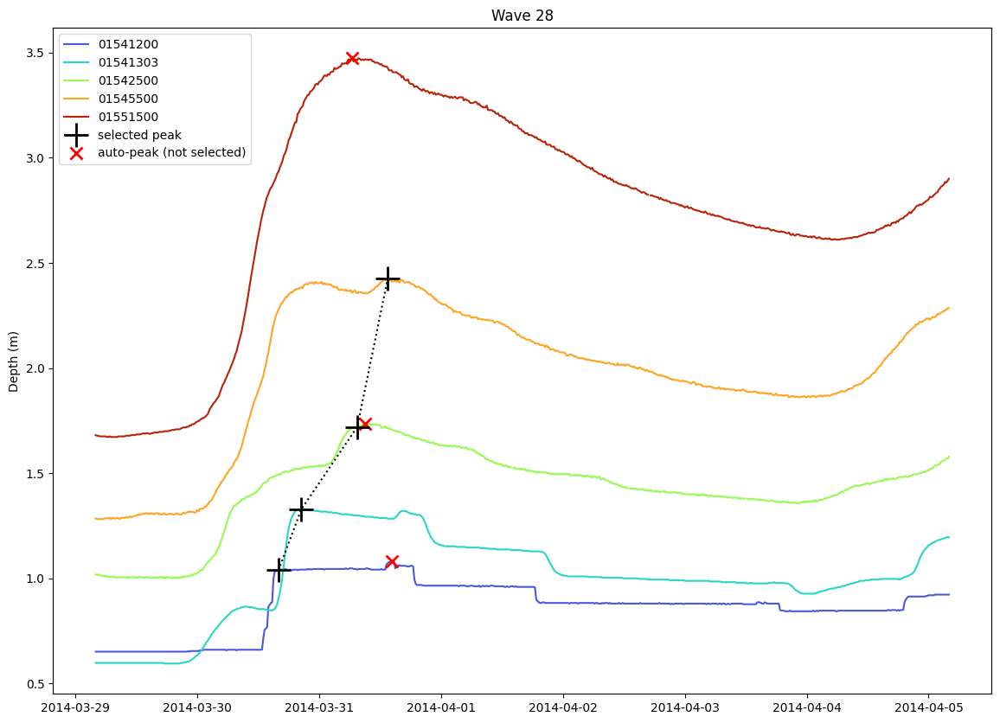

(01541200   2014-03-30 16:00:00+00:00
 01541303   2014-03-30 20:30:00+00:00
 01542500   2014-03-31 07:30:00+00:00
 01545500   2014-03-31 13:30:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.038803
 01541303    1.329676
 01542500    1.720180
 01545500    2.425238
 01551500         NaN
 dtype: float64)

In [40]:
wave = 28
adjustment = pd.Timedelta('544 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-03-30 16:00:00+00:00',
          #'01541303':'skip',
          '01542500':'2014-03-31 07:30:00+00:00',
          #'01545500':'2014-01-16 03:15:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

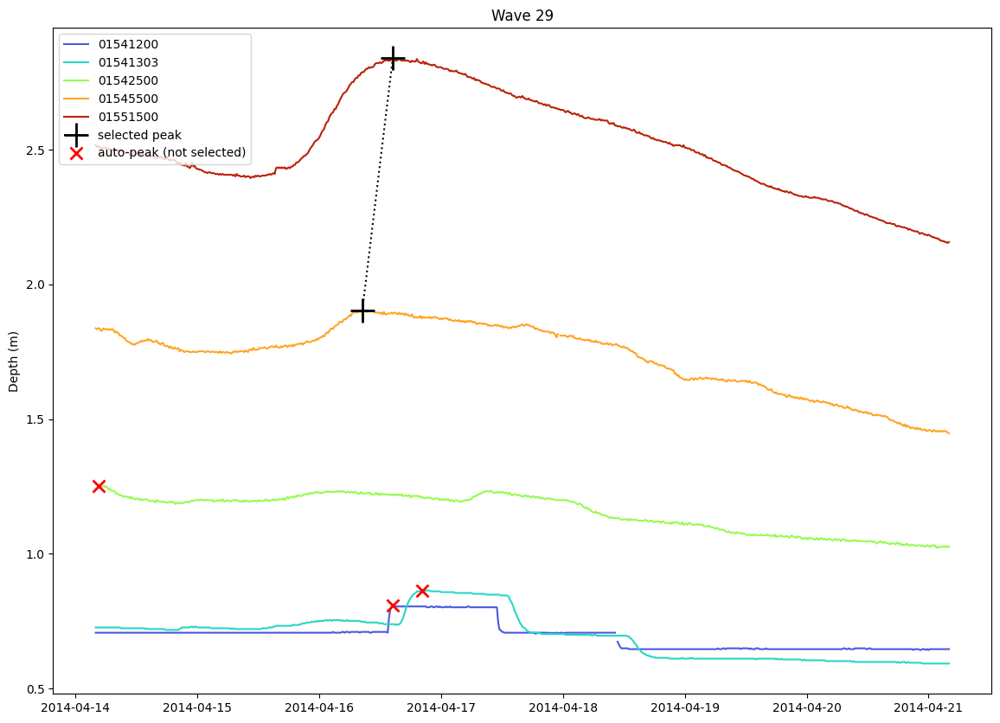

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2014-04-16 08:30:00+00:00
 01551500   2014-04-16 14:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.904030
 01551500    2.839831
 dtype: float64)

In [41]:
wave = 29
adjustment = pd.Timedelta('560 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'2014-01-16 03:15:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

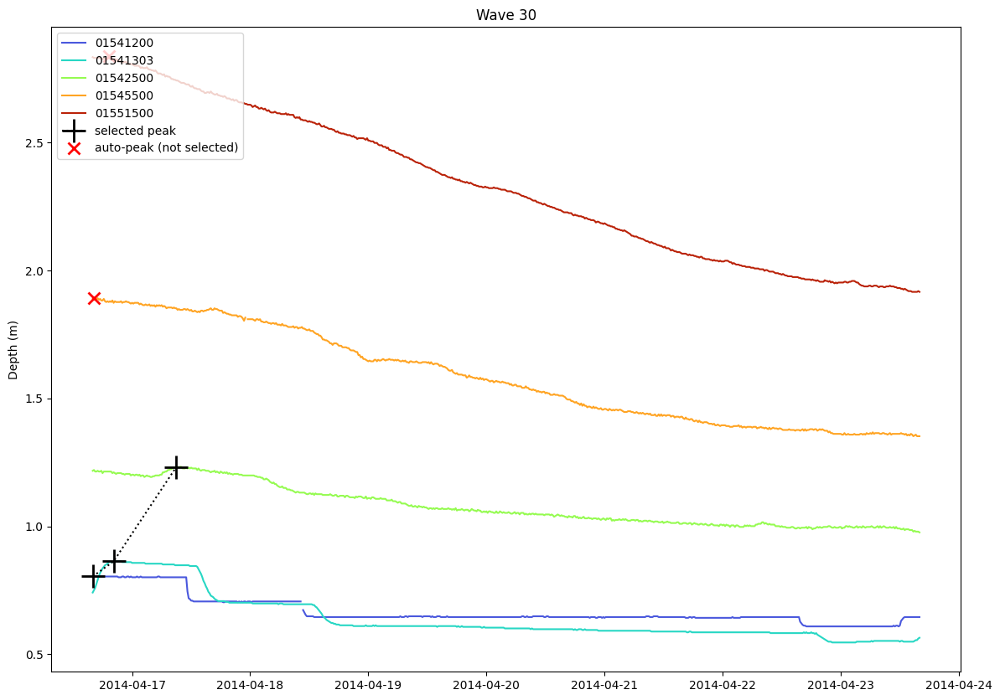

(01541200   2014-04-16 16:00:00+00:00
 01541303   2014-04-16 20:15:00+00:00
 01542500   2014-04-17 09:00:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.804107
 01541303    0.863332
 01542500    1.232500
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [42]:
wave = 30
adjustment = pd.Timedelta('562 days 12 hours') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

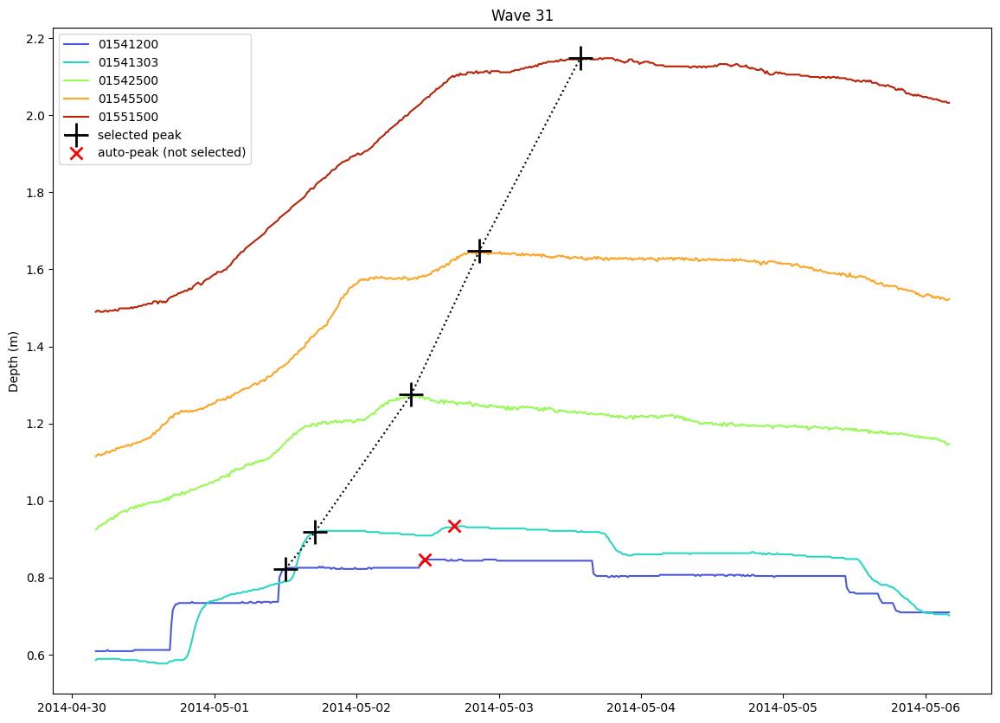

(01541200   2014-05-01 12:00:00+00:00
 01541303   2014-05-01 17:00:00+00:00
 01542500   2014-05-02 09:15:00+00:00
 01545500   2014-05-02 20:45:00+00:00
 01551500   2014-05-03 13:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.822395
 01541303    0.918196
 01542500    1.275172
 01545500    1.647998
 01551500    2.147935
 dtype: float64)

In [43]:
wave = 31
adjustment = pd.Timedelta('576 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-05-01 12:00:00+00:00',
          '01541303':'2014-05-01 17:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

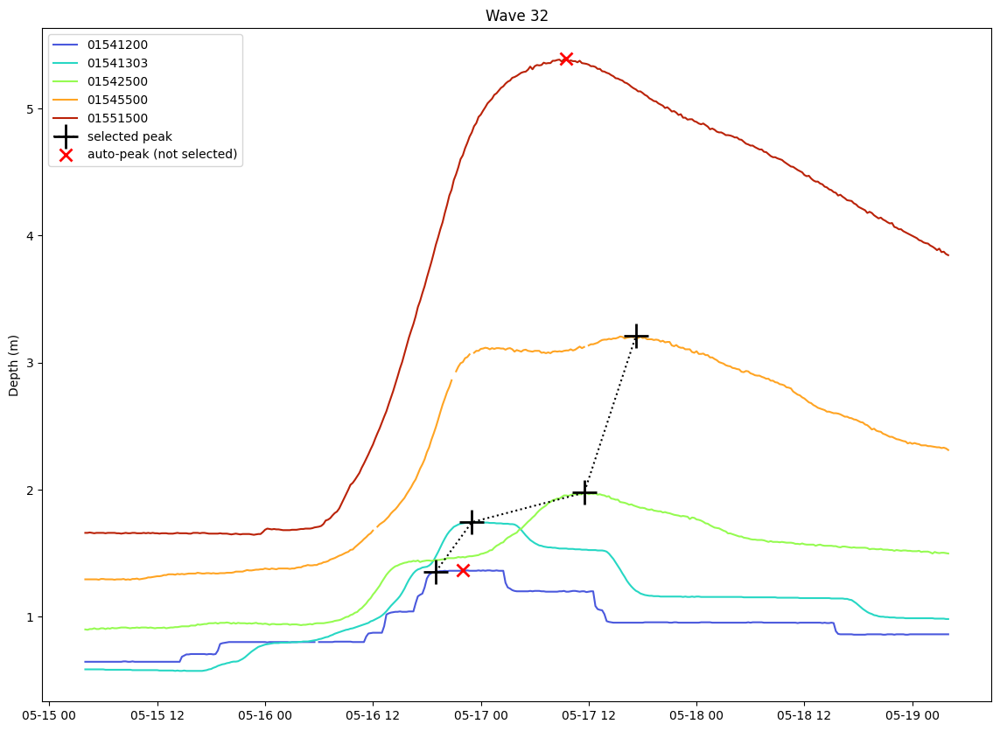

(01541200   2014-05-16 19:00:00+00:00
 01541303   2014-05-16 23:00:00+00:00
 01542500   2014-05-17 11:30:00+00:00
 01545500   2014-05-17 17:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.355795
 01541303    1.744204
 01542500    1.976212
 01545500    3.208574
 01551500         NaN
 dtype: float64)

In [44]:
wave = 32
adjustment = pd.Timedelta('591 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-05-16 19:00:00+00:00',
          #'01541303':'2014-05-01 17:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

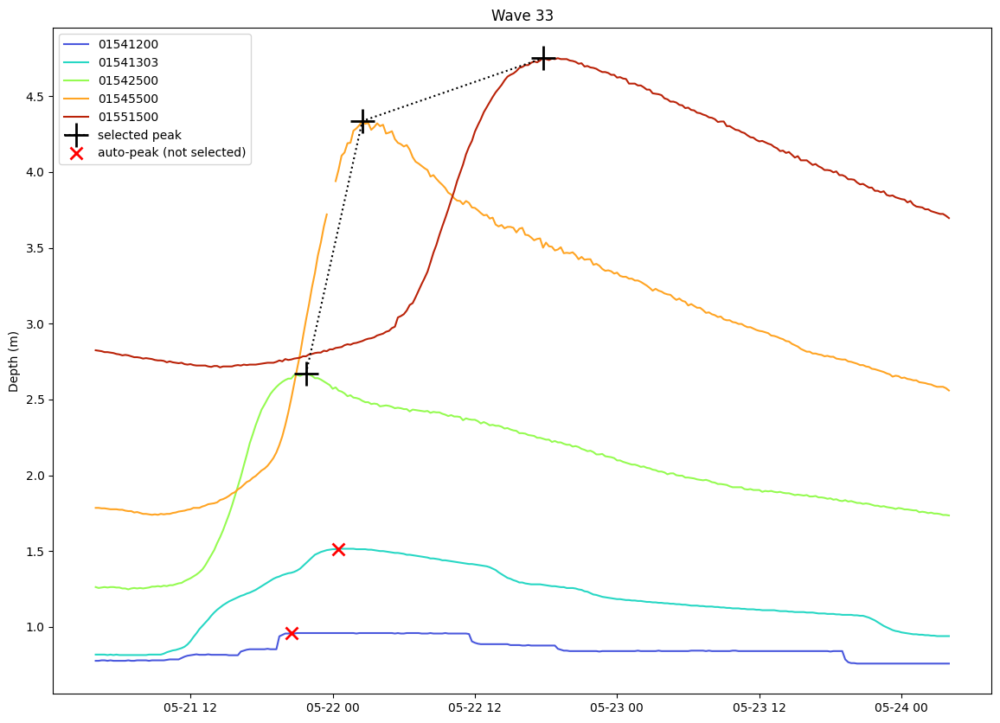

(01541200                         NaT
 01541303                         NaT
 01542500   2014-05-21 21:45:00+00:00
 01545500   2014-05-22 02:30:00+00:00
 01551500   2014-05-22 17:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    2.671156
 01545500    4.336334
 01551500    4.750927
 dtype: float64)

In [45]:
wave = 33
adjustment = pd.Timedelta('597 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500':'2014-05-22 03:15:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

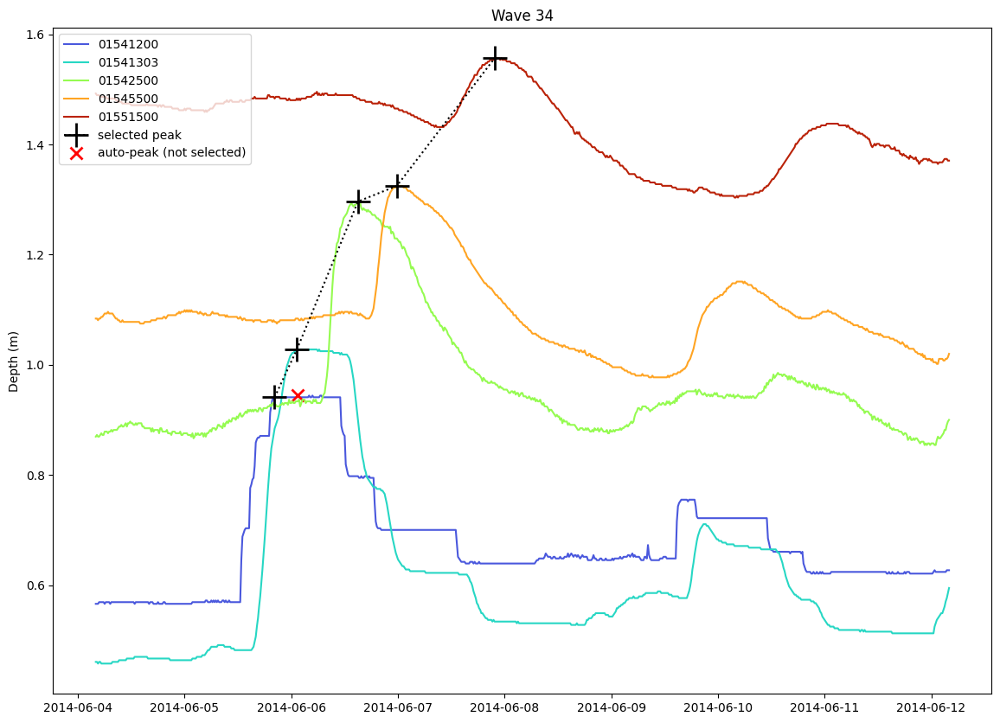

(01541200   2014-06-05 20:15:00+00:00
 01541303   2014-06-06 01:15:00+00:00
 01542500   2014-06-06 15:00:00+00:00
 01545500   2014-06-06 23:45:00+00:00
 01551500   2014-06-07 21:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.941267
 01541303    1.027924
 01542500    1.296508
 01545500    1.324910
 01551500    1.556623
 dtype: float64)

In [46]:
wave = 34
adjustment = pd.Timedelta('611 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-06-05 20:15:00+00:00',
          #'01541303':'2014-05-01 17:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

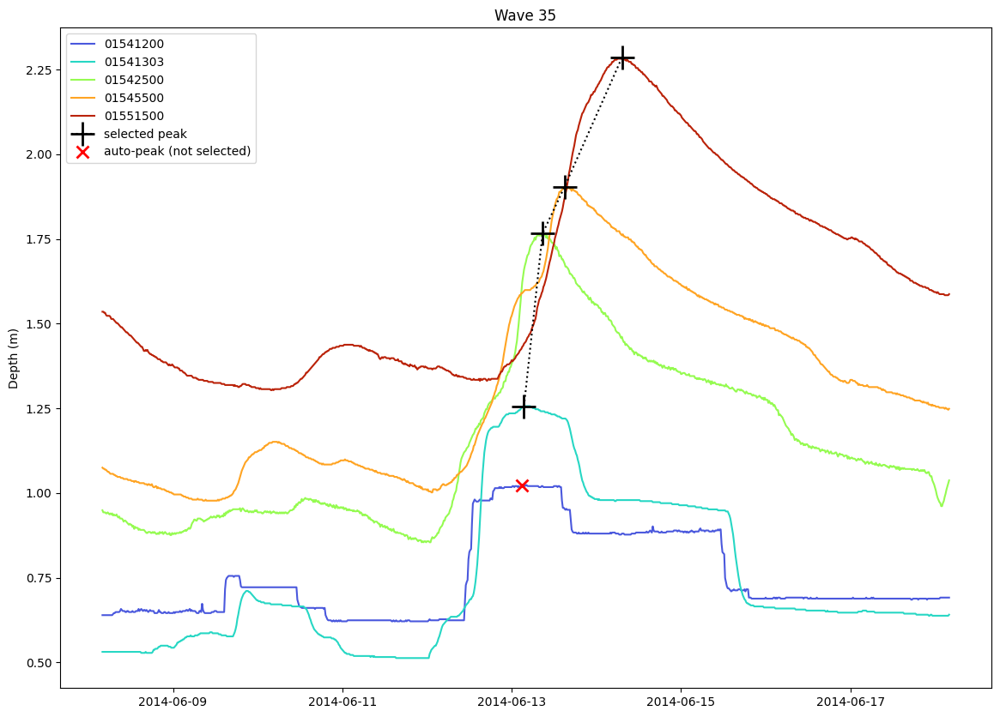

(01541200                         NaT
 01541303   2014-06-13 03:30:00+00:00
 01542500   2014-06-13 08:45:00+00:00
 01545500   2014-06-13 15:00:00+00:00
 01551500   2014-06-14 07:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303    1.256524
 01542500    1.765900
 01545500    1.904030
 01551500    2.285095
 dtype: float64)

In [47]:
wave = 35
adjustment = pd.Timedelta('615 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          #'01541303':'2014-05-01 17:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

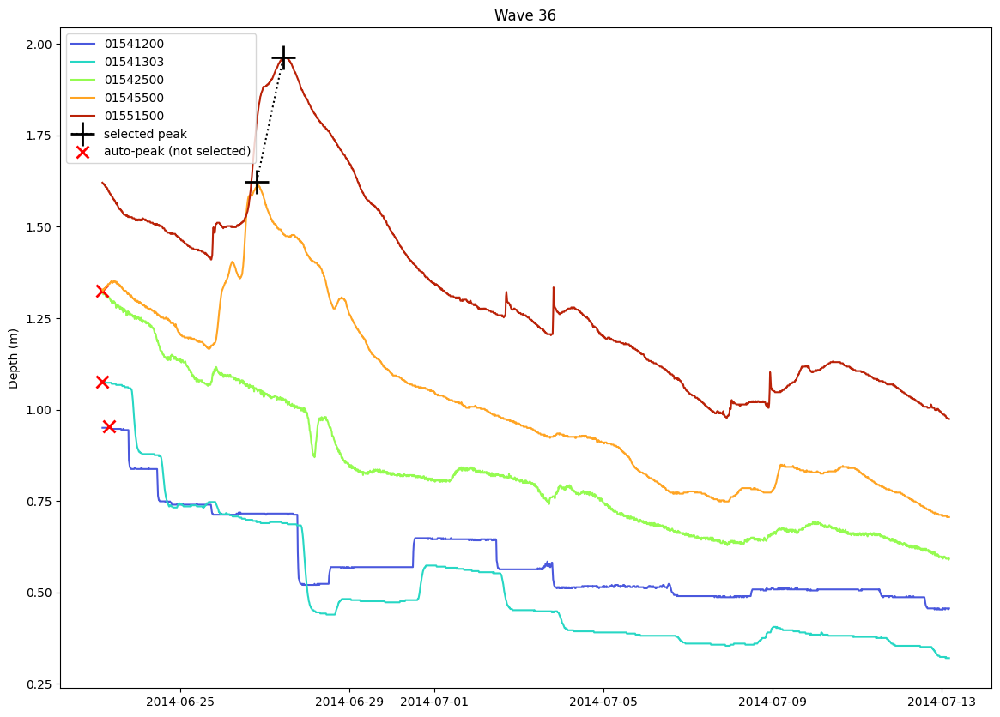

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2014-06-26 19:30:00+00:00
 01551500   2014-06-27 10:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.623614
 01551500    1.962007
 dtype: float64)

In [48]:
wave = 36
adjustment = pd.Timedelta('630 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '20 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

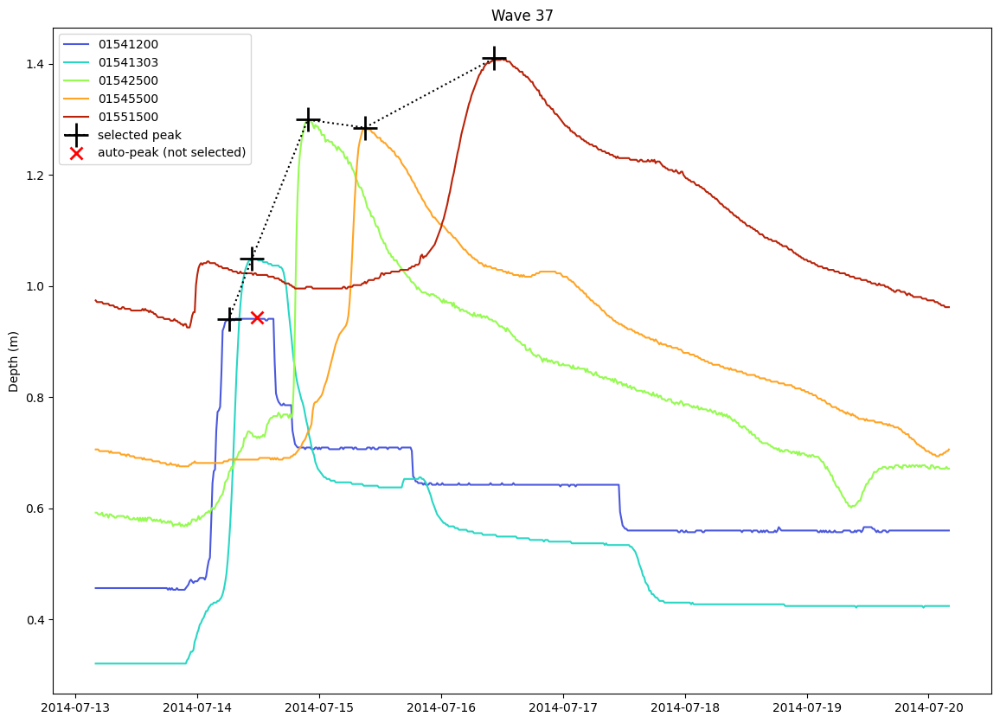

(01541200   2014-07-14 06:15:00+00:00
 01541303   2014-07-14 10:45:00+00:00
 01542500   2014-07-14 21:45:00+00:00
 01545500   2014-07-15 09:00:00+00:00
 01551500   2014-07-16 10:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.941267
 01541303    1.049260
 01542500    1.299556
 01545500    1.285286
 01551500    1.410319
 dtype: float64)

In [49]:
wave = 37
adjustment = pd.Timedelta('650 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-07-14 6:15:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

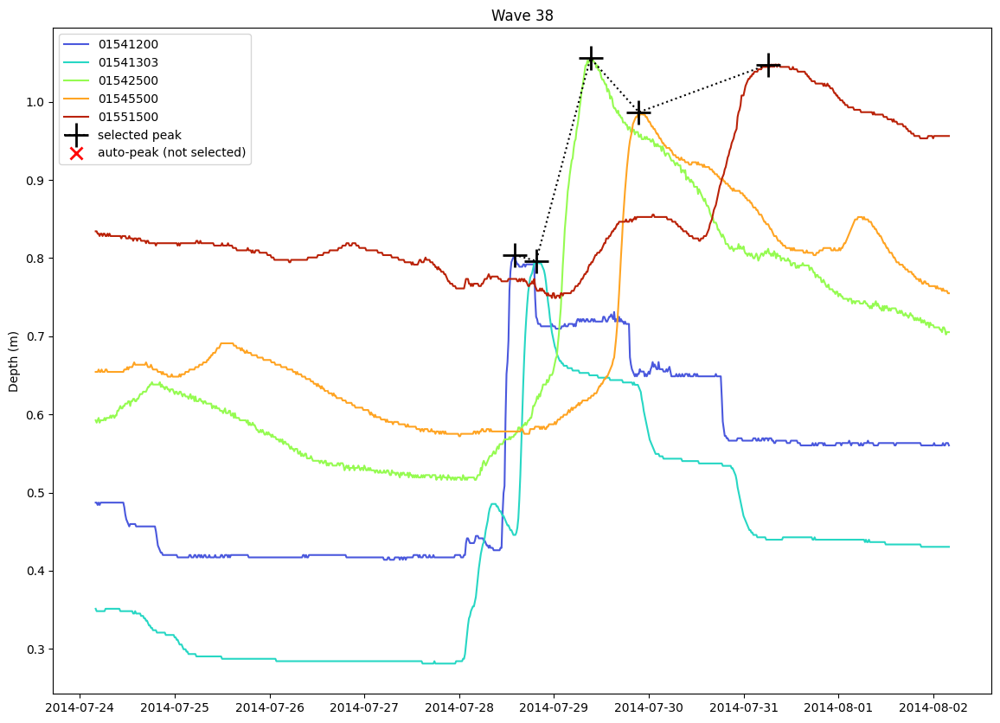

(01541200   2014-07-28 14:00:00+00:00
 01541303   2014-07-28 19:30:00+00:00
 01542500   2014-07-29 09:15:00+00:00
 01545500   2014-07-29 21:30:00+00:00
 01551500   2014-07-31 06:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.804107
 01541303    0.796276
 01542500    1.055716
 01545500    0.986582
 01551500    1.047607
 dtype: float64)

In [50]:
wave = 38
adjustment = pd.Timedelta('661 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2014-07-14 6:15:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '9 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

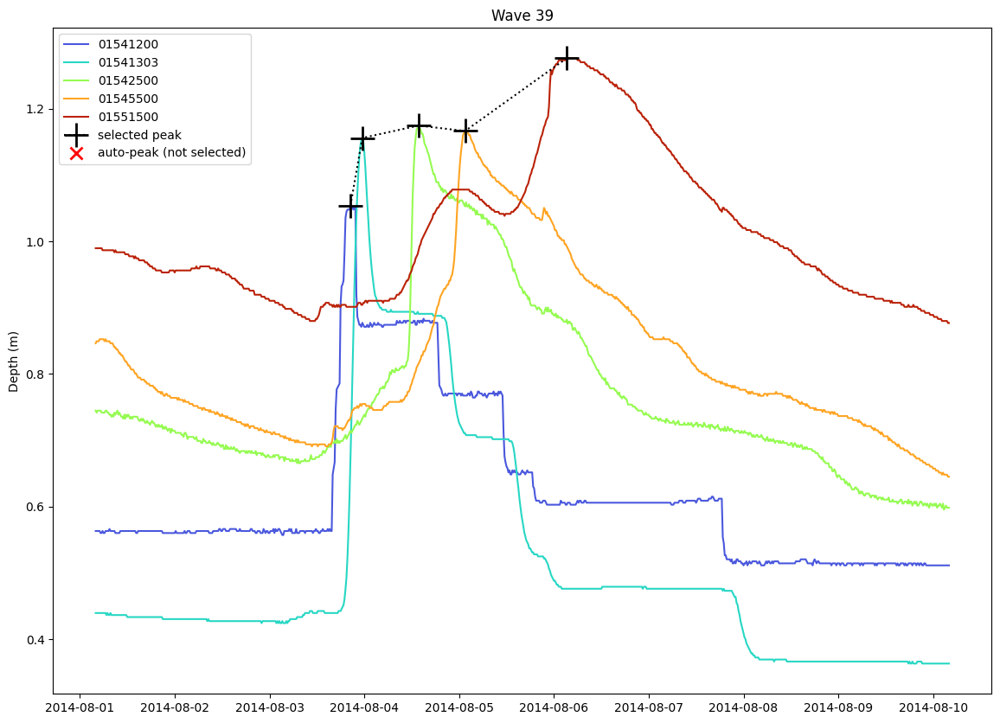

(01541200   2014-08-03 20:30:00+00:00
 01541303   2014-08-03 23:30:00+00:00
 01542500   2014-08-04 13:45:00+00:00
 01545500   2014-08-05 01:30:00+00:00
 01551500   2014-08-06 03:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.054043
 01541303    1.155940
 01542500    1.174588
 01545500    1.166414
 01551500    1.276207
 dtype: float64)

In [51]:
wave = 39
adjustment = pd.Timedelta('669 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2014-07-14 6:15:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '9 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

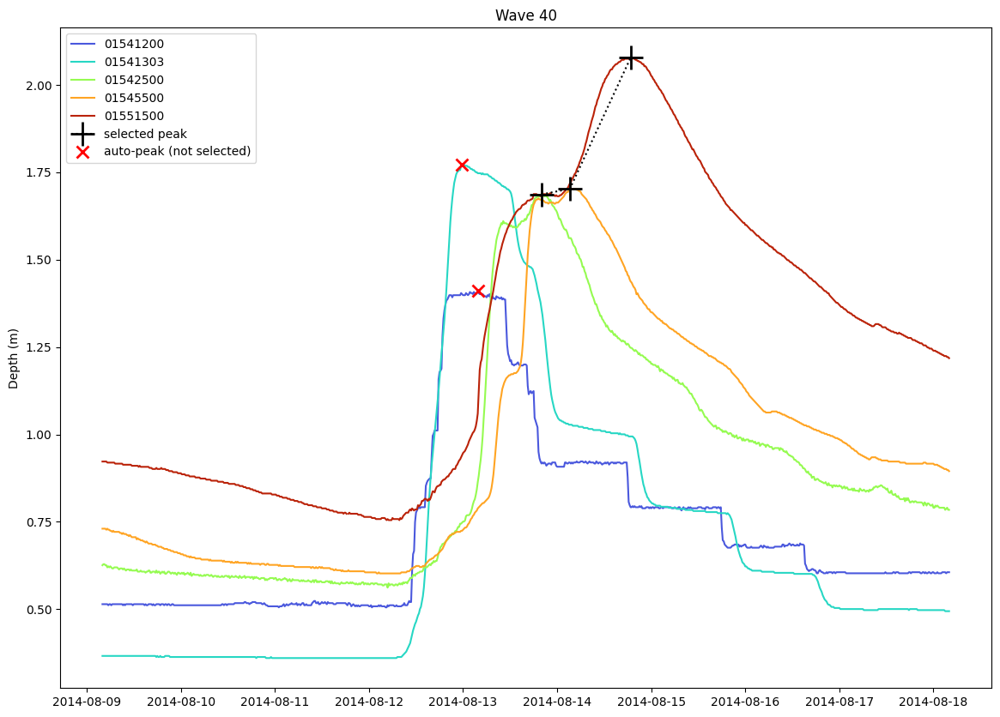

(01541200                         NaT
 01541303                         NaT
 01542500   2014-08-13 20:00:00+00:00
 01545500   2014-08-14 03:15:00+00:00
 01551500   2014-08-14 18:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.686652
 01545500    1.702862
 01551500    2.077831
 dtype: float64)

In [52]:
wave = 40
adjustment = pd.Timedelta('677 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '9 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

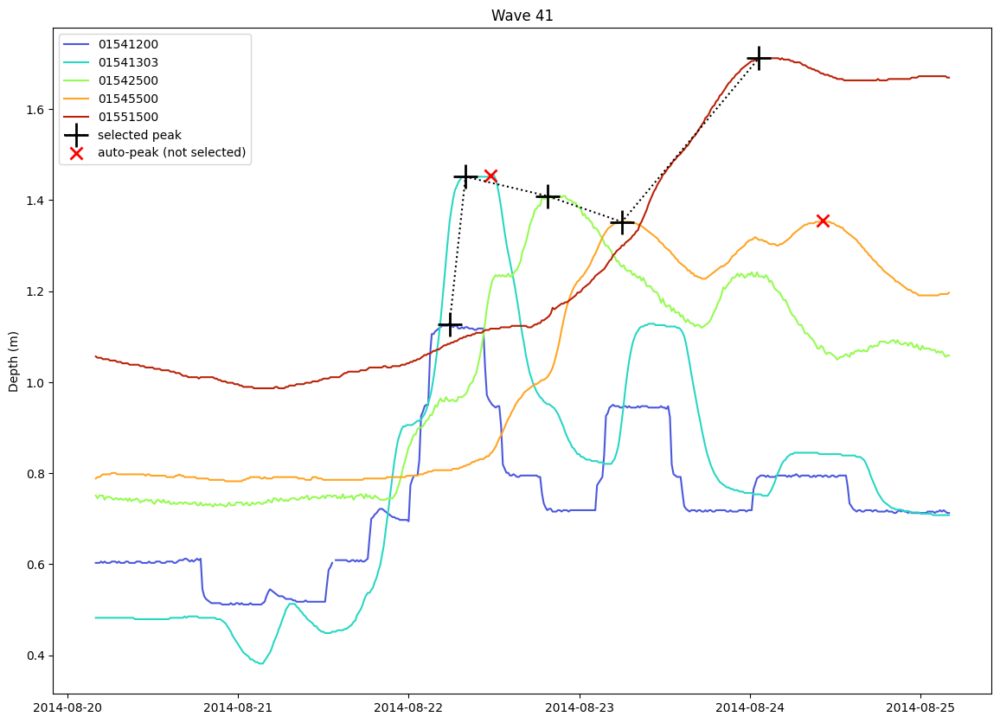

(01541200   2014-08-22 05:45:00+00:00
 01541303   2014-08-22 08:00:00+00:00
 01542500   2014-08-22 19:30:00+00:00
 01545500   2014-08-23 06:00:00+00:00
 01551500   2014-08-24 01:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.127195
 01541303    1.451596
 01542500    1.409284
 01545500    1.352342
 01551500    1.712071
 dtype: float64)

In [53]:
wave = 41
adjustment = pd.Timedelta('688 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          '01541303':'2014-08-22 08:00:00+00:00',
          #'01542500':'skip',
          '01545500': '2014-08-23 06:00:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

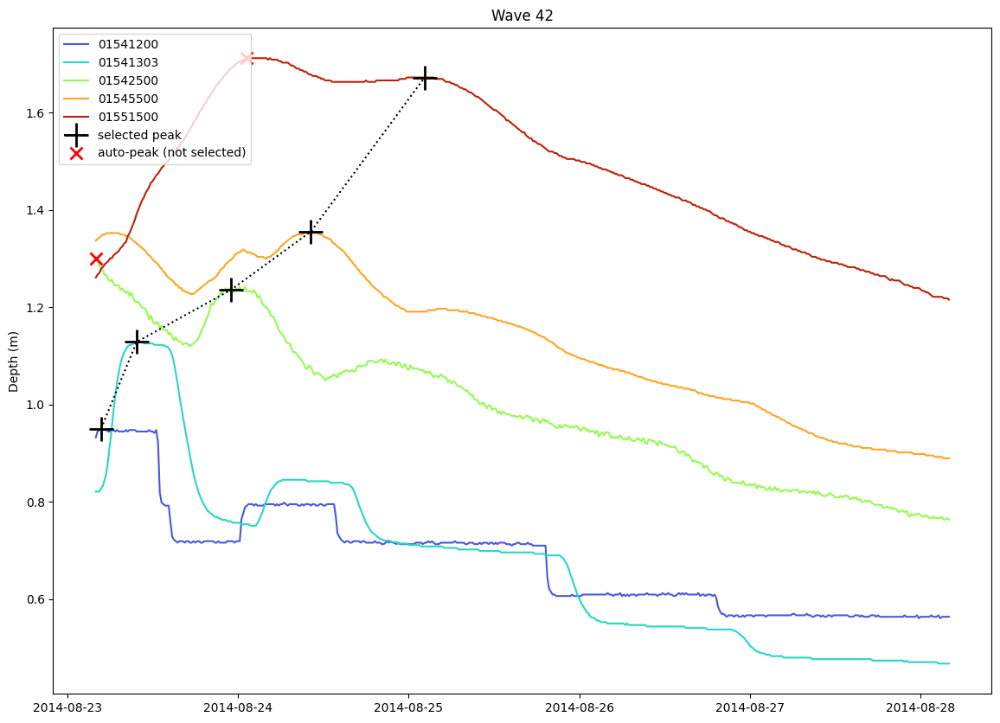

(01541200   2014-08-23 04:45:00+00:00
 01541303   2014-08-23 09:45:00+00:00
 01542500   2014-08-23 23:00:00+00:00
 01545500   2014-08-24 10:15:00+00:00
 01551500   2014-08-25 02:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.950411
 01541303    1.128508
 01542500    1.235548
 01545500    1.355390
 01551500    1.672447
 dtype: float64)

In [54]:
wave = 42
adjustment = pd.Timedelta('691 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'2014-08-22 08:00:00+00:00',
          '01542500':'2014-08-23 23:00:00+00:00',
          #'01545500': '2014-08-23 06:00:00+00:00',
          '01551500':'2014-08-25 2:15:00+00:00', 
         }

start = time0 + adjustment
period = '5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

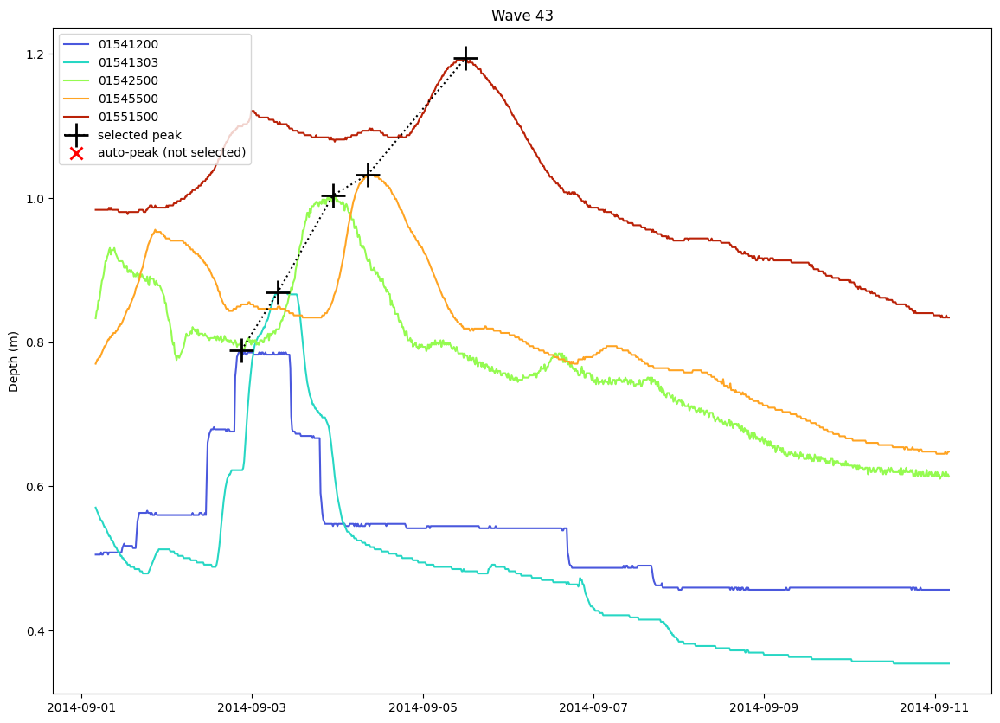

(01541200   2014-09-02 21:00:00+00:00
 01541303   2014-09-03 07:15:00+00:00
 01542500   2014-09-03 22:45:00+00:00
 01545500   2014-09-04 08:30:00+00:00
 01551500   2014-09-05 12:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.788867
 01541303    0.869428
 01542500    1.003900
 01545500    1.032302
 01551500    1.193911
 dtype: float64)

In [55]:
wave = 43
adjustment = pd.Timedelta('700 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'2014-08-22 08:00:00+00:00',
          #'01542500':'2014-08-23 23:00:00+00:00',
          #'01545500': '2014-08-23 06:00:00+00:00',
          #'01551500':'2014-08-25 2:15:00+00:00', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

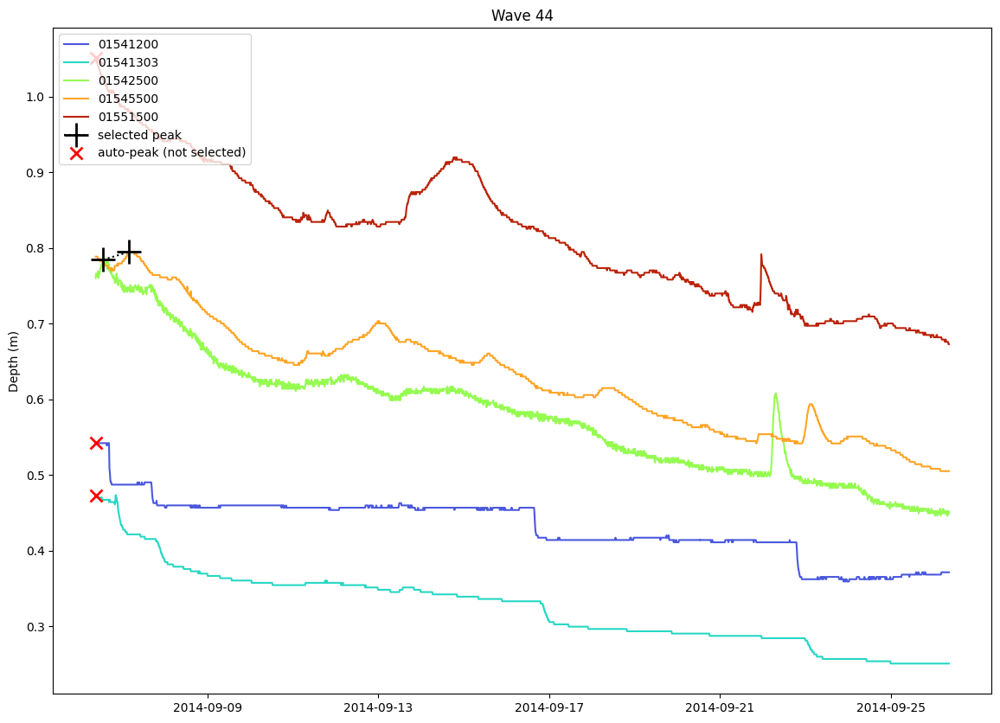

(01541200                         NaT
 01541303                         NaT
 01542500   2014-09-06 13:15:00+00:00
 01545500   2014-09-07 03:45:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.784444
 01545500    0.794558
 01551500         NaN
 dtype: float64)

In [56]:
wave = 44 
adjustment = pd.Timedelta('705.2 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'2014-08-23 23:00:00+00:00',
          #'01545500': '2014-08-23 06:00:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '20 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

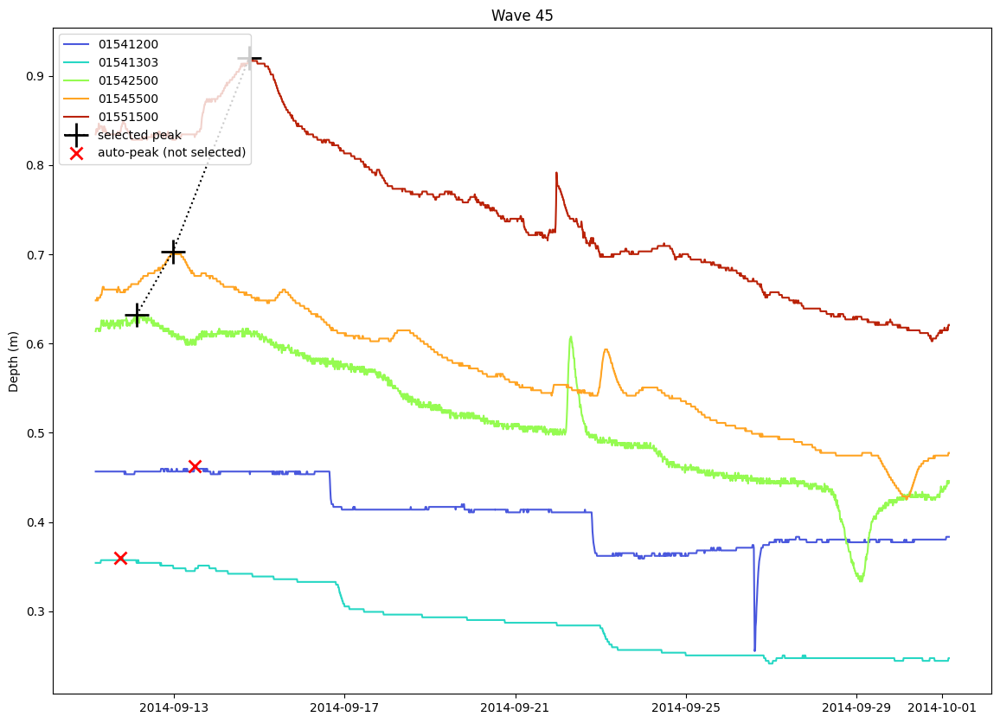

(01541200                         NaT
 01541303                         NaT
 01542500   2014-09-12 03:00:00+00:00
 01545500   2014-09-12 23:30:00+00:00
 01551500   2014-09-14 18:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.632044
 01545500    0.703118
 01551500    0.919591
 dtype: float64)

In [57]:
wave = 45  # Last wave in two-year period
adjustment = pd.Timedelta('710 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'2014-08-23 23:00:00+00:00',
          #'01545500': '2014-08-23 06:00:00+00:00',
          #'01551500':'2014-08-25 2:15:00+00:00', 
         }

start = time0 + adjustment
period = '20 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

# Data Collection for Year 3

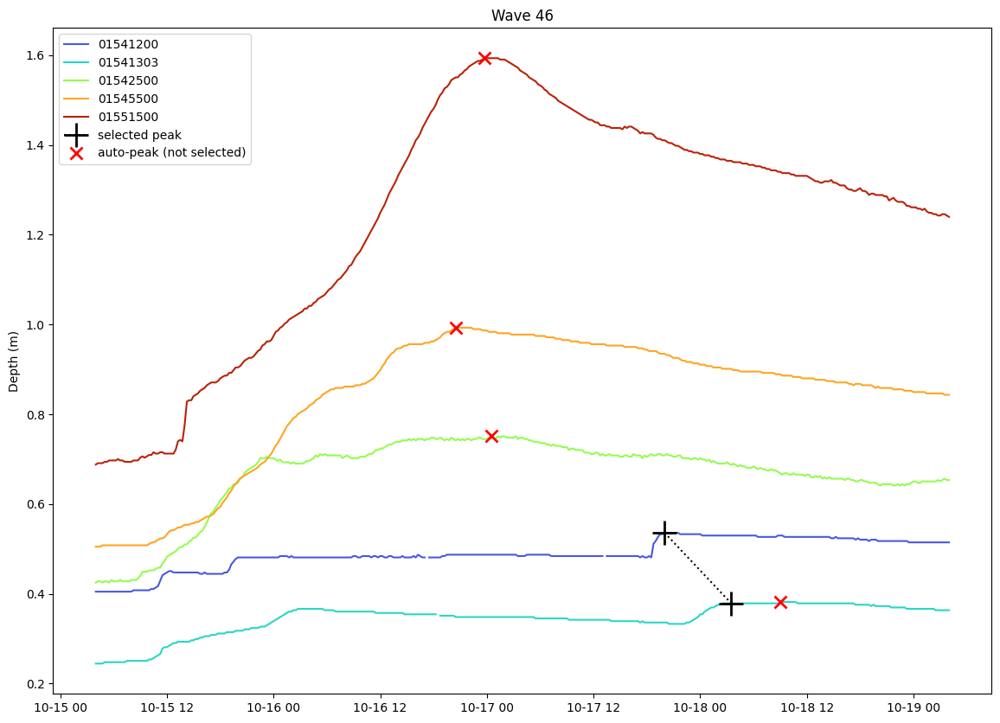

(01541200   2014-10-17 20:00:00+00:00
 01541303   2014-10-18 03:30:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.535883
 01541303    0.378700
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [58]:
wave = 46
adjustment = pd.Timedelta('744 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          '01541303':'2014-10-18 3:30:00+00:00',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

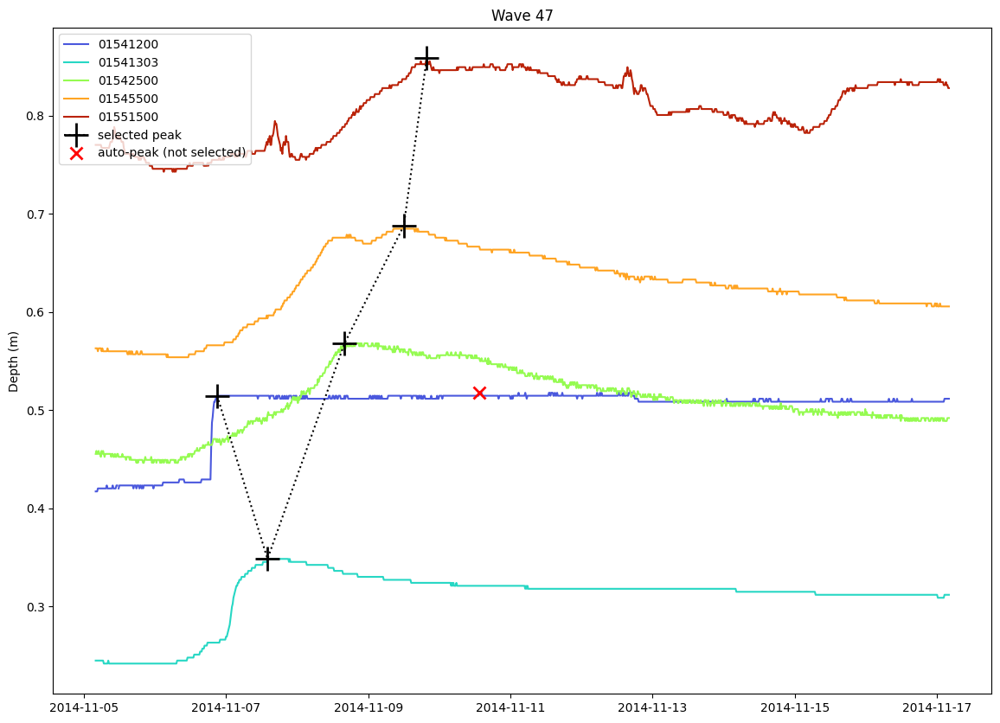

(01541200   2014-11-06 21:00:00+00:00
 01541303   2014-11-07 14:00:00+00:00
 01542500   2014-11-08 16:00:00+00:00
 01545500   2014-11-09 12:00:00+00:00
 01551500   2014-11-09 19:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.514547
 01541303    0.348220
 01542500    0.568036
 01545500    0.687878
 01551500    0.858631
 dtype: float64)

In [59]:
wave = 47
adjustment = pd.Timedelta('765 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-11-06 21:00:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500': '2014-08-23 06:00:00+00:00',
          #'01551500':'2014-08-25 2:15:00+00:00', 
         }

start = time0 + adjustment
period = '12 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

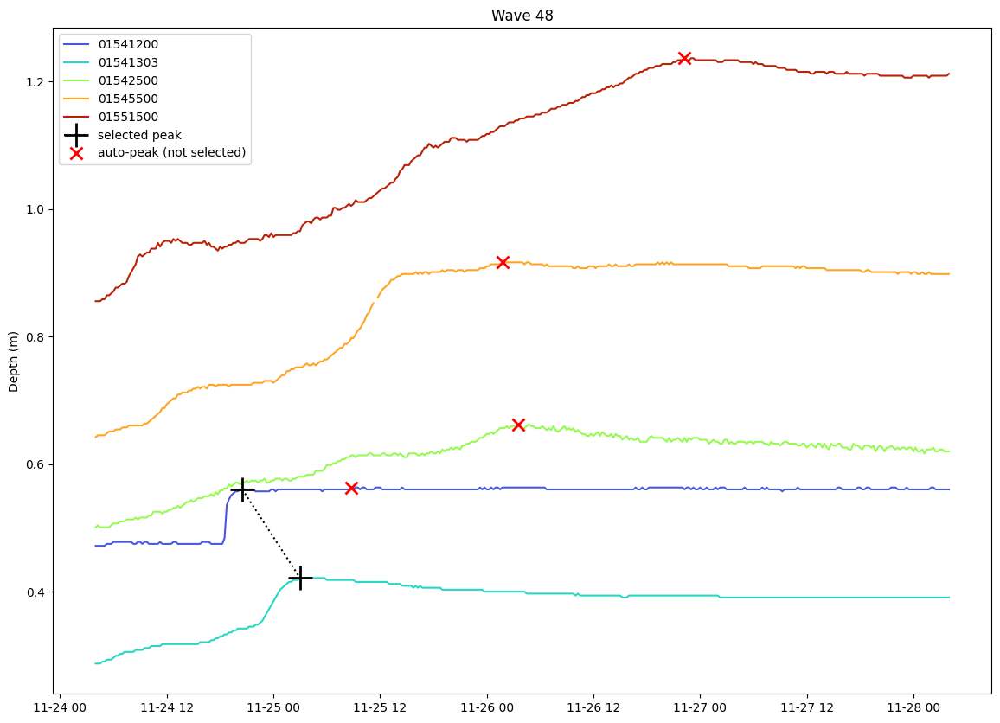

(01541200   2014-11-24 20:30:00+00:00
 01541303   2014-11-25 03:00:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.560267
 01541303    0.421372
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [60]:
wave = 48
adjustment = pd.Timedelta('784 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-11-24 20:30:00+00:00',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

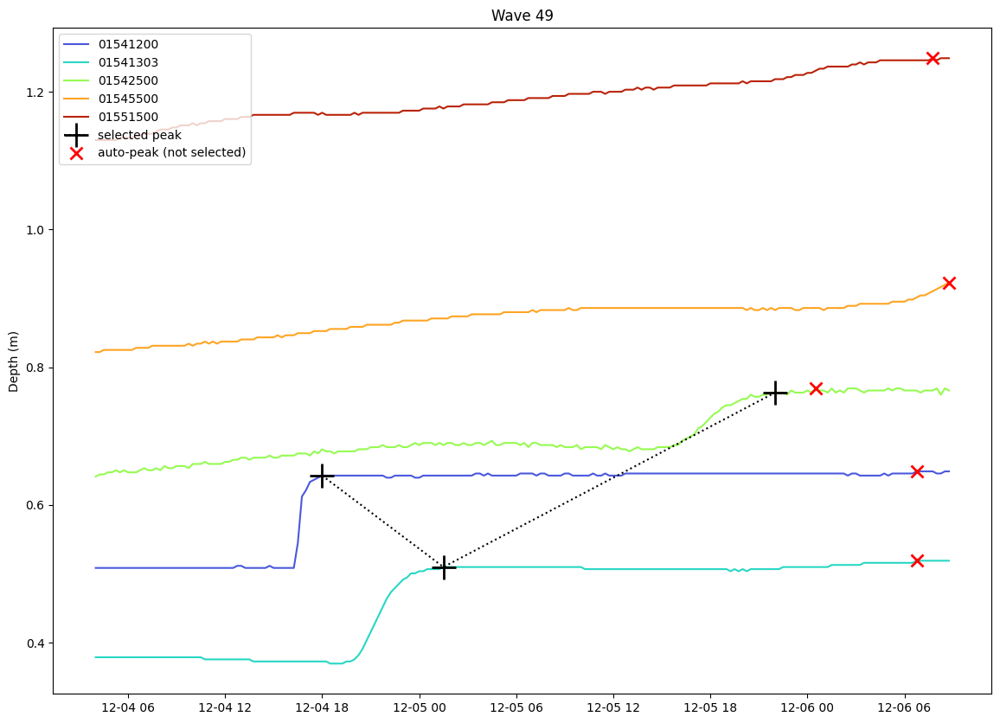

(01541200   2014-12-04 18:00:00+00:00
 01541303   2014-12-05 01:30:00+00:00
 01542500   2014-12-05 22:00:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.642563
 01541303    0.509764
 01542500    0.763108
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [61]:
wave = 49
adjustment = pd.Timedelta('794 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-12-04 18:00:00+00:00',
          '01541303':'2014-12-05 01:30:00+00:00',
          '01542500':'2014-12-05 22:00:00+00:00',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2.2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

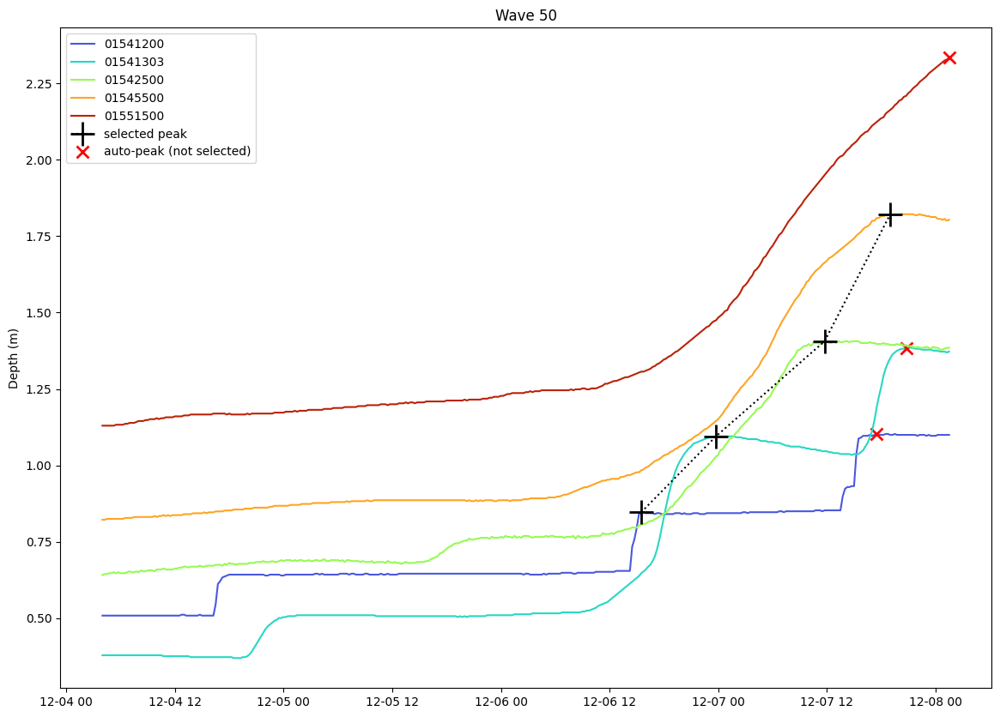

(01541200   2014-12-06 15:30:00+00:00
 01541303   2014-12-06 23:45:00+00:00
 01542500   2014-12-07 11:45:00+00:00
 01545500   2014-12-07 19:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.846779
 01541303    1.094980
 01542500    1.406236
 01545500    1.821734
 01551500         NaN
 dtype: float64)

In [62]:
wave = 50
adjustment = pd.Timedelta('794 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2014-12-06 15:30:00+00:00',
          '01541303': '2014-12-06 23:45:00+00:00',
          #'01542500':'skip',
          #'01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '3.9 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

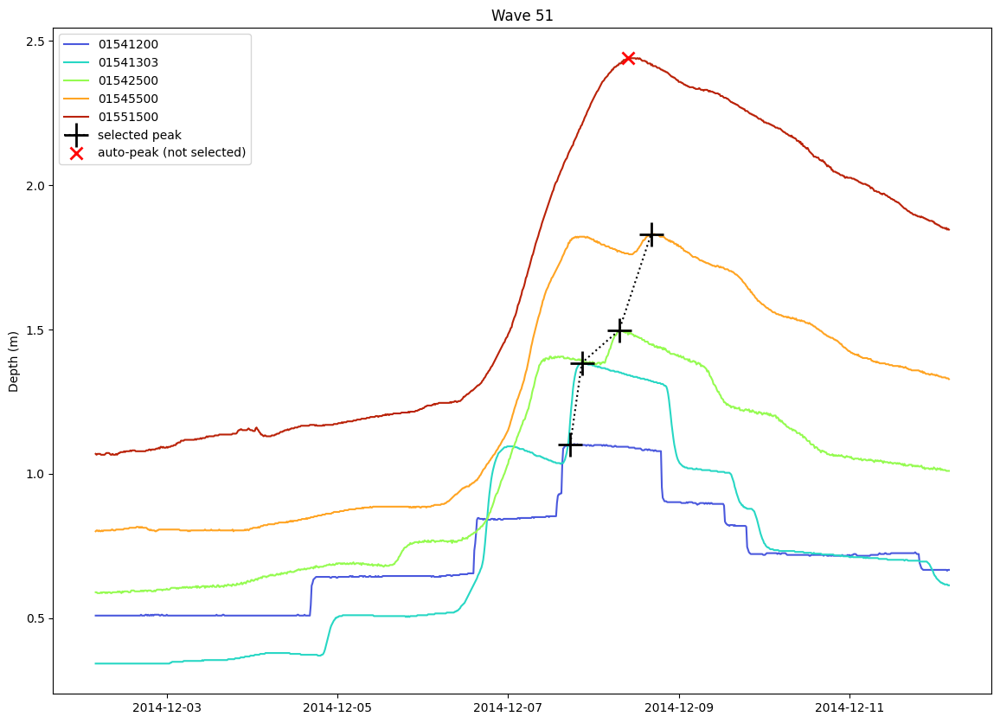

(01541200   2014-12-07 17:30:00+00:00
 01541303   2014-12-07 20:45:00+00:00
 01542500   2014-12-08 07:15:00+00:00
 01545500   2014-12-08 16:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.102811
 01541303    1.384540
 01542500    1.497676
 01545500    1.830878
 01551500         NaN
 dtype: float64)

In [63]:
wave = 51
adjustment = pd.Timedelta('792 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2014-11-24 20:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

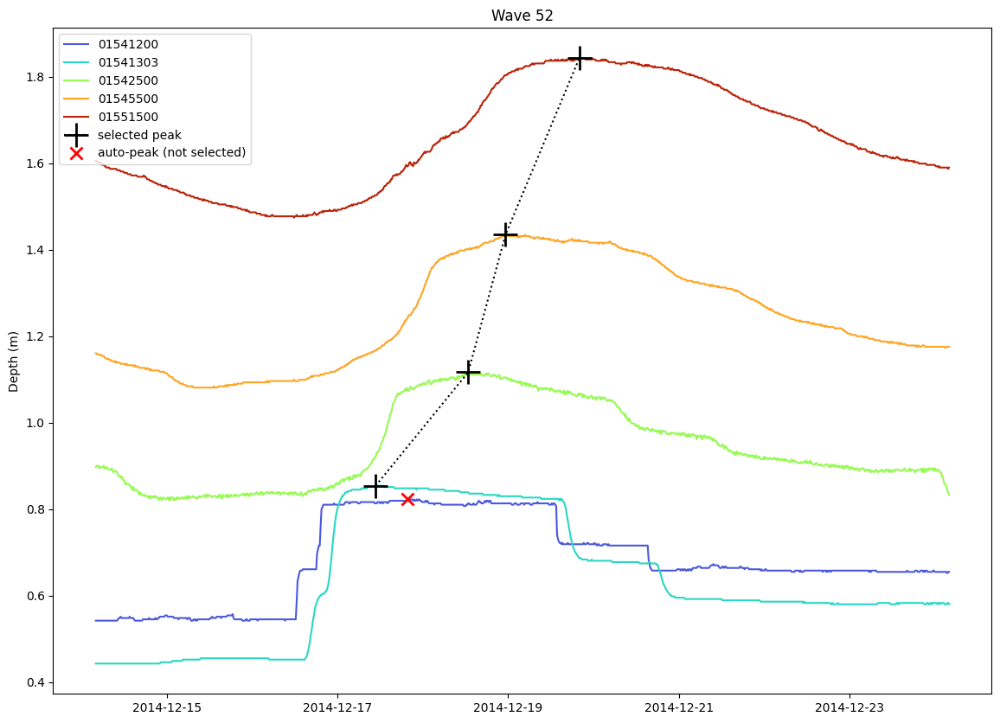

(01541200                         NaT
 01541303   2014-12-17 10:45:00+00:00
 01542500   2014-12-18 12:45:00+00:00
 01545500   2014-12-18 23:15:00+00:00
 01551500   2014-12-19 20:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303    0.854188
 01542500    1.116676
 01545500    1.434638
 01551500    1.843135
 dtype: float64)

In [64]:
wave = 52
adjustment = pd.Timedelta('804 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          #'01541303': '2014-12-06 23:45:00+00:00',
          #'01542500':'skip',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

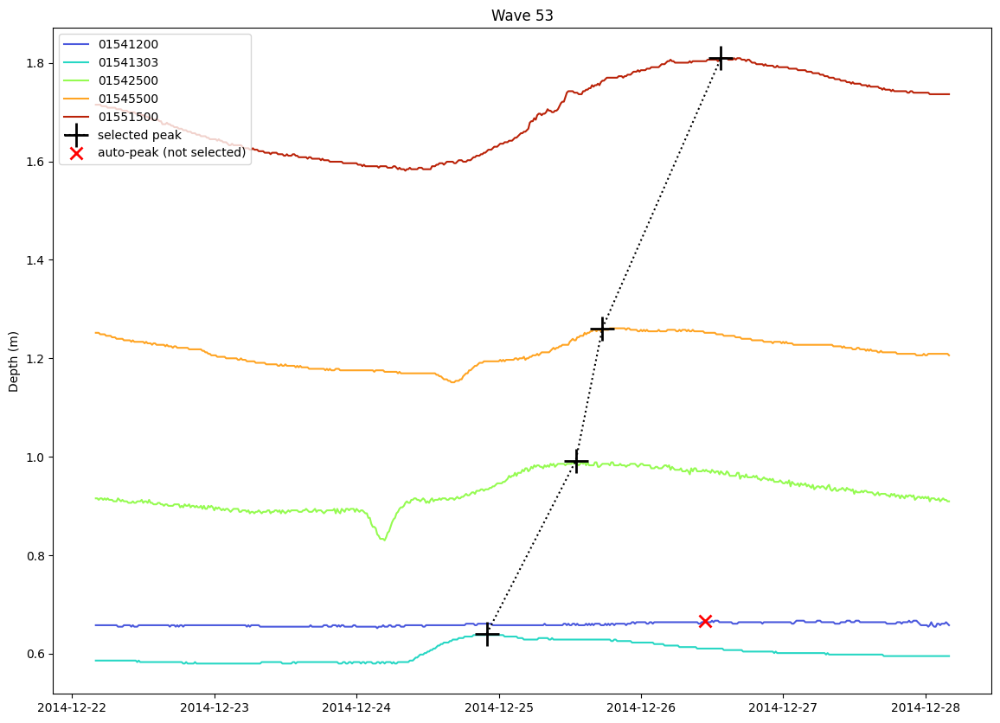

(01541200                         NaT
 01541303   2014-12-24 22:00:00+00:00
 01542500   2014-12-25 13:00:00+00:00
 01545500   2014-12-25 17:30:00+00:00
 01551500   2014-12-26 13:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303    0.640828
 01542500    0.991708
 01545500    1.260902
 01551500    1.809607
 dtype: float64)

In [65]:
wave = 53
adjustment = pd.Timedelta('812 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          #'01541303': '2014-12-06 23:45:00+00:00',
          #'01542500':'skip',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

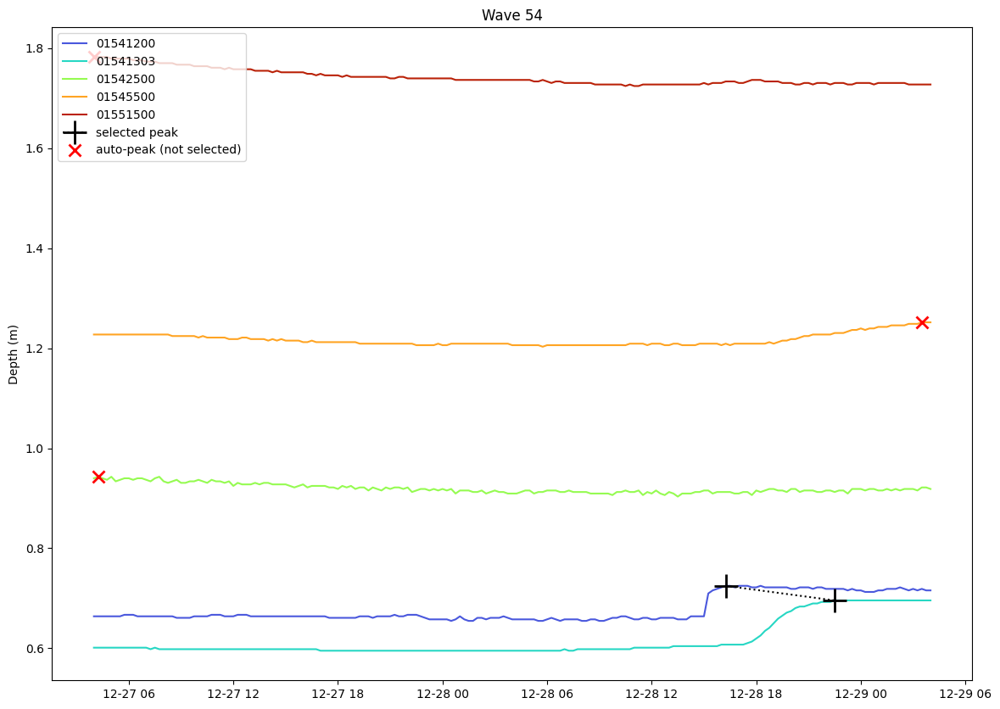

(01541200   2014-12-28 16:15:00+00:00
 01541303   2014-12-28 22:30:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.724859
 01541303    0.695692
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [66]:
wave = 54
adjustment = pd.Timedelta('817 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303': '2014-12-06 23:45:00+00:00',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

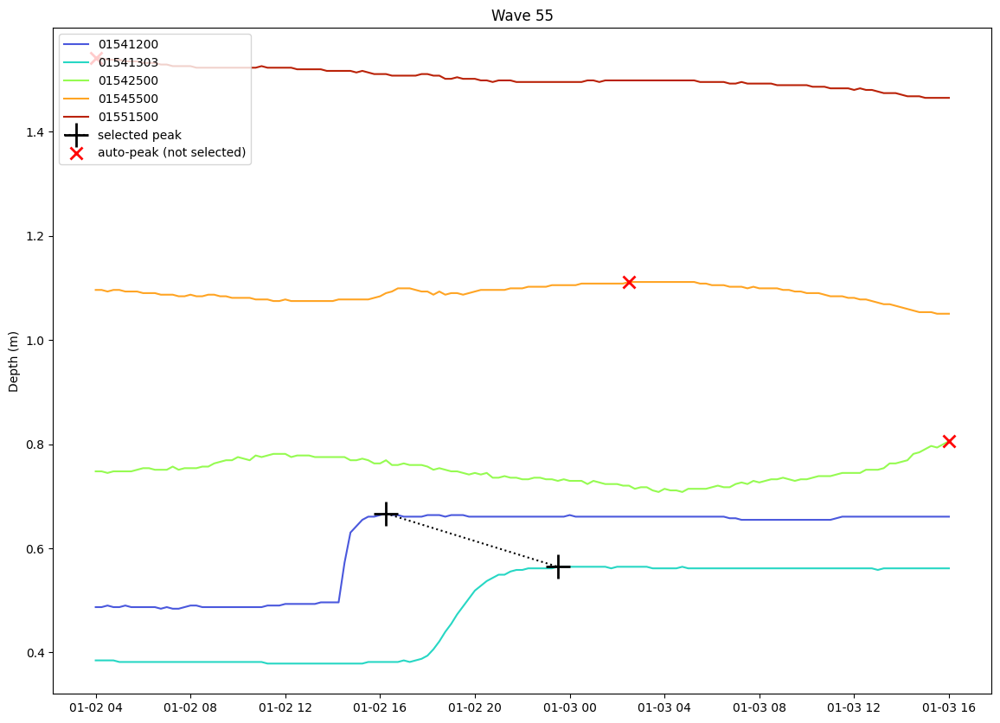

(01541200   2015-01-02 16:15:00+00:00
 01541303   2015-01-02 23:30:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.666947
 01541303    0.564628
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [67]:
wave = 55
adjustment = pd.Timedelta('823 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303': '2014-12-06 23:45:00+00:00',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '1.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

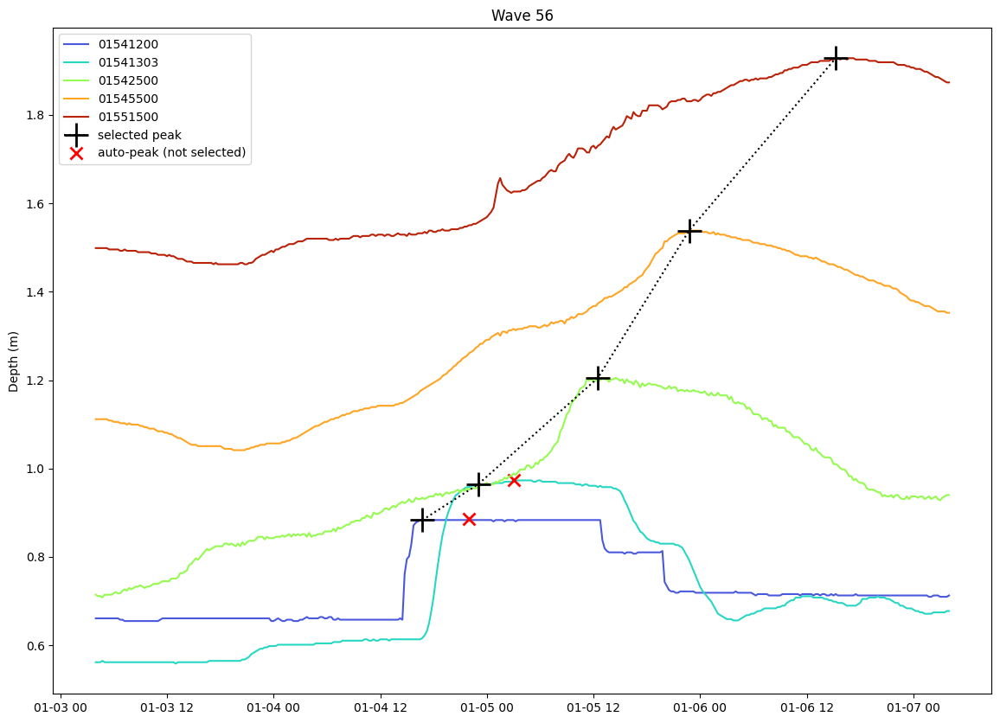

(01541200   2015-01-04 16:45:00+00:00
 01541303   2015-01-04 23:00:00+00:00
 01542500   2015-01-05 12:30:00+00:00
 01545500   2015-01-05 22:45:00+00:00
 01551500   2015-01-06 15:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.883355
 01541303    0.963916
 01542500    1.205068
 01545500    1.538270
 01551500    1.928479
 dtype: float64)

In [68]:
wave = 56
adjustment = pd.Timedelta('824 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-01-04 16:45:00+00:00',
          '01541303': '2015-01-04 23:00:00+00:00',
          #'01542500':'skip',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

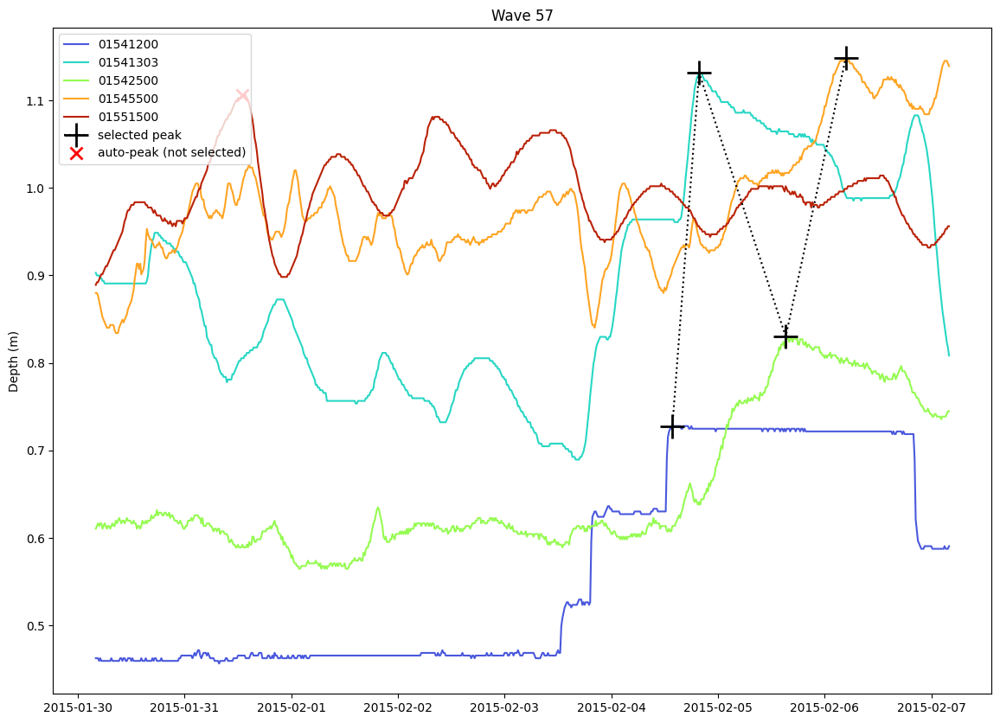

(01541200   2015-02-04 13:45:00+00:00
 01541303   2015-02-04 19:45:00+00:00
 01542500   2015-02-05 15:15:00+00:00
 01545500   2015-02-06 04:45:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.727907
 01541303    1.131556
 01542500    0.830164
 01545500    1.148126
 01551500         NaN
 dtype: float64)

In [69]:
wave = 57
adjustment = pd.Timedelta('851 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-01-04 16:45:00+00:00',
          #'01541303': '2015-01-04 23:00:00+00:00',
          #'01542500':'skip',
          #'01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

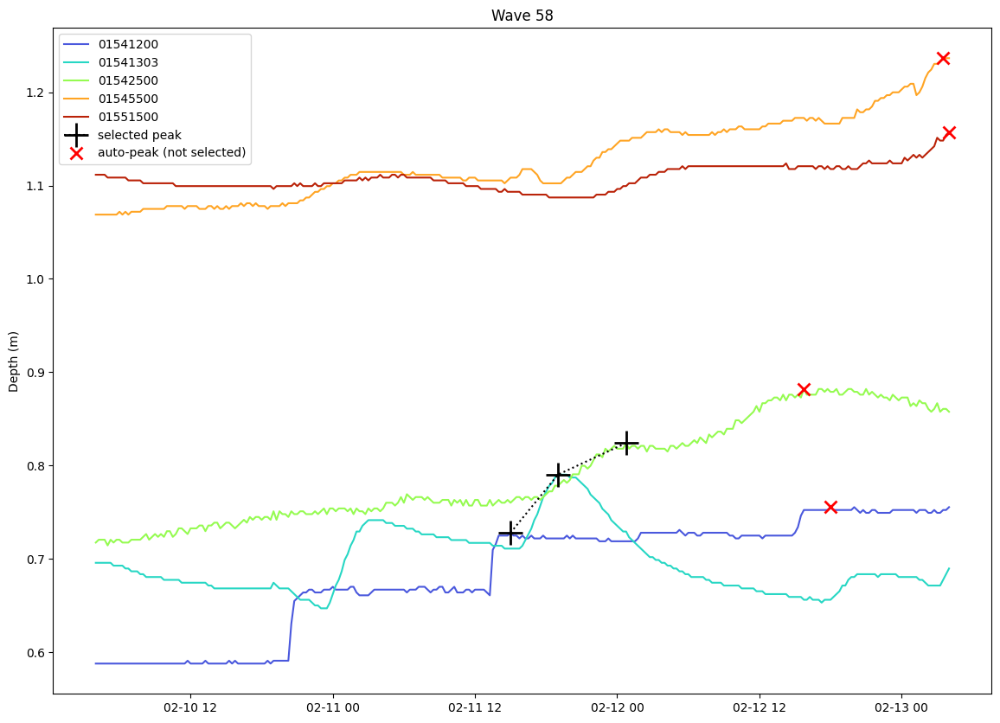

(01541200   2015-02-11 15:00:00+00:00
 01541303   2015-02-11 19:00:00+00:00
 01542500   2015-02-12 00:45:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.727907
 01541303    0.790180
 01542500    0.824068
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [70]:
wave = 58
adjustment = pd.Timedelta('862 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-02-11 15:00:00+00:00',
          #'01541303': '2015-01-04 23:00:00+00:00',
          '01542500':'2015-02-12 00:45:00+00:00',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

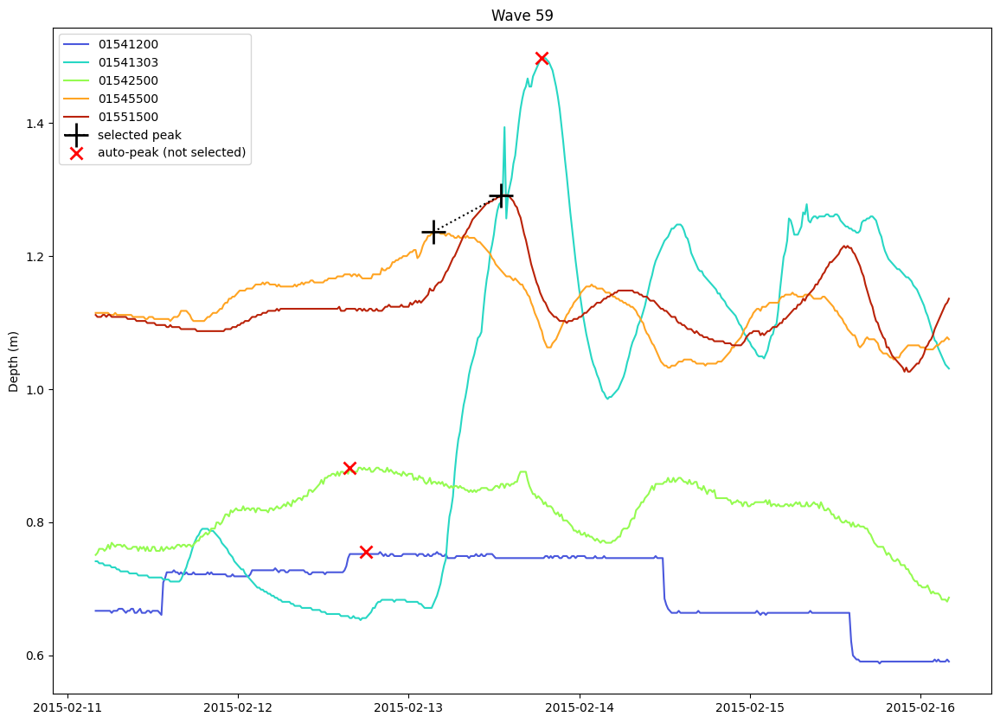

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2015-02-13 03:30:00+00:00
 01551500   2015-02-13 13:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.236518
 01551500    1.291447
 dtype: float64)

In [71]:
wave = 59
adjustment = pd.Timedelta('863 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303': 'skip',
          '01542500':'skip',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

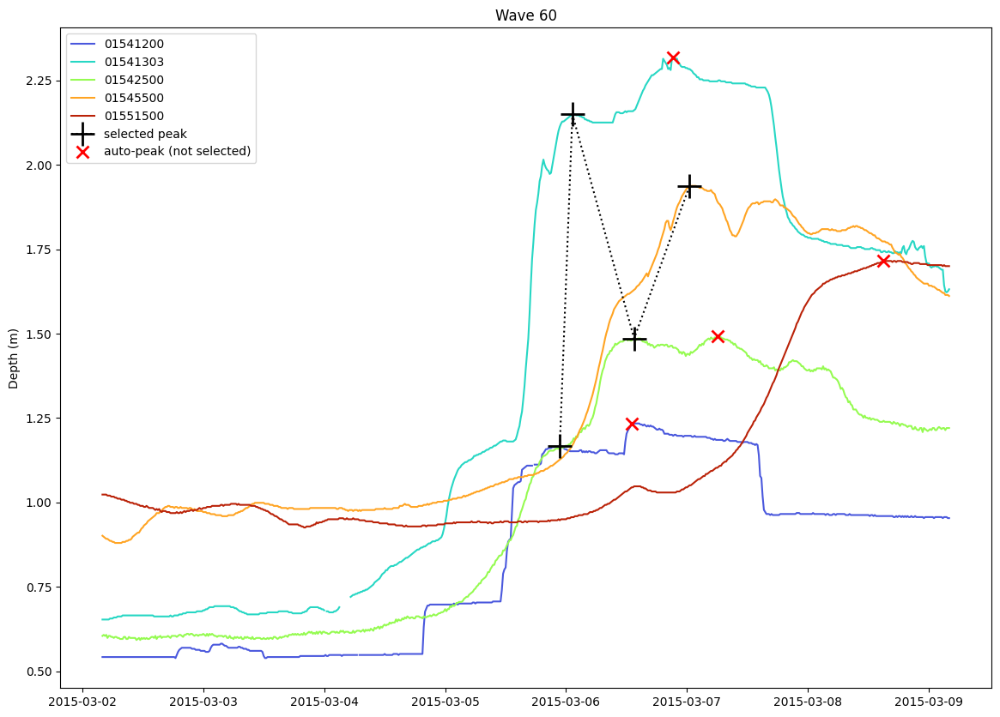

(01541200   2015-03-05 22:45:00+00:00
 01541303   2015-03-06 01:15:00+00:00
 01542500   2015-03-06 13:30:00+00:00
 01545500   2015-03-07 00:30:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.166819
 01541303    2.149588
 01542500    1.485484
 01545500    1.937558
 01551500         NaN
 dtype: float64)

In [72]:
wave = 60
adjustment = pd.Timedelta('882 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-03-05 22:45:00+00:00',
          '01541303': '2015-03-06 01:15:00+00:00',
          '01542500':'2015-03-06 13:30:00+00:00',
          #'01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

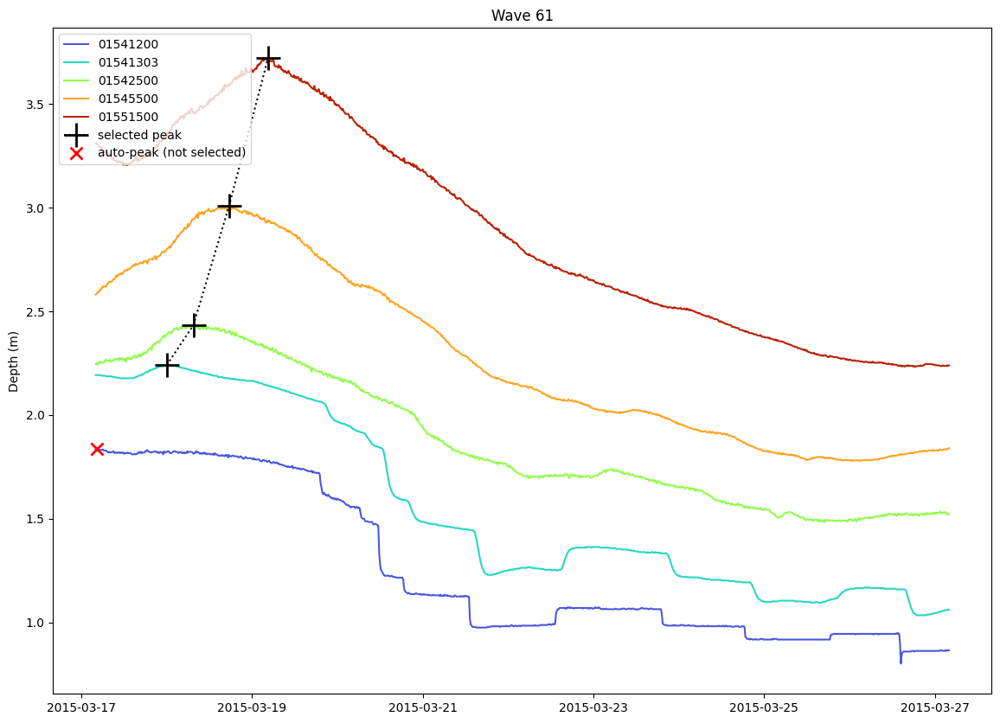

(01541200                         NaT
 01541303   2015-03-18 00:00:00+00:00
 01542500   2015-03-18 07:30:00+00:00
 01545500   2015-03-18 17:30:00+00:00
 01551500   2015-03-19 04:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303    2.241028
 01542500    2.433412
 01545500    3.007406
 01551500    3.720703
 dtype: float64)

In [73]:
wave = 61
adjustment = pd.Timedelta('897 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          #'01541303': '2015-03-06 01:15:00+00:00',
          #'01542500':'2015-03-06 13:30:00+00:00',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

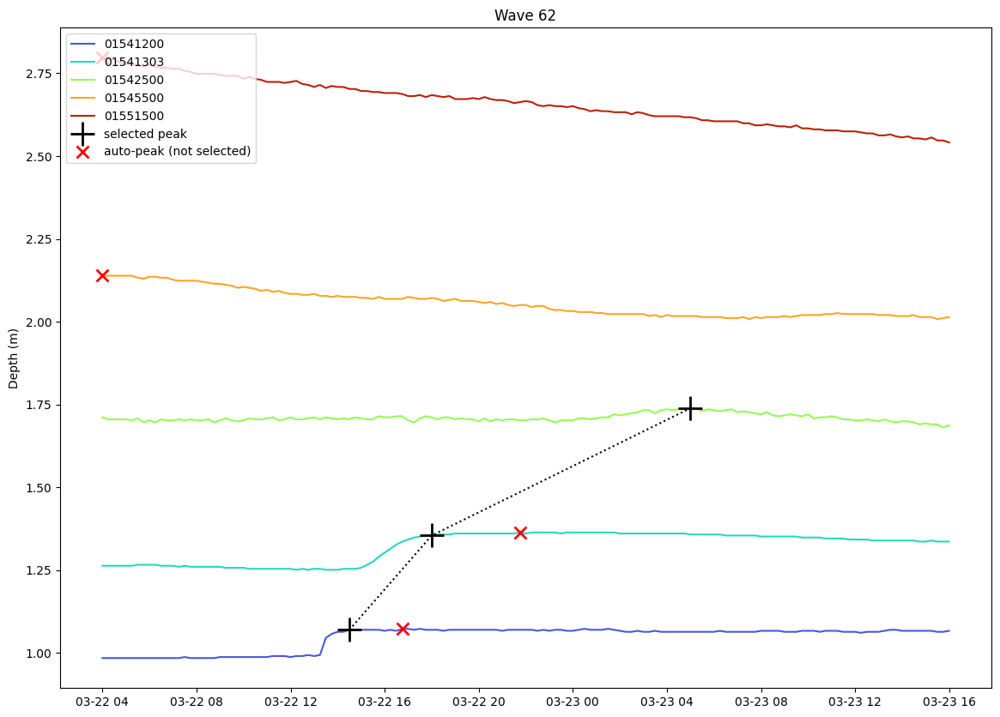

(01541200   2015-03-22 14:30:00+00:00
 01541303   2015-03-22 18:00:00+00:00
 01542500   2015-03-23 05:00:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.069283
 01541303    1.354060
 01542500    1.738468
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [74]:
wave = 62
adjustment = pd.Timedelta('902 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-03-22 14:30:00+00:00',
          '01541303':'2015-03-22 18:00:00+00:00',
          #'01542500':'2015-03-06 13:30:00+00:00',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '1.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

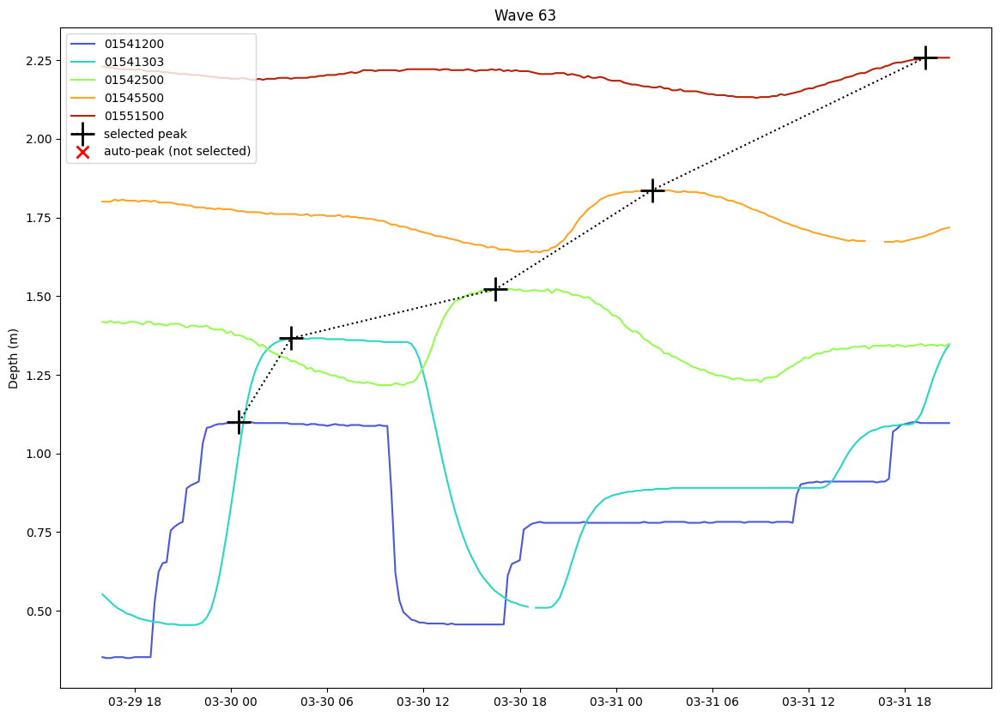

(01541200   2015-03-30 00:30:00+00:00
 01541303   2015-03-30 03:45:00+00:00
 01542500   2015-03-30 16:30:00+00:00
 01545500   2015-03-31 02:15:00+00:00
 01551500   2015-03-31 19:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.099763
 01541303    1.366252
 01542500    1.522060
 01545500    1.836974
 01551500    2.257663
 dtype: float64)

In [75]:
wave = 63
adjustment = pd.Timedelta('909.5 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-03-22 14:30:00+00:00',
          #'01541303':'2015-03-22 18:00:00+00:00',
          #'01542500':'2015-03-06 13:30:00+00:00',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '2.2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

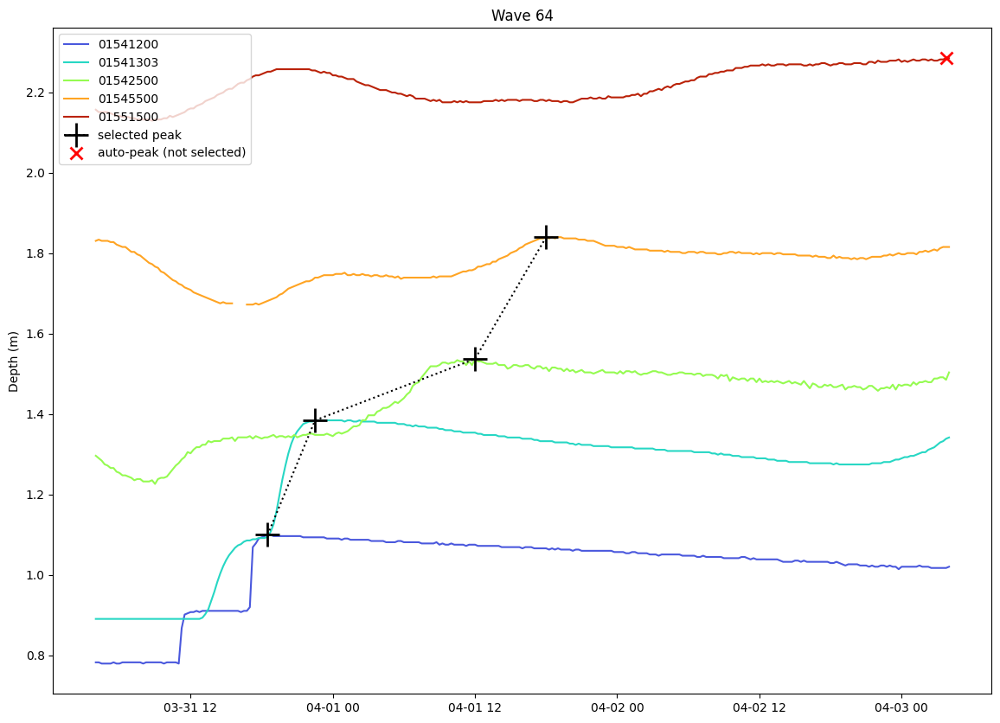

(01541200   2015-03-31 18:30:00+00:00
 01541303   2015-03-31 22:30:00+00:00
 01542500   2015-04-01 12:00:00+00:00
 01545500   2015-04-01 18:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.099763
 01541303    1.384540
 01542500    1.537300
 01545500    1.840022
 01551500         NaN
 dtype: float64)

In [76]:
wave = 64
adjustment = pd.Timedelta('911 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-03-22 14:30:00+00:00',
          #'01541303':'2015-03-22 18:00:00+00:00',
          #'01542500':'2015-03-06 13:30:00+00:00',
          #'01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

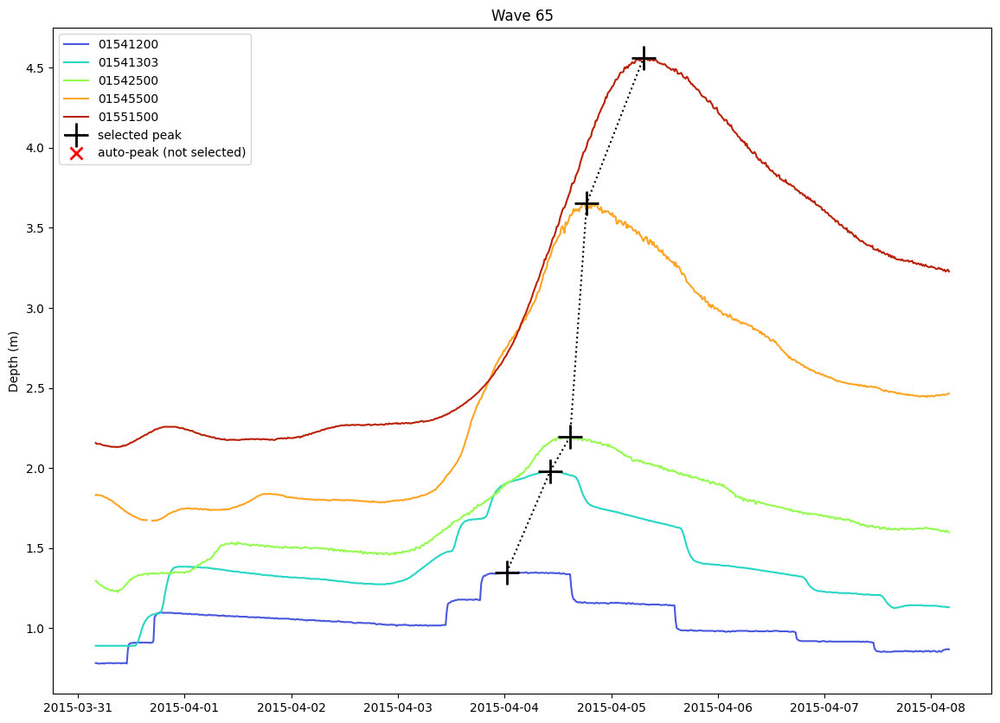

(01541200   2015-04-04 00:30:00+00:00
 01541303   2015-04-04 10:15:00+00:00
 01542500   2015-04-04 14:45:00+00:00
 01545500   2015-04-04 18:30:00+00:00
 01551500   2015-04-05 07:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.349699
 01541303    1.978900
 01542500    2.195668
 01545500    3.653582
 01551500    4.558903
 dtype: float64)

In [77]:
wave = 65
adjustment = pd.Timedelta('911 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-03-22 14:30:00+00:00',
          #'01541303':'2015-03-22 18:00:00+00:00',
          #'01542500':'2015-03-06 13:30:00+00:00',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

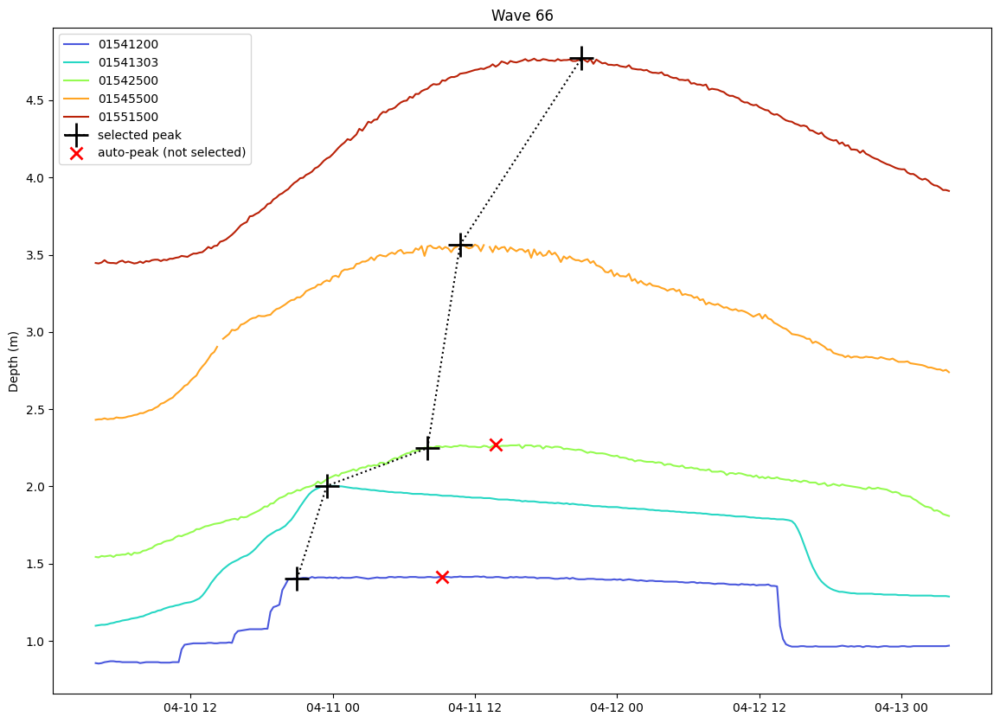

(01541200   2015-04-10 21:00:00+00:00
 01541303   2015-04-10 23:30:00+00:00
 01542500   2015-04-11 08:00:00+00:00
 01545500   2015-04-11 10:45:00+00:00
 01551500   2015-04-11 21:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.401515
 01541303    2.003284
 01542500    2.247484
 01545500    3.565190
 01551500    4.772263
 dtype: float64)

In [78]:
wave = 66
adjustment = pd.Timedelta('921 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-04-10 21:00:00+00:00',
          #'01541303':'2015-03-22 18:00:00+00:00',
          '01542500':'2015-04-11 8:00:00+00:00',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

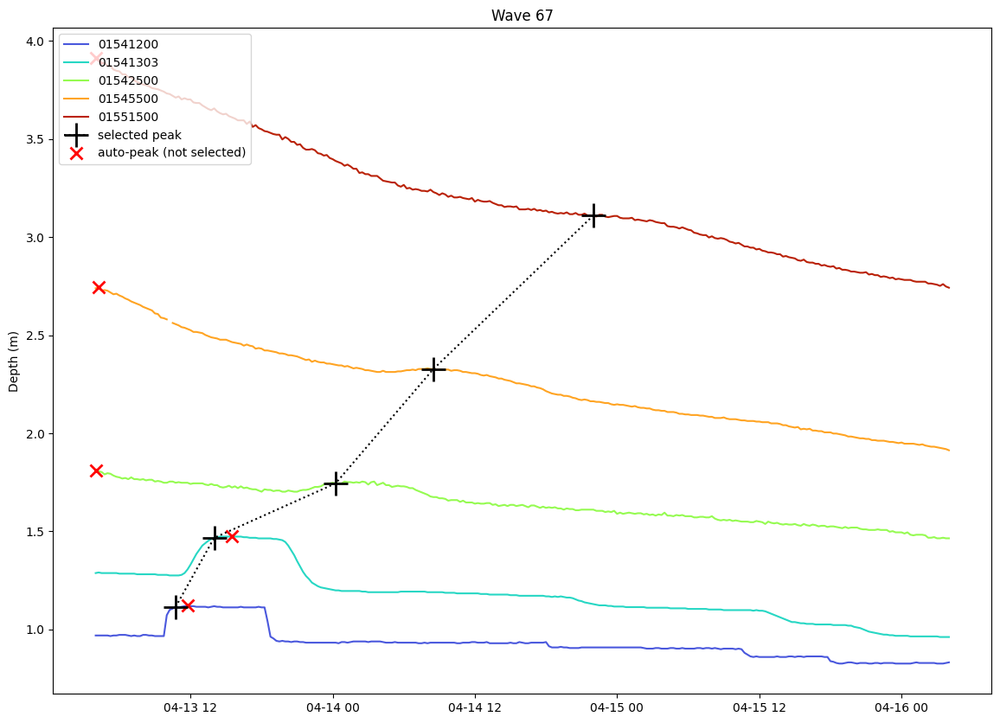

(01541200   2015-04-13 10:45:00+00:00
 01541303   2015-04-13 14:00:00+00:00
 01542500   2015-04-14 00:15:00+00:00
 01545500   2015-04-14 08:30:00+00:00
 01551500   2015-04-14 22:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.115003
 01541303    1.466836
 01542500    1.744564
 01545500    2.327702
 01551500    3.111103
 dtype: float64)

In [79]:
wave = 67
adjustment = pd.Timedelta('924 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-04-13 10:45:00+00:00',
          '01541303':'2015-04-13 14:00:00+00:00',
          '01542500':'2015-04-14 0:15:00+00:00',
          '01545500': '2015-04-14 8:30:00+00:00',
          '01551500':'2015-04-14 22:00:00+00:00', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

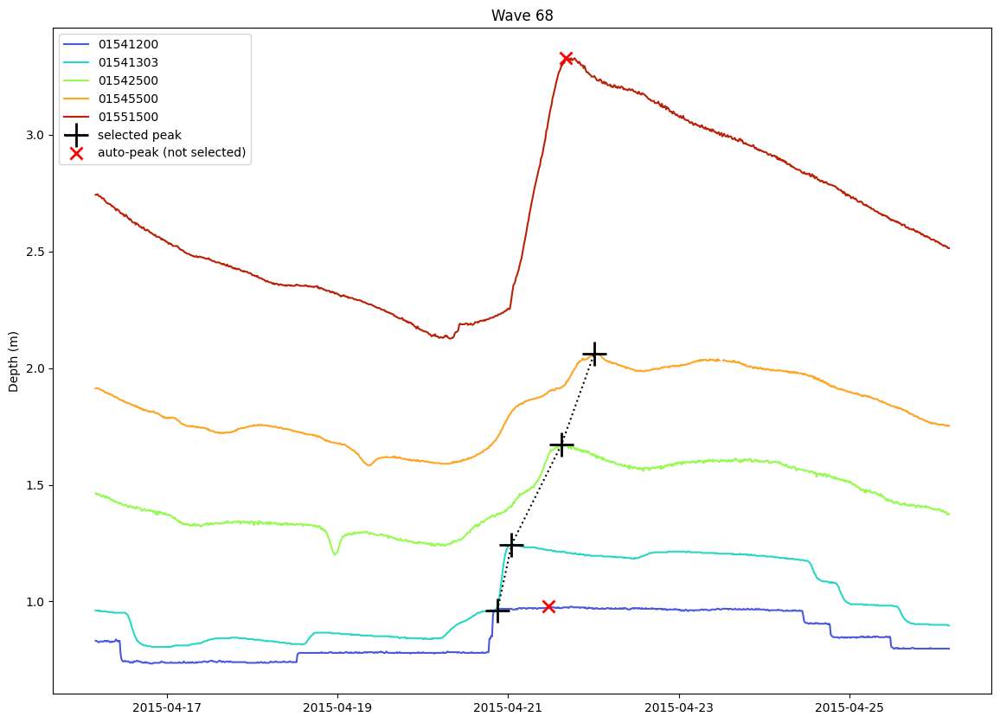

(01541200   2015-04-20 21:00:00+00:00
 01541303   2015-04-21 01:00:00+00:00
 01542500   2015-04-21 15:00:00+00:00
 01545500   2015-04-22 00:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.962603
 01541303    1.244332
 01542500    1.671412
 01545500    2.062526
 01551500         NaN
 dtype: float64)

In [80]:
wave = 68
adjustment = pd.Timedelta('927 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-04-20 21:00:00+00:00',
          #'01541303':'2015-04-13 14:00:00+00:00',
          #'01542500':'2015-04-14 0:15:00+00:00',
          #'01545500': '2015-04-14 8:30:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

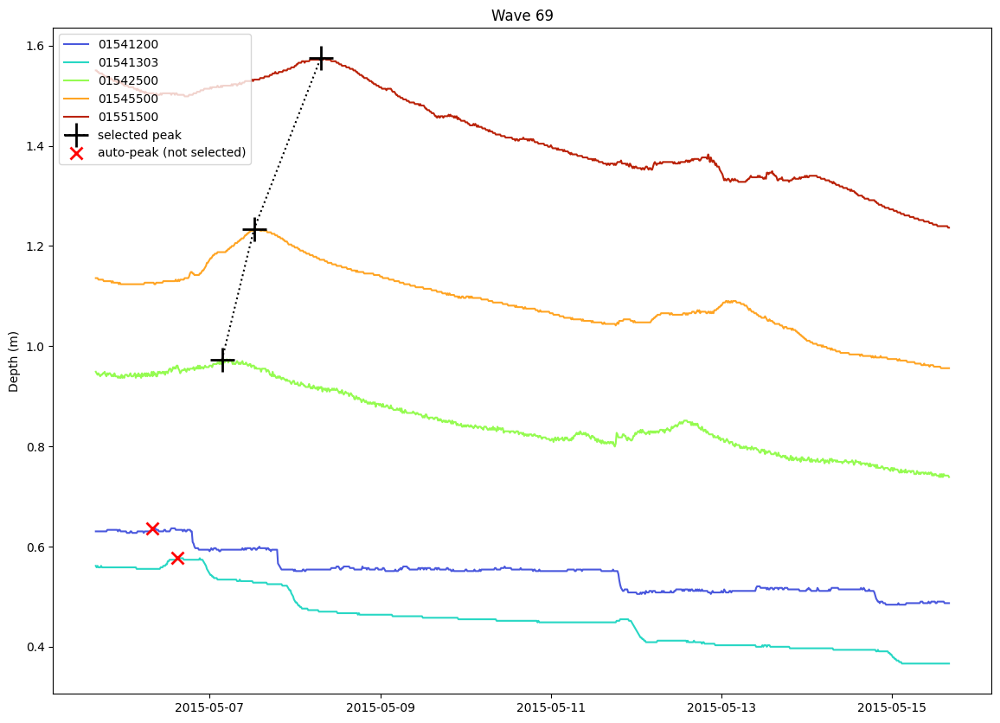

(01541200                         NaT
 01541303                         NaT
 01542500   2015-05-07 03:30:00+00:00
 01545500   2015-05-07 12:30:00+00:00
 01551500   2015-05-08 07:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.973420
 01545500    1.233470
 01551500    1.574911
 dtype: float64)

In [81]:
wave = 69
adjustment = pd.Timedelta('946.5 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'2015-04-14 0:15:00+00:00',
          #'01545500': '2015-04-14 8:30:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

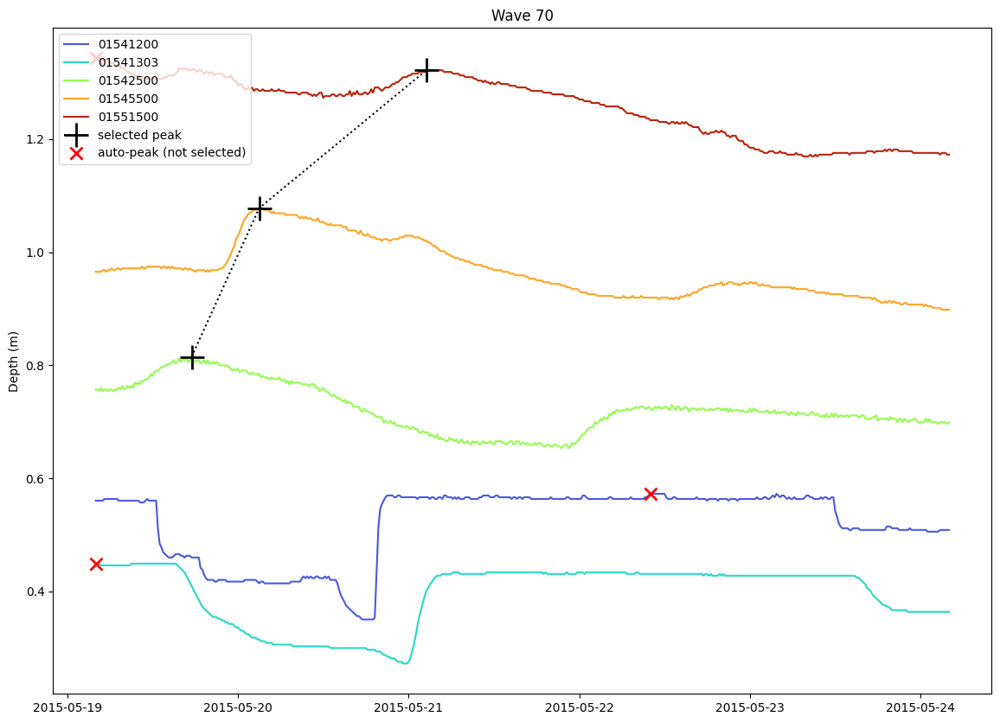

(01541200                         NaT
 01541303                         NaT
 01542500   2015-05-19 17:30:00+00:00
 01545500   2015-05-20 03:00:00+00:00
 01551500   2015-05-21 02:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.814924
 01545500    1.078022
 01551500    1.321927
 dtype: float64)

In [82]:
wave = 70
adjustment = pd.Timedelta('960 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'2015-04-14 0:15:00+00:00',
          #'01545500': '2015-04-14 8:30:00+00:00',
          '01551500':'2015-05-21 02:30:00+00:00', 
         }

start = time0 + adjustment
period = '5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

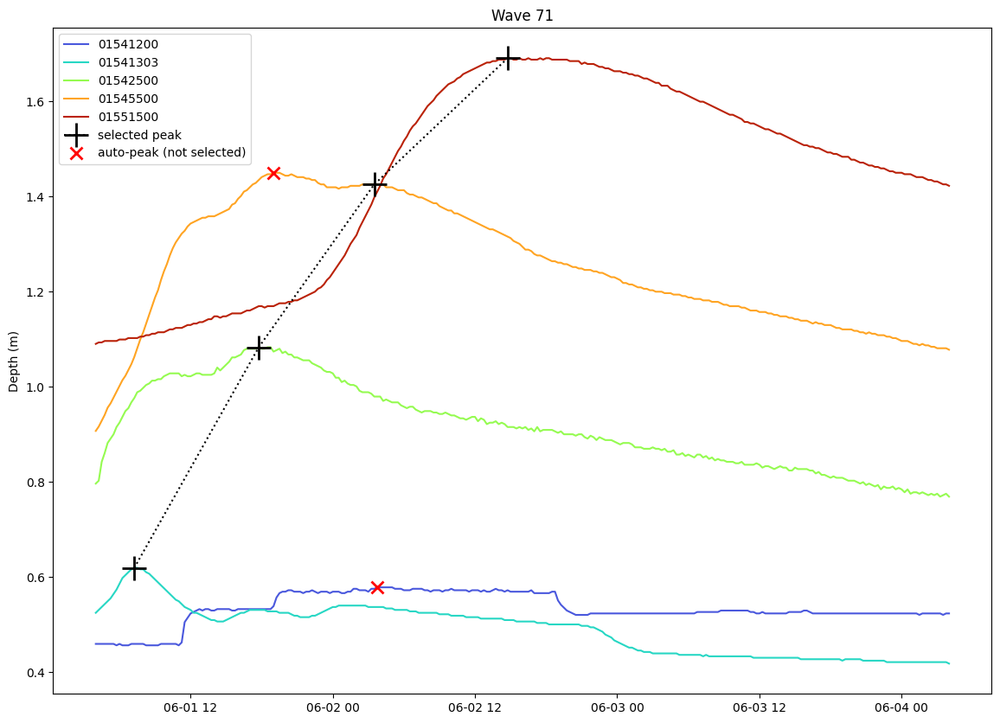

(01541200                         NaT
 01541303   2015-06-01 07:15:00+00:00
 01542500   2015-06-01 17:45:00+00:00
 01545500   2015-06-02 03:30:00+00:00
 01551500   2015-06-02 14:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303    0.619492
 01542500    1.083148
 01545500    1.425494
 01551500    1.690735
 dtype: float64)

In [83]:
wave = 71
adjustment = pd.Timedelta('973 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          #'01541303':'2015-06-01 07:15:00+00:00',
          #'01542500':'2015-06-01 17:45:00+00:00',
          '01545500': '2015-06-02 03:30:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

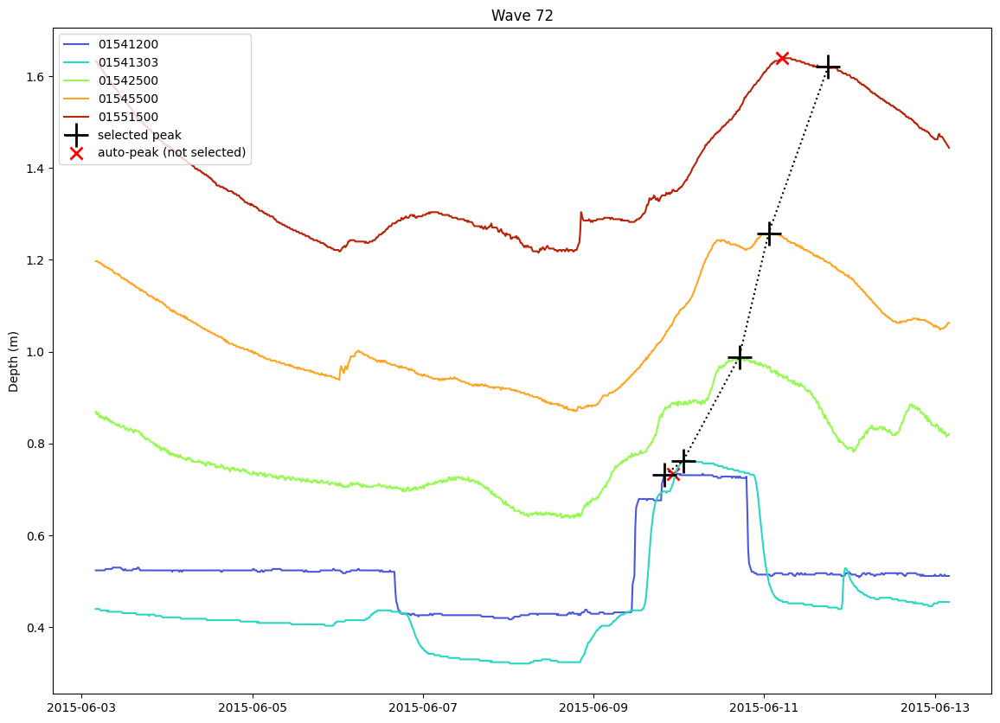

(01541200   2015-06-09 20:00:00+00:00
 01541303   2015-06-10 01:15:00+00:00
 01542500   2015-06-10 17:00:00+00:00
 01545500   2015-06-11 01:15:00+00:00
 01551500   2015-06-11 18:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.730955
 01541303    0.762748
 01542500    0.988660
 01545500    1.257854
 01551500    1.620631
 dtype: float64)

In [84]:
wave = 72
adjustment = pd.Timedelta('975 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-06-09 20:00:00+00:00',
          #'01541303':'skip',
          #'01542500':'2015-04-14 0:15:00+00:00',
          #'01545500': '2015-04-14 8:30:00+00:00',
          '01551500':'2015-06-11 18:00:00+00:00', 
         }

start = time0 + adjustment
period = '10 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

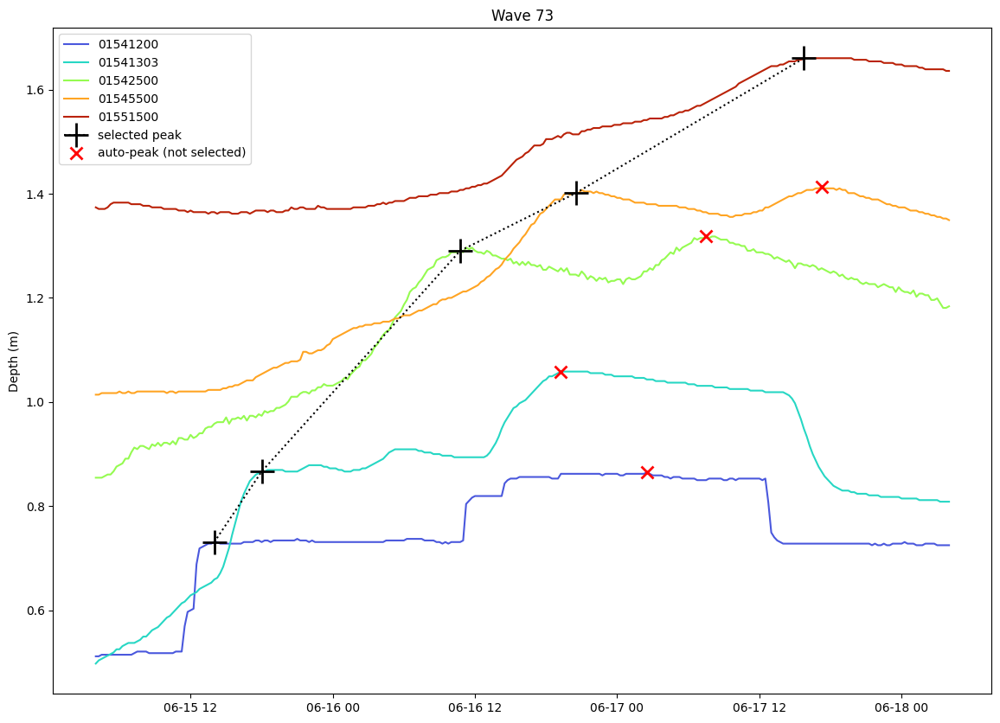

(01541200   2015-06-15 14:00:00+00:00
 01541303   2015-06-15 18:00:00+00:00
 01542500   2015-06-16 10:45:00+00:00
 01545500   2015-06-16 20:30:00+00:00
 01551500   2015-06-17 15:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.730955
 01541303    0.866380
 01542500    1.290412
 01545500    1.401110
 01551500    1.660255
 dtype: float64)

In [85]:
wave = 73
adjustment = pd.Timedelta('987 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-06-15 14:00:00+00:00',
          '01541303':'2015-06-15 18:00:00+00:00',
          '01542500':'2015-06-16 10:45:00+00:00',
          '01545500':'2015-06-16 20:30:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

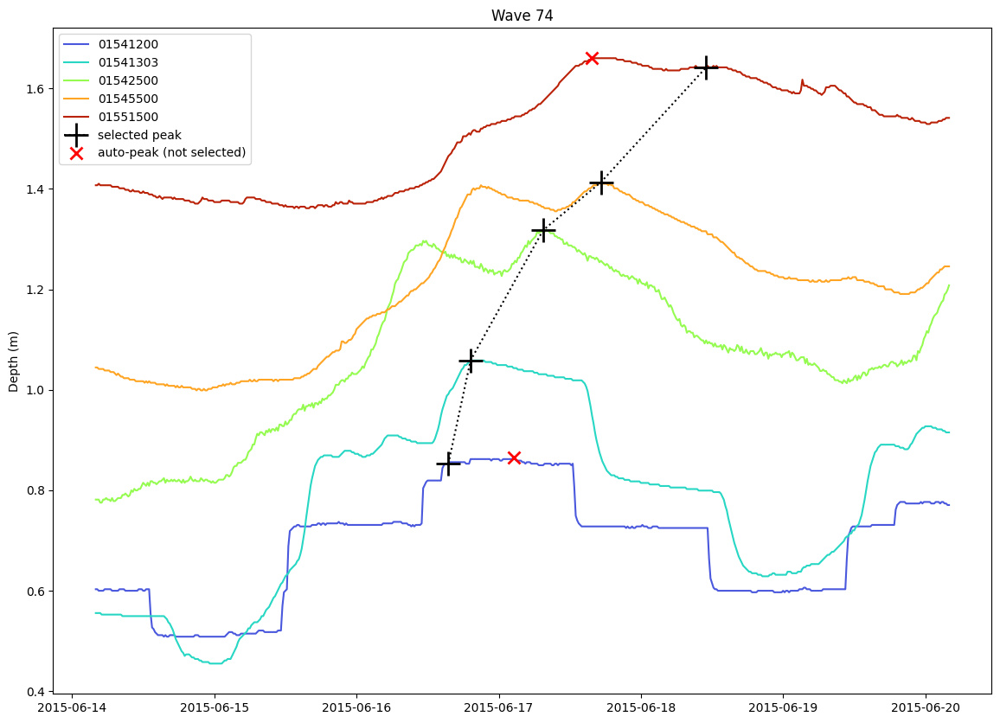

(01541200   2015-06-16 15:30:00+00:00
 01541303   2015-06-16 19:15:00+00:00
 01542500   2015-06-17 07:30:00+00:00
 01545500   2015-06-17 17:15:00+00:00
 01551500   2015-06-18 11:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.852875
 01541303    1.058404
 01542500    1.317844
 01545500    1.413302
 01551500    1.641967
 dtype: float64)

In [86]:
wave = 74
adjustment = pd.Timedelta('986 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-06-16 15:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'2015-04-14 0:15:00+00:00',
          #'01545500': '2015-04-14 8:30:00+00:00',
          '01551500':'2015-06-18 11:00:00+00:00', 
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

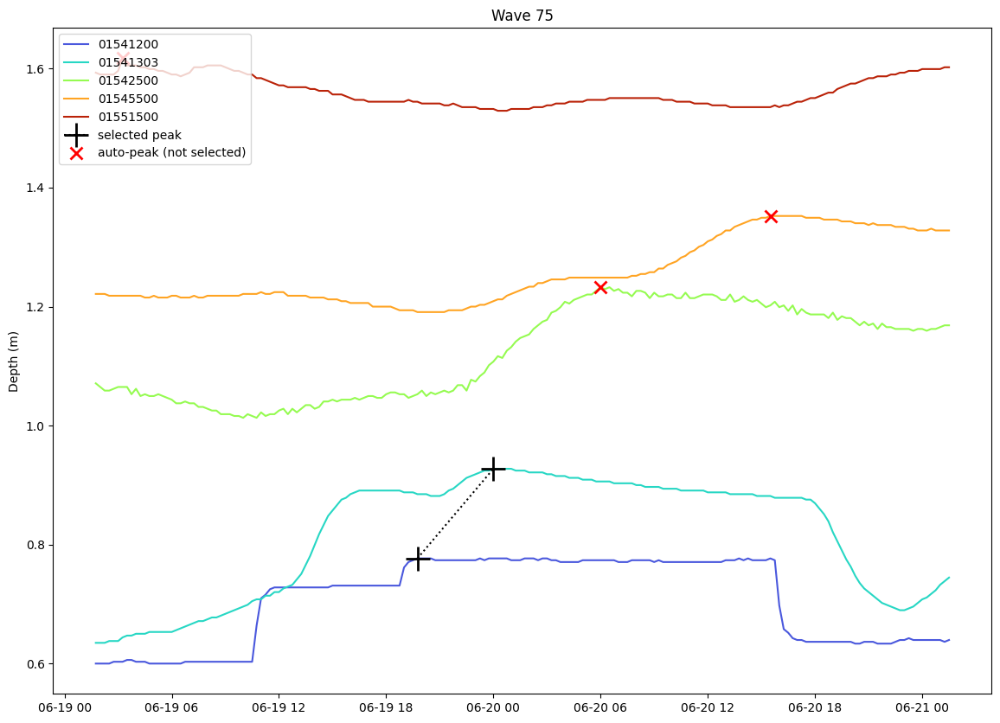

(01541200   2015-06-19 19:45:00+00:00
 01541303   2015-06-20 00:00:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.776675
 01541303    0.927340
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [87]:
wave = 75
adjustment = pd.Timedelta('990.9 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-06-16 15:30:00+00:00',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

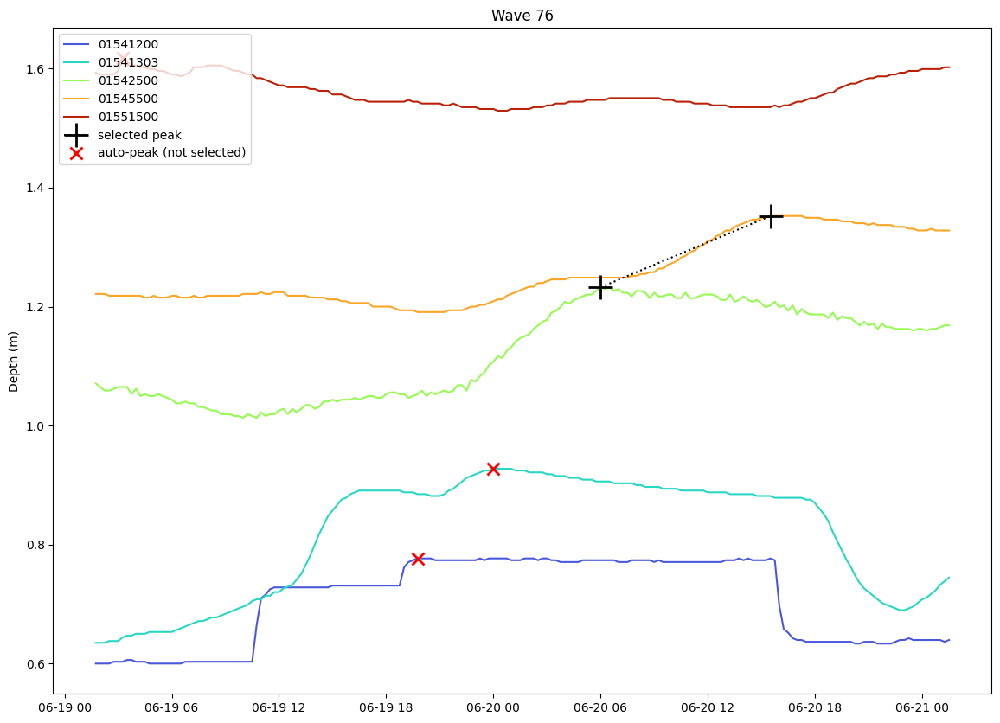

(01541200                         NaT
 01541303                         NaT
 01542500   2015-06-20 06:00:00+00:00
 01545500   2015-06-20 15:30:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.232500
 01545500    1.352342
 01551500         NaN
 dtype: float64)

In [88]:
wave = 76
adjustment = pd.Timedelta('990.9 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

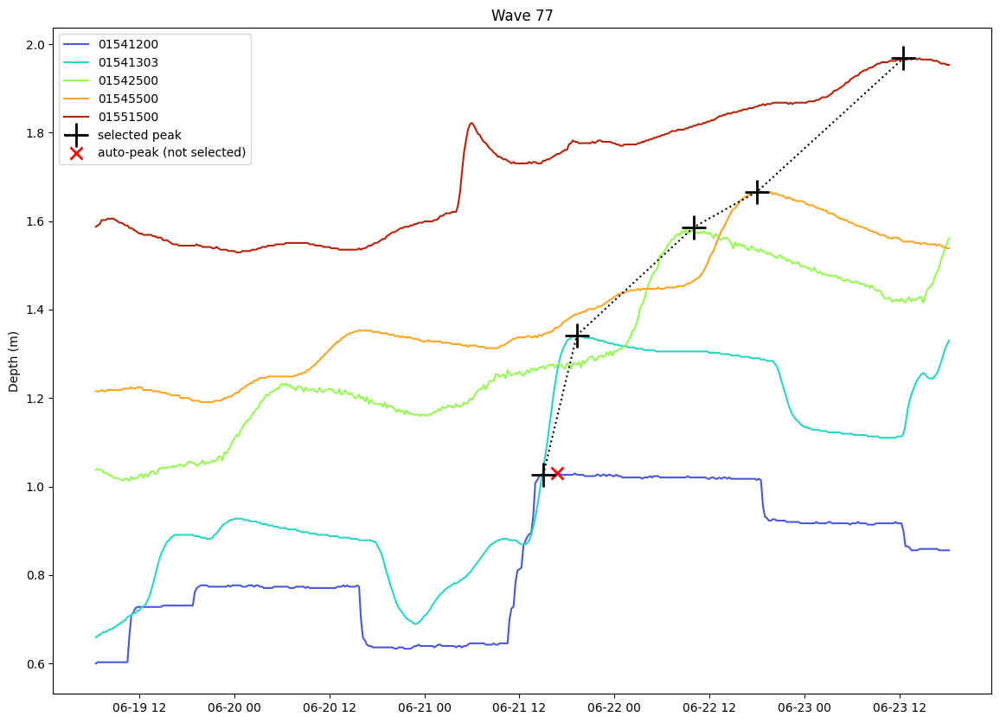

(01541200   2015-06-21 15:00:00+00:00
 01541303   2015-06-21 19:15:00+00:00
 01542500   2015-06-22 10:00:00+00:00
 01545500   2015-06-22 18:00:00+00:00
 01551500   2015-06-23 12:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.026611
 01541303    1.341868
 01542500    1.586068
 01545500    1.666286
 01551500    1.968103
 dtype: float64)

In [89]:
wave = 77
adjustment = pd.Timedelta('991.1 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-06-21 15:00:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '4.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

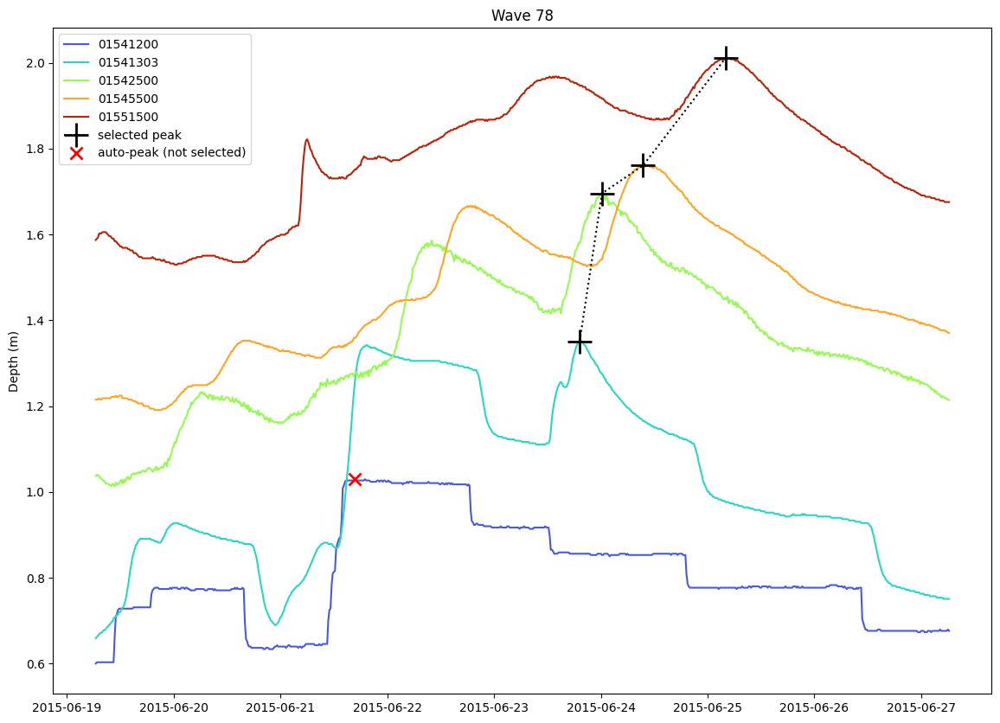

(01541200                         NaT
 01541303   2015-06-23 19:15:00+00:00
 01542500   2015-06-24 00:15:00+00:00
 01545500   2015-06-24 09:30:00+00:00
 01551500   2015-06-25 04:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303    1.351012
 01542500    1.695796
 01545500    1.760774
 01551500    2.010775
 dtype: float64)

In [90]:
wave = 78
adjustment = pd.Timedelta('991.1 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

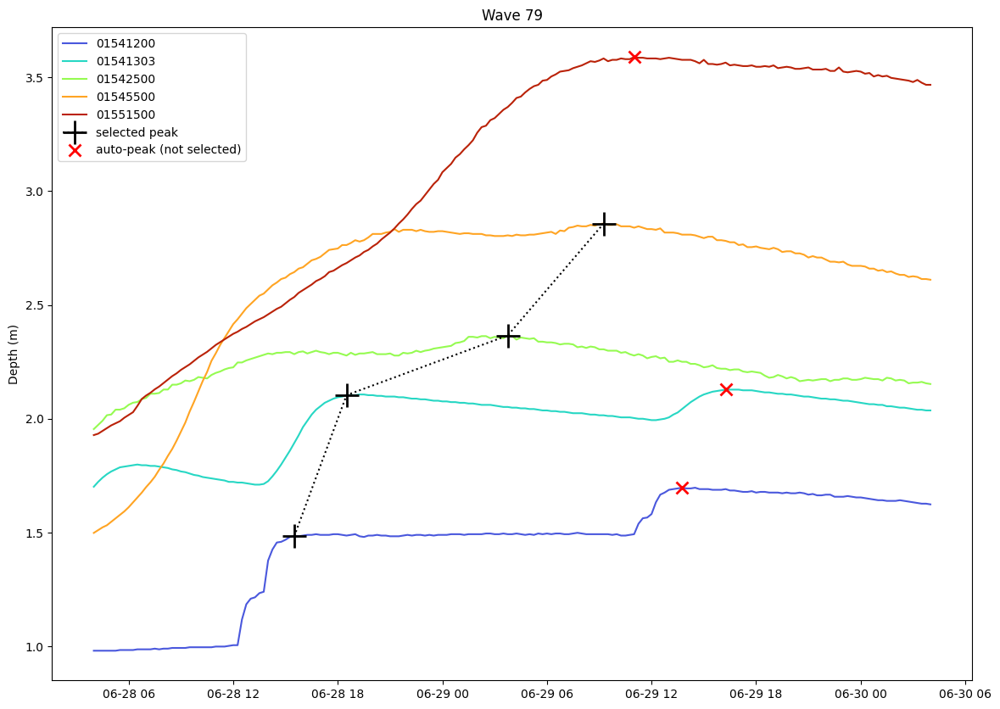

(01541200   2015-06-28 15:30:00+00:00
 01541303   2015-06-28 18:30:00+00:00
 01542500   2015-06-29 03:45:00+00:00
 01545500   2015-06-29 09:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.483811
 01541303    2.103868
 01542500    2.366356
 01545500    2.858054
 01551500         NaN
 dtype: float64)

In [91]:
wave = 79
adjustment = pd.Timedelta('1000 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-06-28 15:30:00+00:00',
          '01541303':'2015-06-28 18:30:00+00:00',
          #'01542500':'skip',
          #'01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

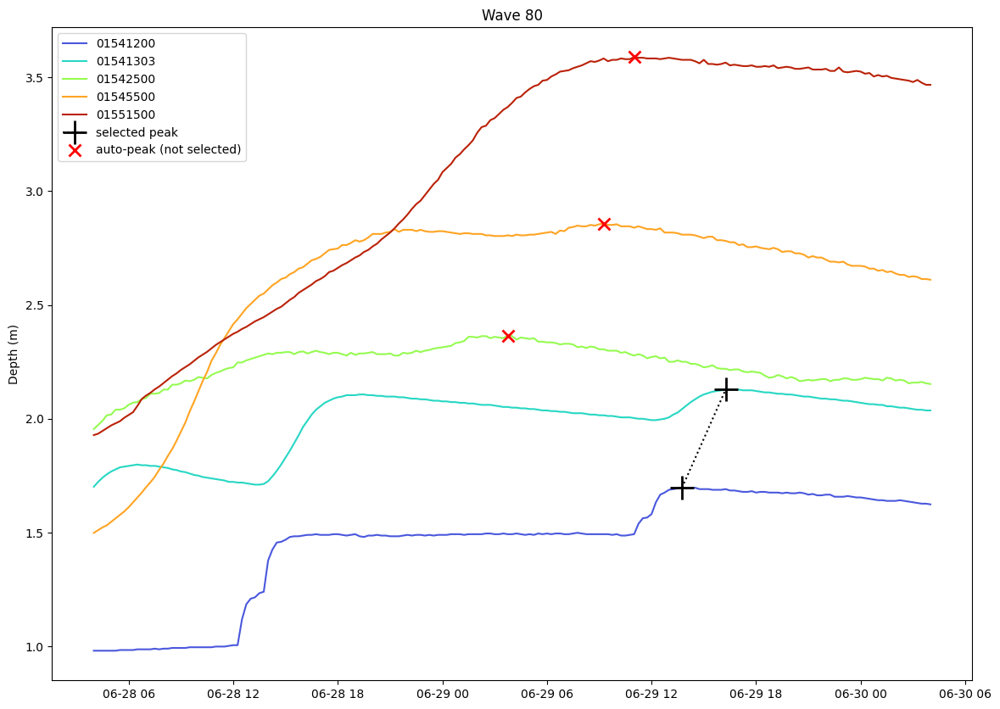

(01541200   2015-06-29 13:45:00+00:00
 01541303   2015-06-29 16:15:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.697171
 01541303    2.128252
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [92]:
wave = 80
adjustment = pd.Timedelta('1000 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-06-28 15:30:00+00:00',
          #'01541303':'2015-06-28 18:30:00+00:00',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

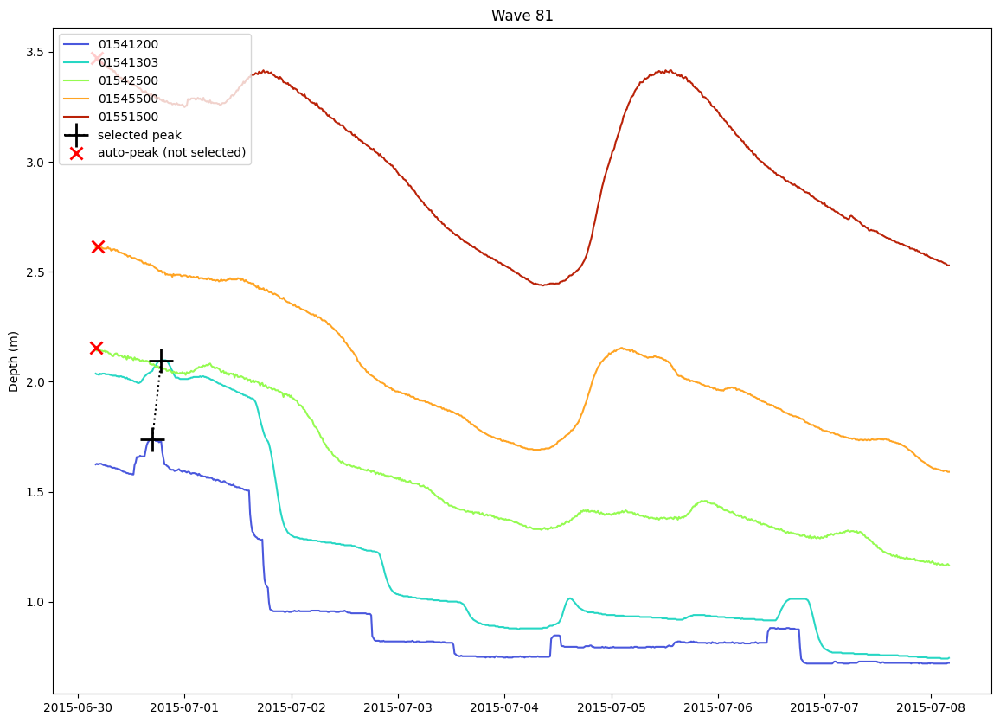

(01541200   2015-06-30 16:45:00+00:00
 01541303   2015-06-30 18:45:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.739843
 01541303    2.097772
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [93]:
wave = 81
adjustment = pd.Timedelta('1002 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-06-28 15:30:00+00:00',
          #'01541303':'2015-06-28 18:30:00+00:00',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

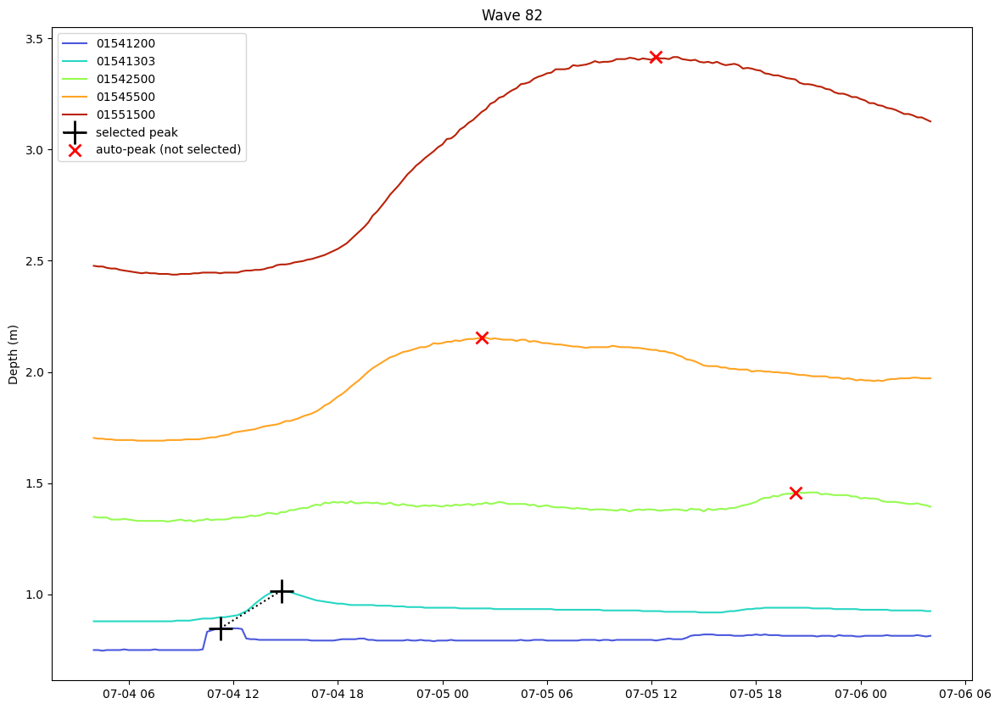

(01541200   2015-07-04 11:15:00+00:00
 01541303   2015-07-04 14:45:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.846779
 01541303    1.015732
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [94]:
wave = 82
adjustment = pd.Timedelta('1006 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500': 'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

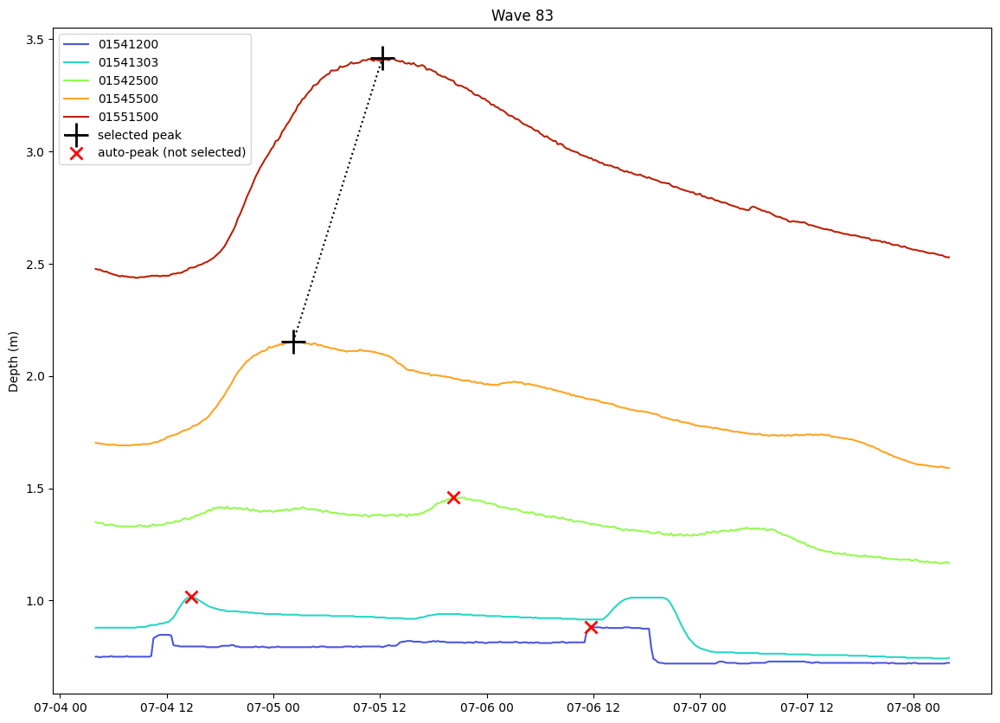

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2015-07-05 02:15:00+00:00
 01551500   2015-07-05 12:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    2.153966
 01551500    3.415903
 dtype: float64)

In [95]:
wave = 83
adjustment = pd.Timedelta('1006 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500': 'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

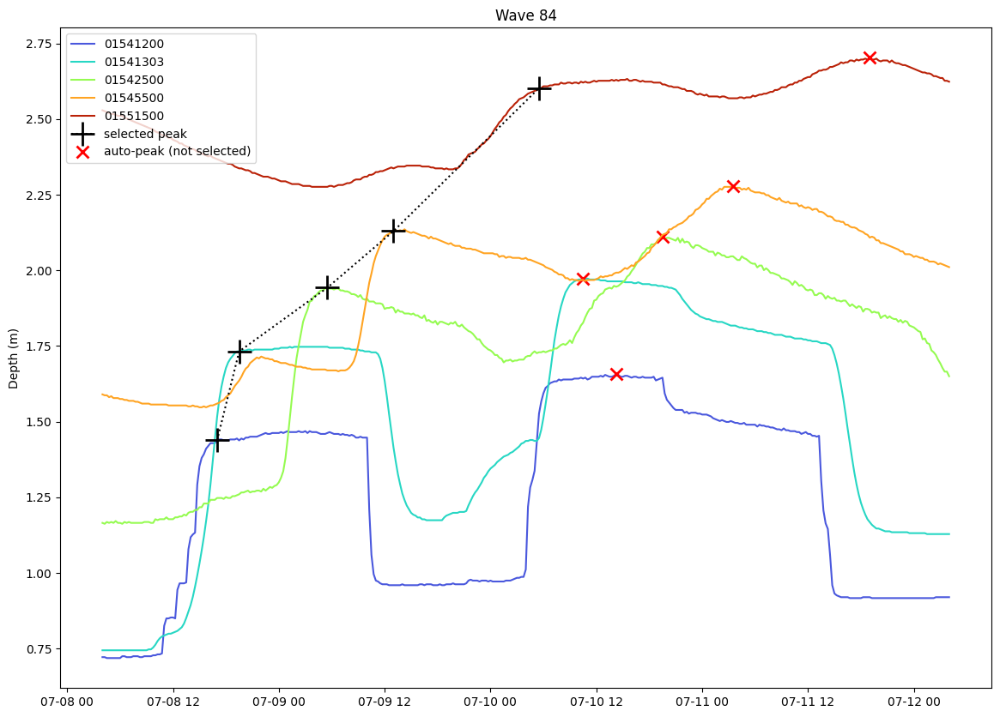

(01541200   2015-07-08 17:00:00+00:00
 01541303   2015-07-08 19:30:00+00:00
 01542500   2015-07-09 05:30:00+00:00
 01545500   2015-07-09 13:00:00+00:00
 01551500   2015-07-10 05:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.438091
 01541303    1.732012
 01542500    1.942684
 01545500    2.129582
 01551500    2.602087
 dtype: float64)

In [96]:
wave = 84
adjustment = pd.Timedelta('1010 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-07-08 17:00:00+00:00',
          '01541303':'2015-07-08 19:30:00+00:00',
          '01542500':'2015-07-09 05:30:00+00:00',
          '01545500':'2015-07-09 13:00:00+00:00',
          '01551500':'2015-07-10 05:30:00+00:00', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

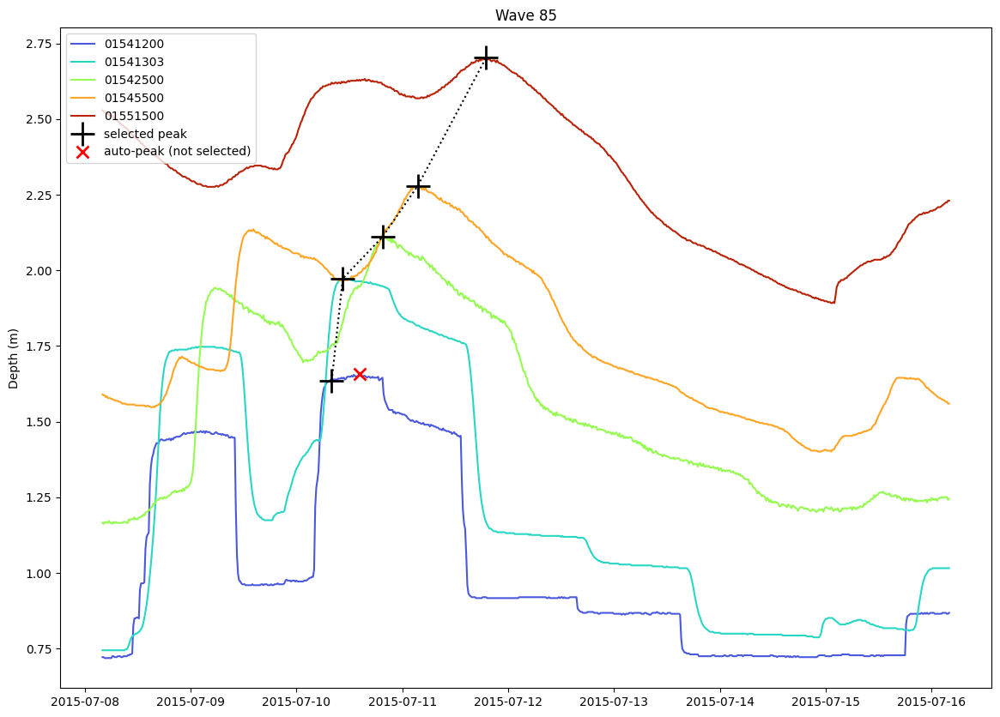

(01541200   2015-07-10 08:00:00+00:00
 01541303   2015-07-10 10:30:00+00:00
 01542500   2015-07-10 19:30:00+00:00
 01545500   2015-07-11 03:30:00+00:00
 01551500   2015-07-11 19:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.636211
 01541303    1.972804
 01542500    2.110324
 01545500    2.278934
 01551500    2.702671
 dtype: float64)

In [97]:
wave = 85
adjustment = pd.Timedelta('1010 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-07-10 8:00:00+00:00',
          #'01541303':'2015-07-08 19:30:00+00:00',
          #'01542500':'skip',
          #'01545500':'2015-07-09 13:00:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

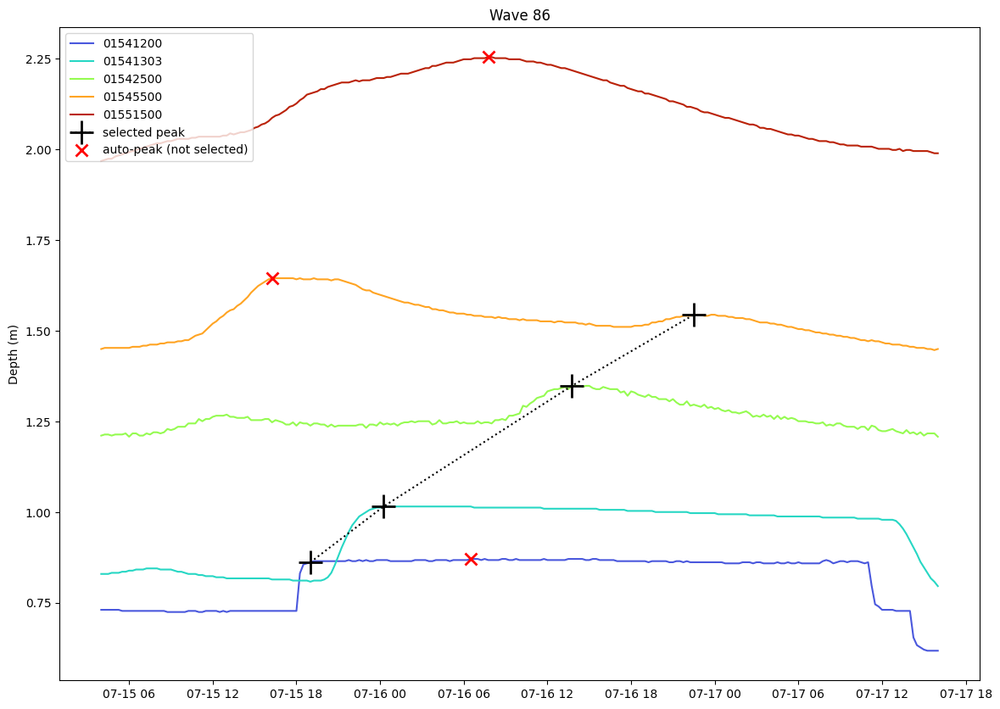

(01541200   2015-07-15 19:00:00+00:00
 01541303   2015-07-16 00:15:00+00:00
 01542500   2015-07-16 13:45:00+00:00
 01545500   2015-07-16 22:30:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.862019
 01541303    1.015732
 01542500    1.348324
 01545500    1.544366
 01551500         NaN
 dtype: float64)

In [98]:
wave = 86
adjustment = pd.Timedelta('1017 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-07-15 19:00:00+00:00',
          #'01541303':'2015-07-08 19:30:00+00:00',
          #'01542500':'skip',
          '01545500':'2015-07-16 22:30:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

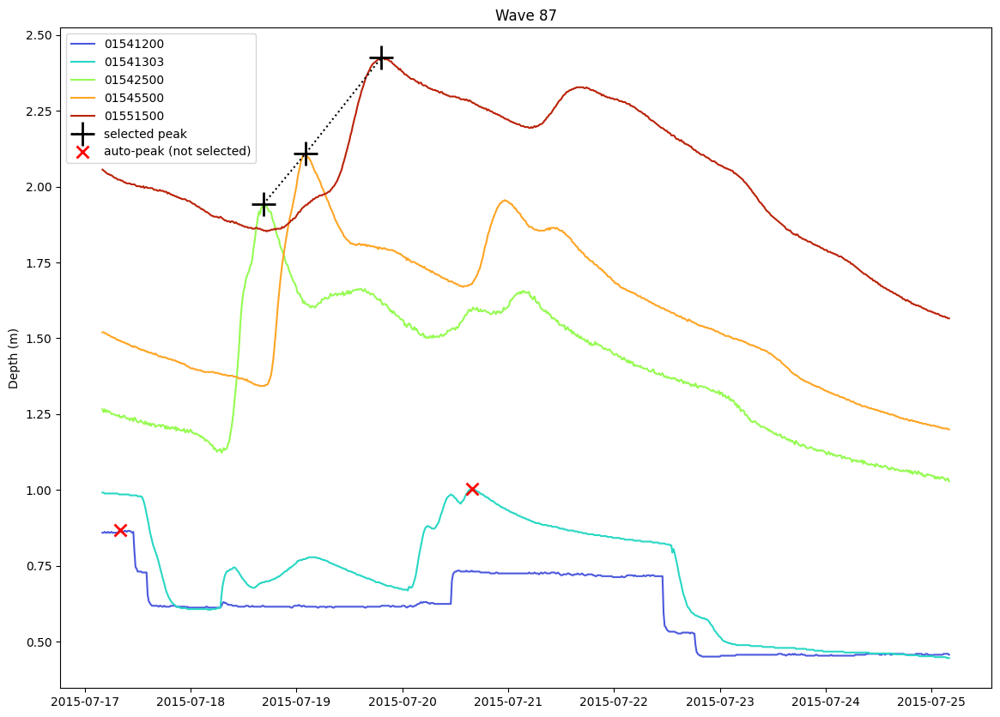

(01541200                         NaT
 01541303                         NaT
 01542500   2015-07-18 16:30:00+00:00
 01545500   2015-07-19 02:00:00+00:00
 01551500   2015-07-19 19:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.942684
 01545500    2.108246
 01551500    2.425303
 dtype: float64)

In [99]:
wave = 87
adjustment = pd.Timedelta('1019 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500':'2015-07-16 22:30:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

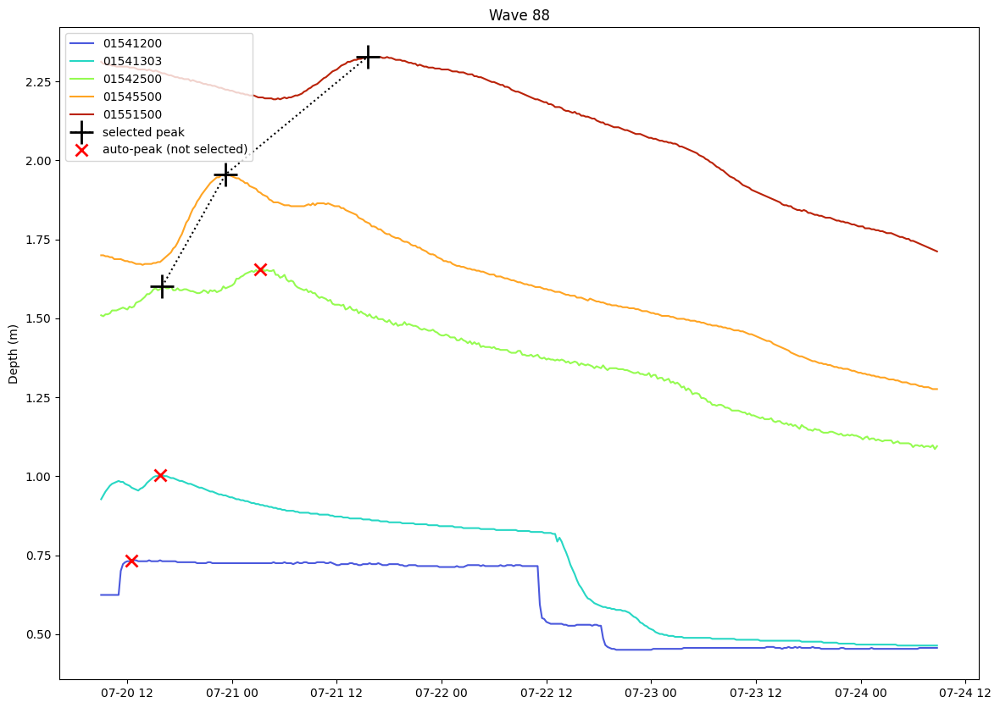

(01541200                         NaT
 01541303                         NaT
 01542500   2015-07-20 16:00:00+00:00
 01545500   2015-07-20 23:15:00+00:00
 01551500   2015-07-21 15:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.601308
 01545500    1.955846
 01551500    2.327767
 dtype: float64)

In [100]:
wave = 88
adjustment = pd.Timedelta('1022.2 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'2015-07-20 16:00:00+00:00',
          #'01545500':'2015-07-16 22:30:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

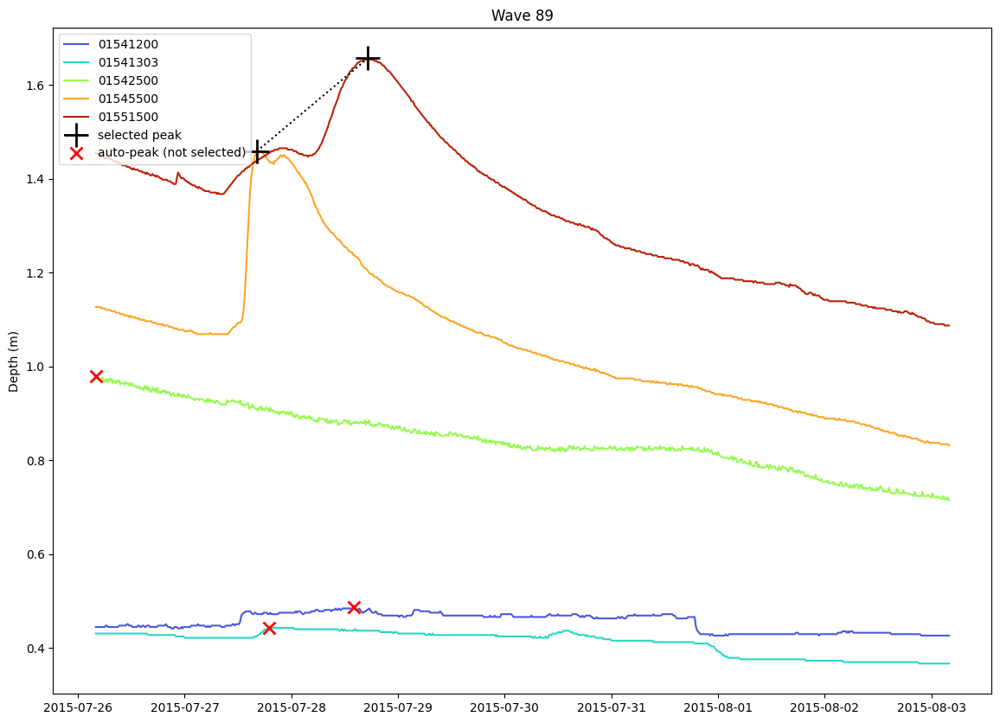

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2015-07-27 16:15:00+00:00
 01551500   2015-07-28 17:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.459022
 01551500    1.657207
 dtype: float64)

In [101]:
wave = 89
adjustment = pd.Timedelta('1028 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'2015-07-16 22:30:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

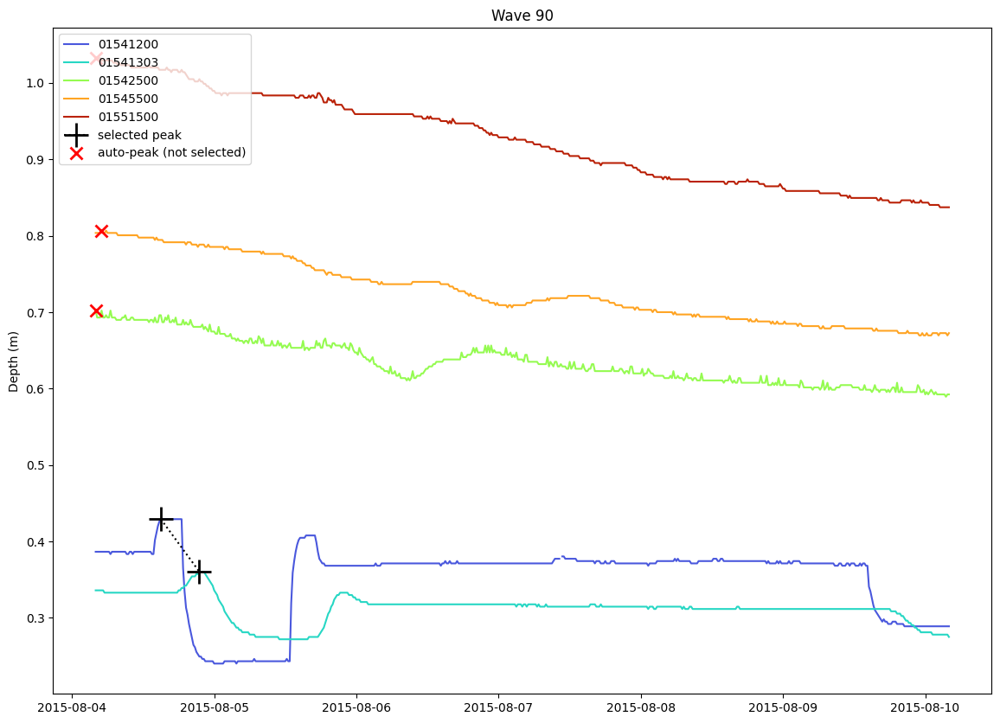

(01541200   2015-08-04 15:00:00+00:00
 01541303   2015-08-04 21:30:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.429203
 01541303    0.360412
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [102]:
wave = 90
adjustment = pd.Timedelta('1037 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

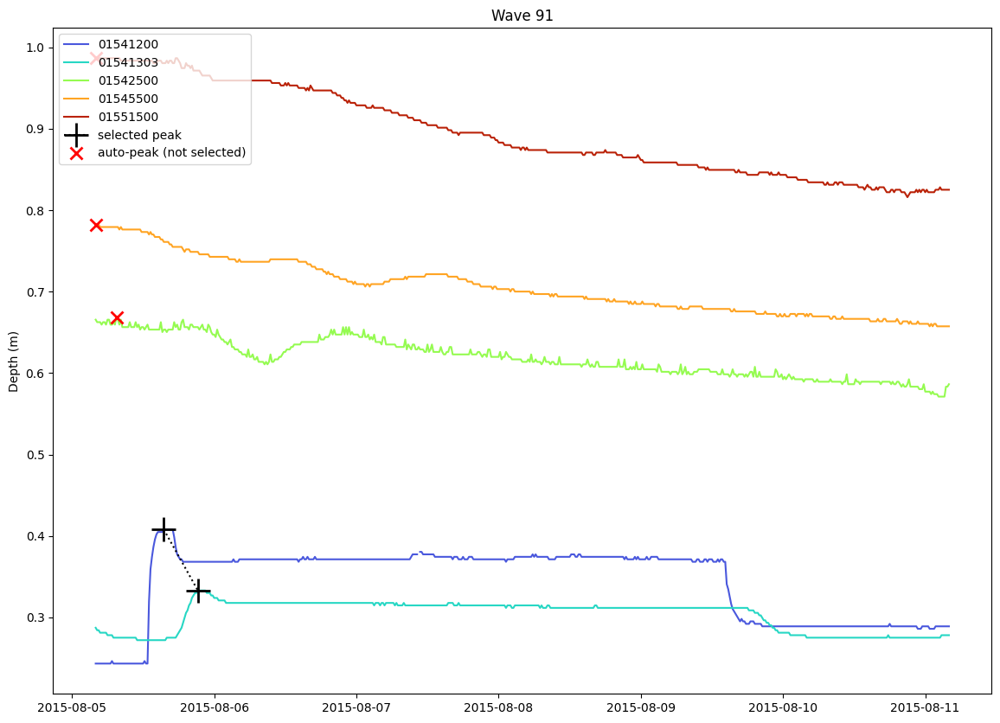

(01541200   2015-08-05 15:30:00+00:00
 01541303   2015-08-05 21:15:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.407867
 01541303    0.332980
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [103]:
wave = 91
adjustment = pd.Timedelta('1038 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

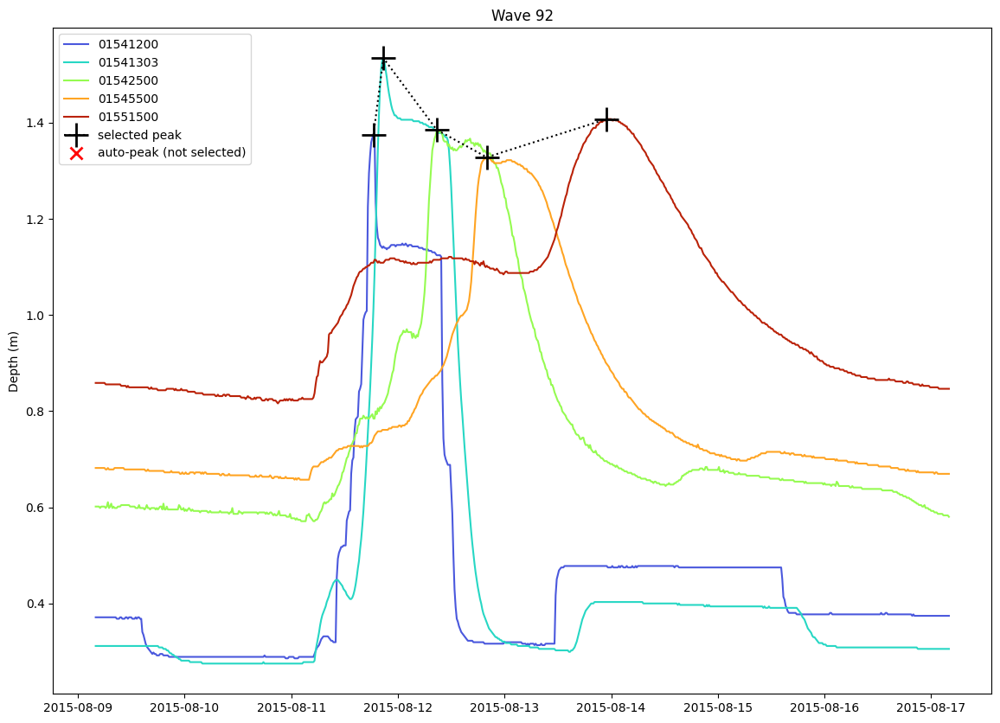

(01541200   2015-08-11 18:30:00+00:00
 01541303   2015-08-11 20:45:00+00:00
 01542500   2015-08-12 08:45:00+00:00
 01545500   2015-08-12 20:00:00+00:00
 01551500   2015-08-13 23:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.374083
 01541303    1.533892
 01542500    1.384900
 01545500    1.327958
 01551500    1.407271
 dtype: float64)

In [104]:
wave = 92
adjustment = pd.Timedelta('1042 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

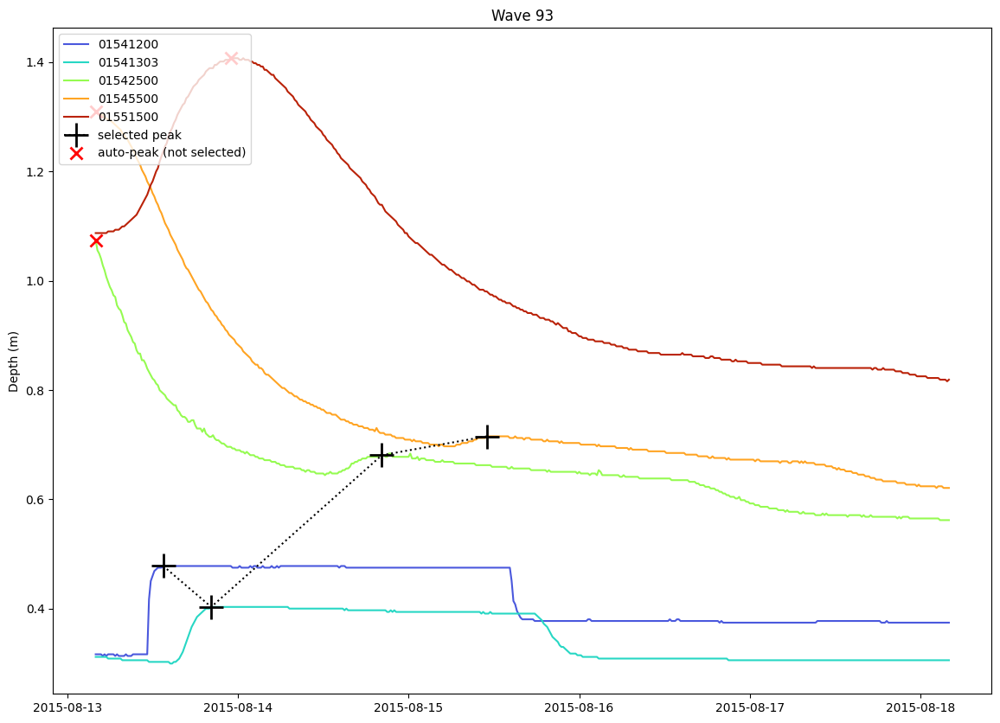

(01541200   2015-08-13 13:30:00+00:00
 01541303   2015-08-13 20:15:00+00:00
 01542500   2015-08-14 20:15:00+00:00
 01545500   2015-08-15 11:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.477971
 01541303    0.403084
 01542500    0.680812
 01545500    0.715310
 01551500         NaN
 dtype: float64)

In [105]:
wave = 93
adjustment = pd.Timedelta('1046 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'2015-08-14 20:15:00+00:00',
          '01545500':'2015-08-15 11:00:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

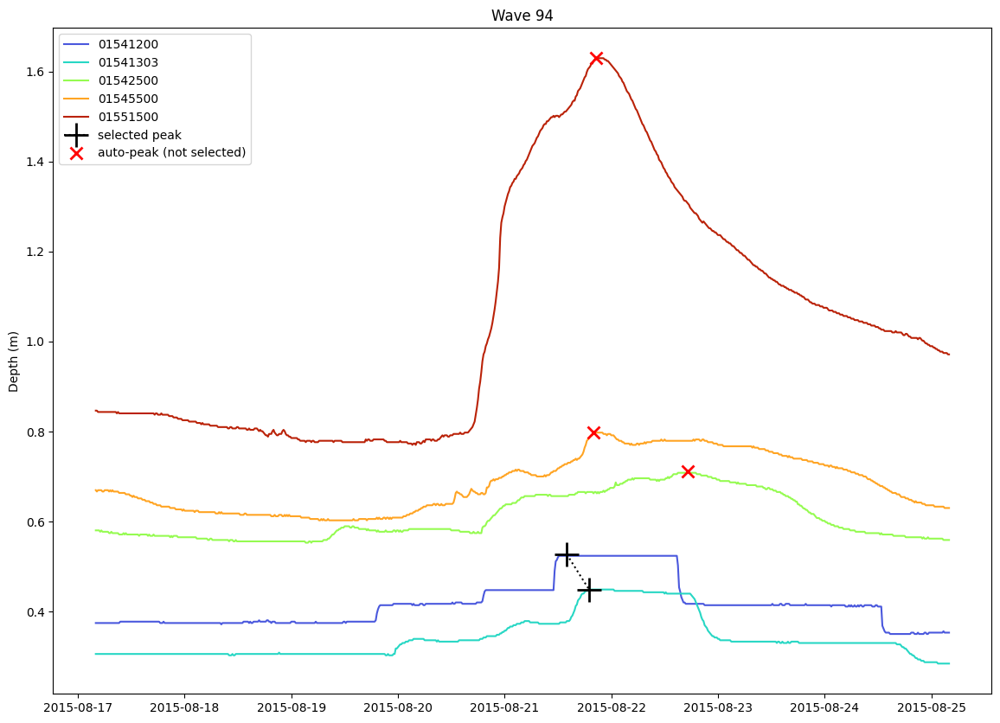

(01541200   2015-08-21 14:00:00+00:00
 01541303   2015-08-21 19:00:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.526739
 01541303    0.448804
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [106]:
wave = 94
adjustment = pd.Timedelta('1050 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

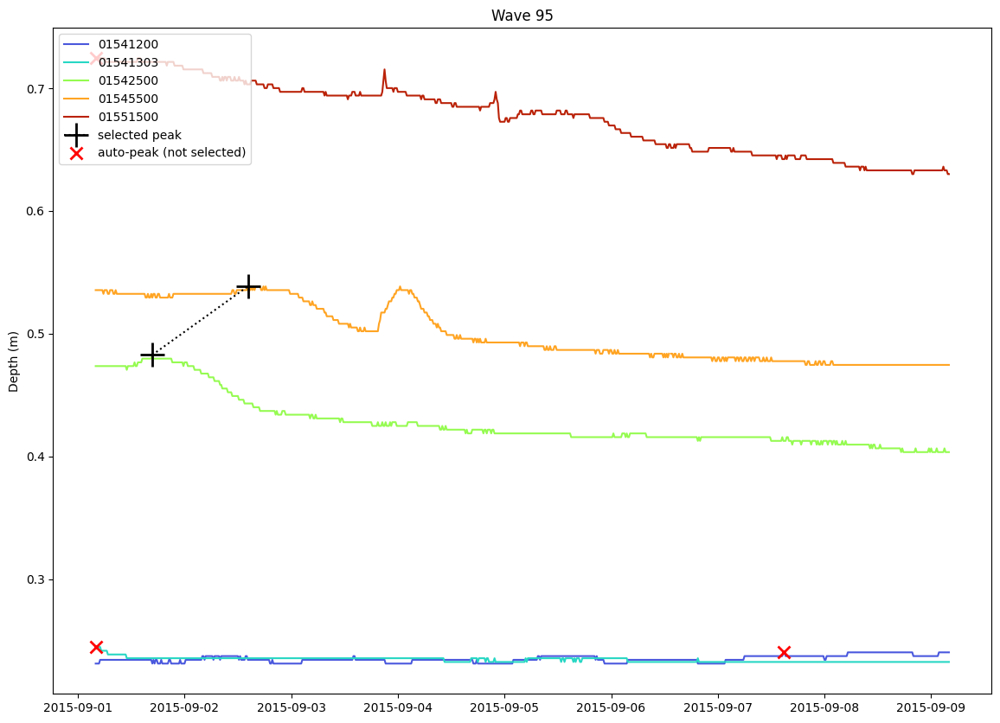

(01541200                         NaT
 01541303                         NaT
 01542500   2015-09-01 16:45:00+00:00
 01545500   2015-09-02 14:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.482692
 01545500    0.538526
 01551500         NaN
 dtype: float64)

In [107]:
wave = 95
adjustment = pd.Timedelta('1065 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

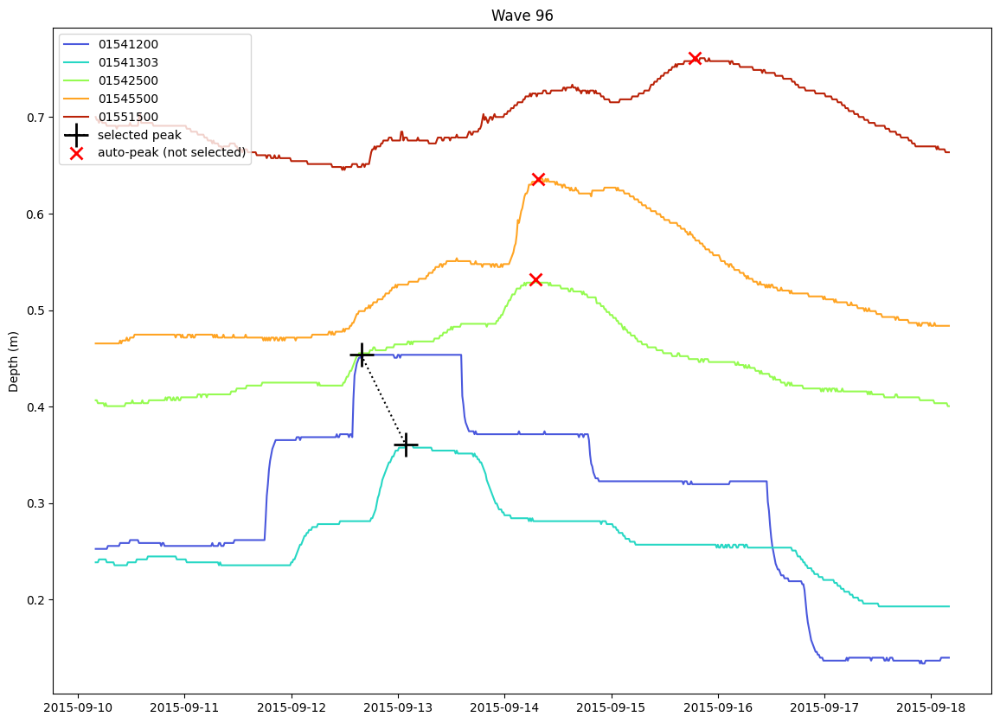

(01541200   2015-09-12 15:45:00+00:00
 01541303   2015-09-13 01:45:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.453587
 01541303    0.360412
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [108]:
wave = 96
adjustment = pd.Timedelta('1074 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

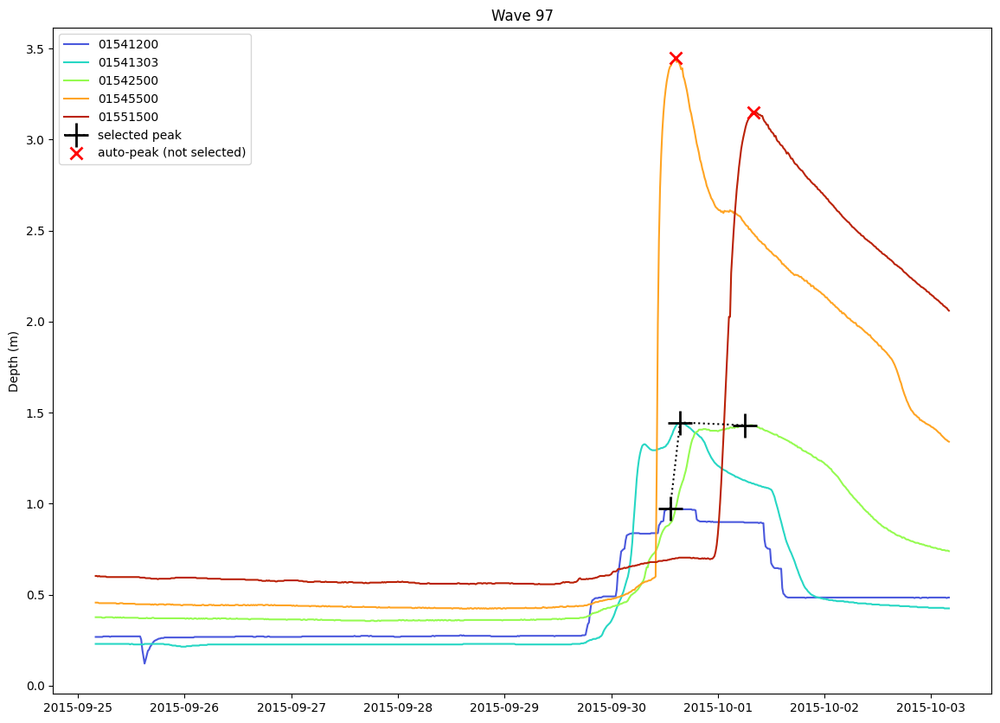

(01541200   2015-09-30 13:15:00+00:00
 01541303   2015-09-30 15:30:00+00:00
 01542500   2015-10-01 06:00:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.971747
 01541303    1.445500
 01542500    1.430620
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [109]:
wave = 97
adjustment = pd.Timedelta('1089 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

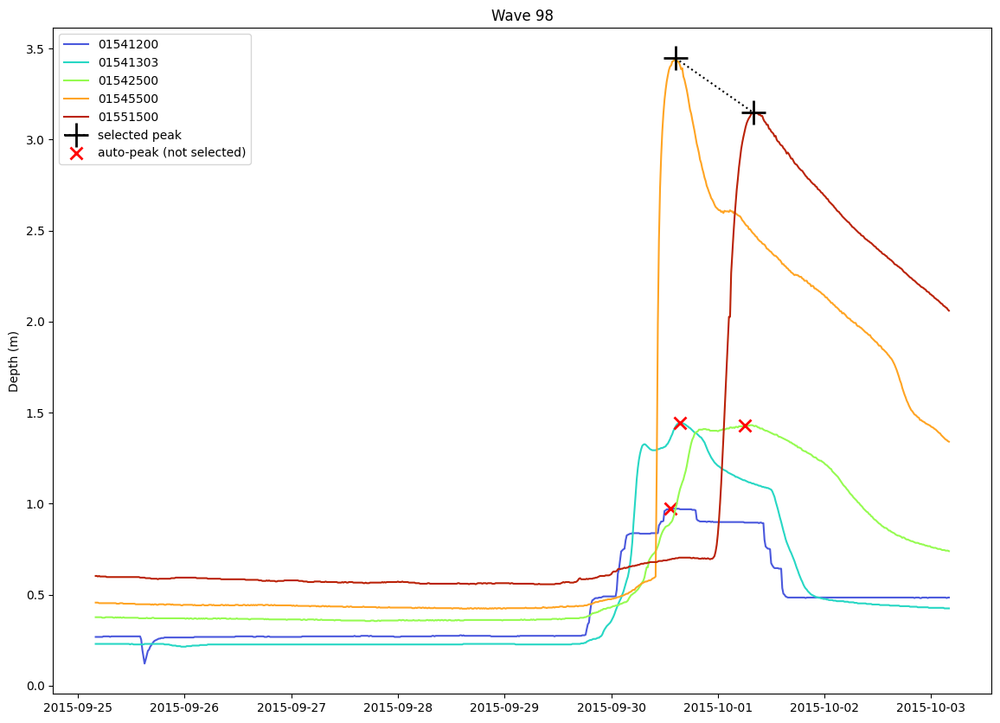

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2015-09-30 14:30:00+00:00
 01551500   2015-10-01 08:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    3.446318
 01551500    3.147679
 dtype: float64)

In [110]:
wave = 98 #Last wave of year 3
adjustment = pd.Timedelta('1089 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

# Data Collection for Year 4

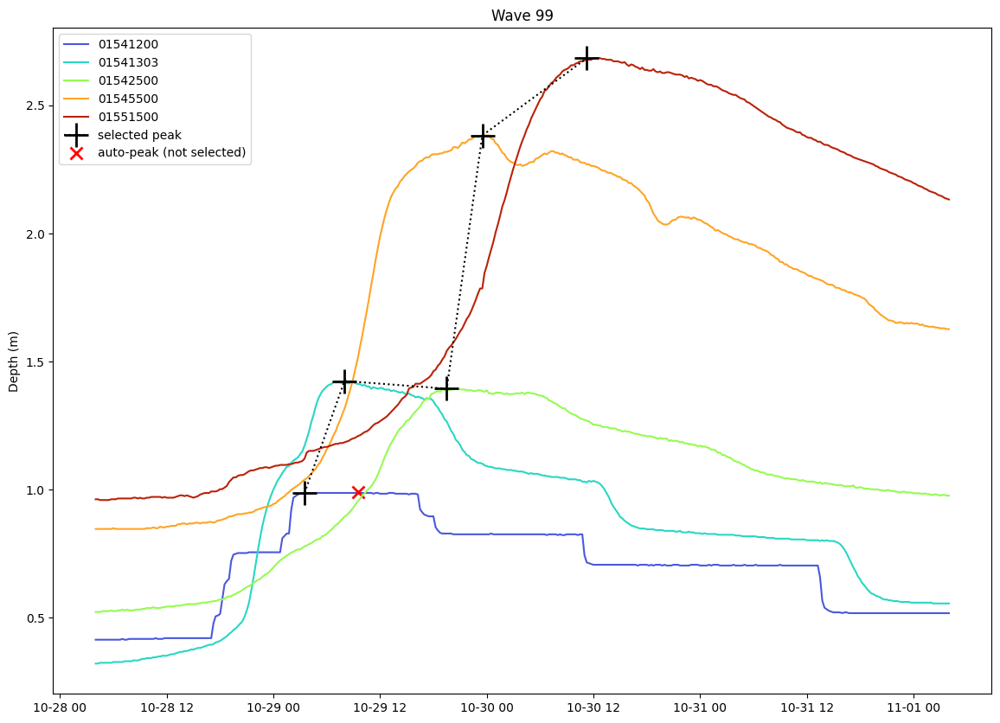

(01541200   2015-10-29 03:30:00+00:00
 01541303   2015-10-29 08:00:00+00:00
 01542500   2015-10-29 19:30:00+00:00
 01545500   2015-10-29 23:30:00+00:00
 01551500   2015-10-30 11:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.986987
 01541303    1.424164
 01542500    1.394044
 01545500    2.382566
 01551500    2.684383
 dtype: float64)

In [111]:
wave = 99
adjustment = pd.Timedelta('1122 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-10-29 03:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

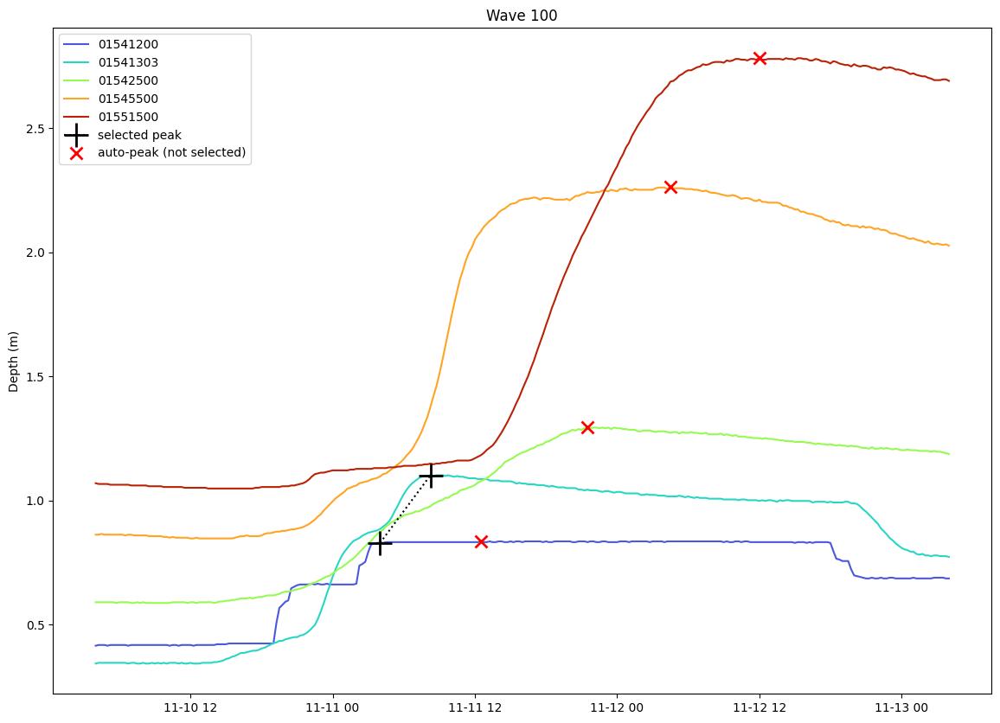

(01541200   2015-11-11 04:00:00+00:00
 01541303   2015-11-11 08:15:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.828491
 01541303    1.101076
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [112]:
wave = 100
adjustment = pd.Timedelta('1135 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-11-11 4:00:00+00:00',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

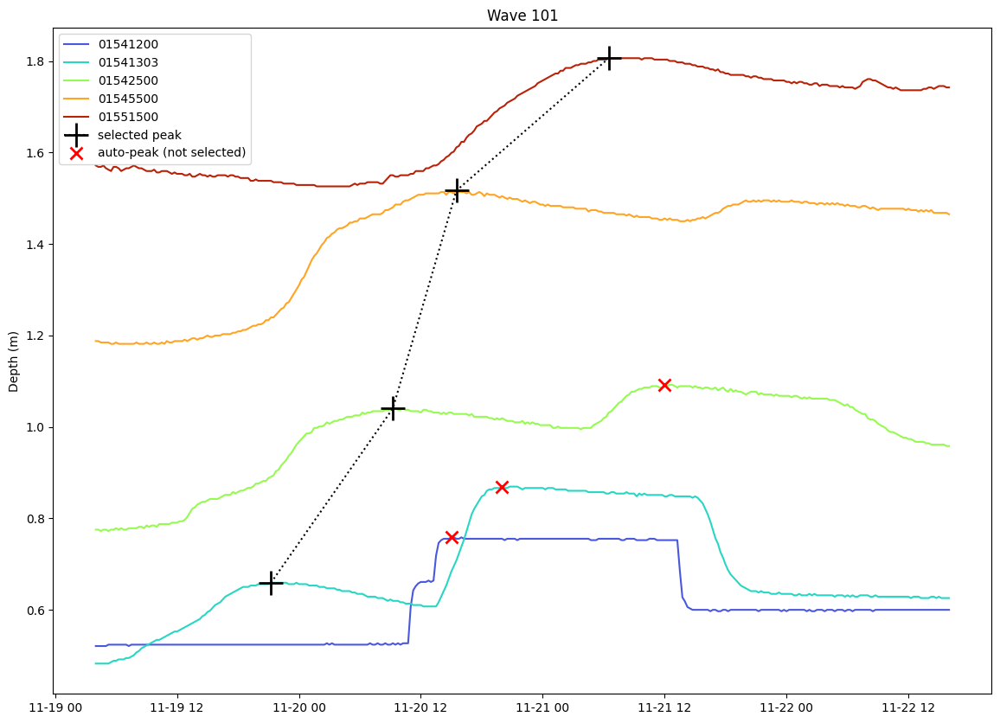

(01541200                         NaT
 01541303   2015-11-19 21:15:00+00:00
 01542500   2015-11-20 09:15:00+00:00
 01545500   2015-11-20 15:30:00+00:00
 01551500   2015-11-21 06:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303    0.659116
 01542500    1.040476
 01545500    1.516934
 01551500    1.806559
 dtype: float64)

In [113]:
wave = 101
adjustment = pd.Timedelta('1144 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'2015-11-19 21:15:00+00:00',
          '01542500':'2015-11-20 09:15:00+00:00',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '3.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

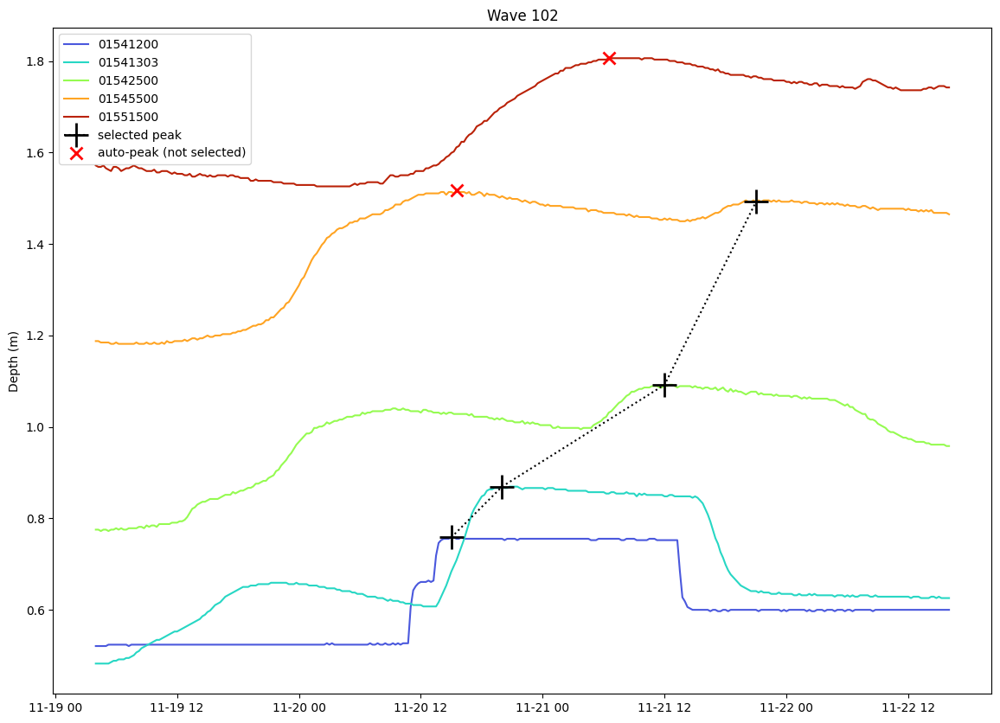

(01541200   2015-11-20 15:00:00+00:00
 01541303   2015-11-20 20:00:00+00:00
 01542500   2015-11-21 12:00:00+00:00
 01545500   2015-11-21 21:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.758387
 01541303    0.869428
 01542500    1.092292
 01545500    1.492550
 01551500         NaN
 dtype: float64)

In [114]:
wave = 102
adjustment = pd.Timedelta('1144 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'2015-11-19 21:15:00+00:00',
          #'01542500':'2015-11-20 09:15:00+00:00',
          '01545500':'2015-11-21 21:00:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '3.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

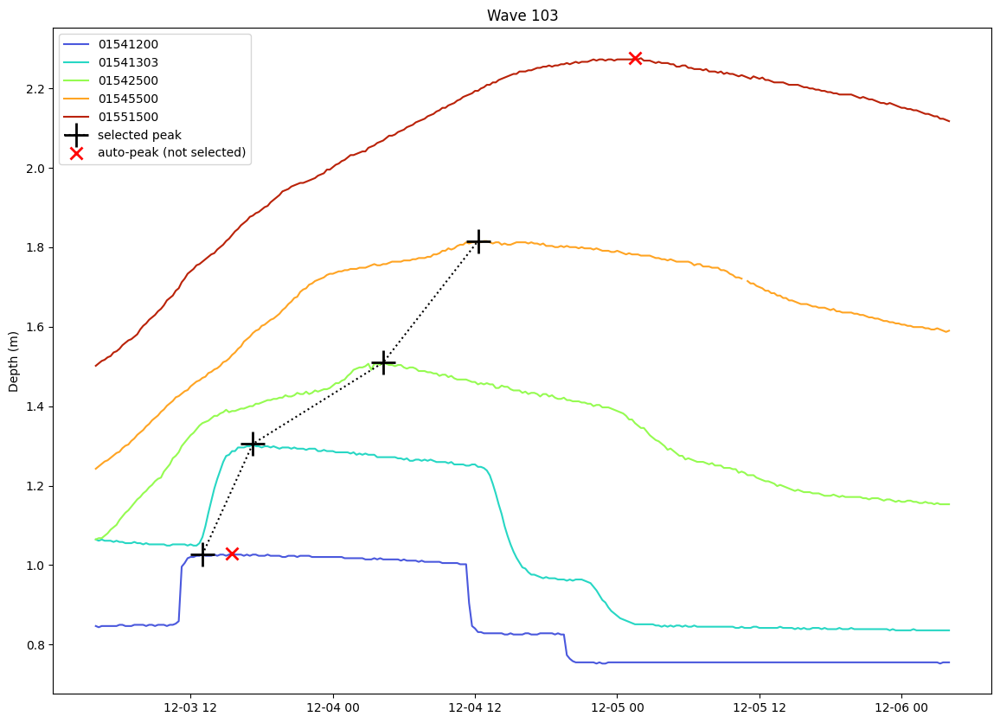

(01541200   2015-12-03 13:00:00+00:00
 01541303   2015-12-03 17:15:00+00:00
 01542500   2015-12-04 04:15:00+00:00
 01545500   2015-12-04 12:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    1.026611
 01541303    1.305292
 01542500    1.509868
 01545500    1.815638
 01551500         NaN
 dtype: float64)

In [115]:
wave = 103
adjustment = pd.Timedelta('1158 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-12-03 13:00:00+00:00',
          #'01541303':'2015-11-19 21:15:00+00:00',
          #'01542500':'2015-11-20 09:15:00+00:00',
          #'01545500':'2015-11-21 21:00:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

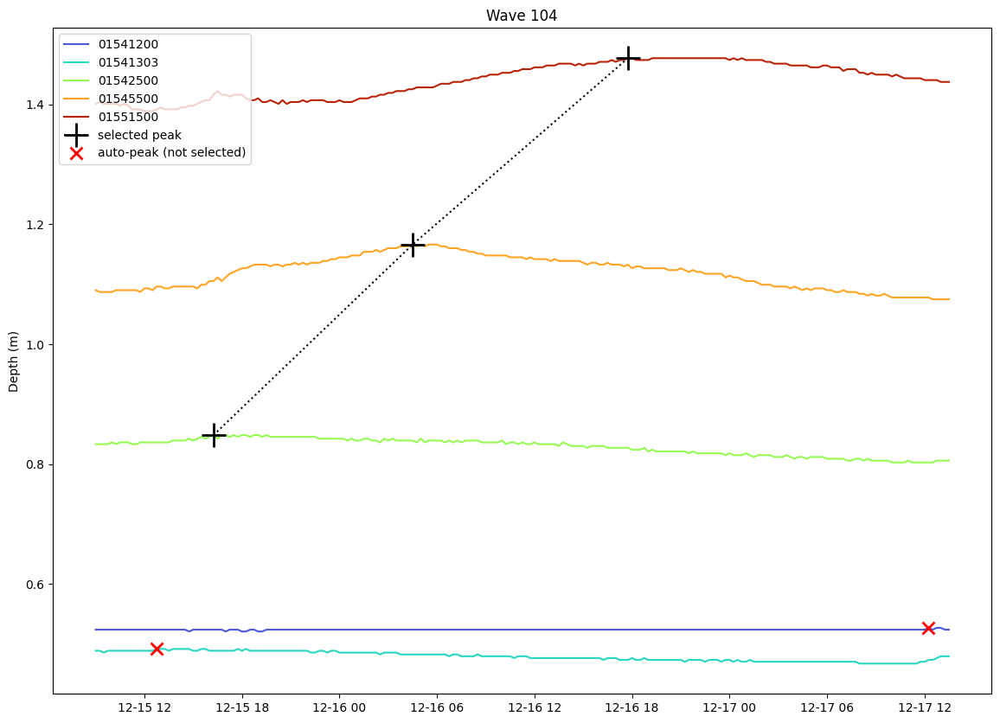

(01541200                         NaT
 01541303                         NaT
 01542500   2015-12-15 16:15:00+00:00
 01545500   2015-12-16 04:30:00+00:00
 01551500   2015-12-16 17:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.848452
 01545500    1.166414
 01551500    1.477375
 dtype: float64)

In [116]:
wave = 104
adjustment = pd.Timedelta('1170.2 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'2015-11-20 09:15:00+00:00',
          #'01545500':'2015-11-21 21:00:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '2.2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

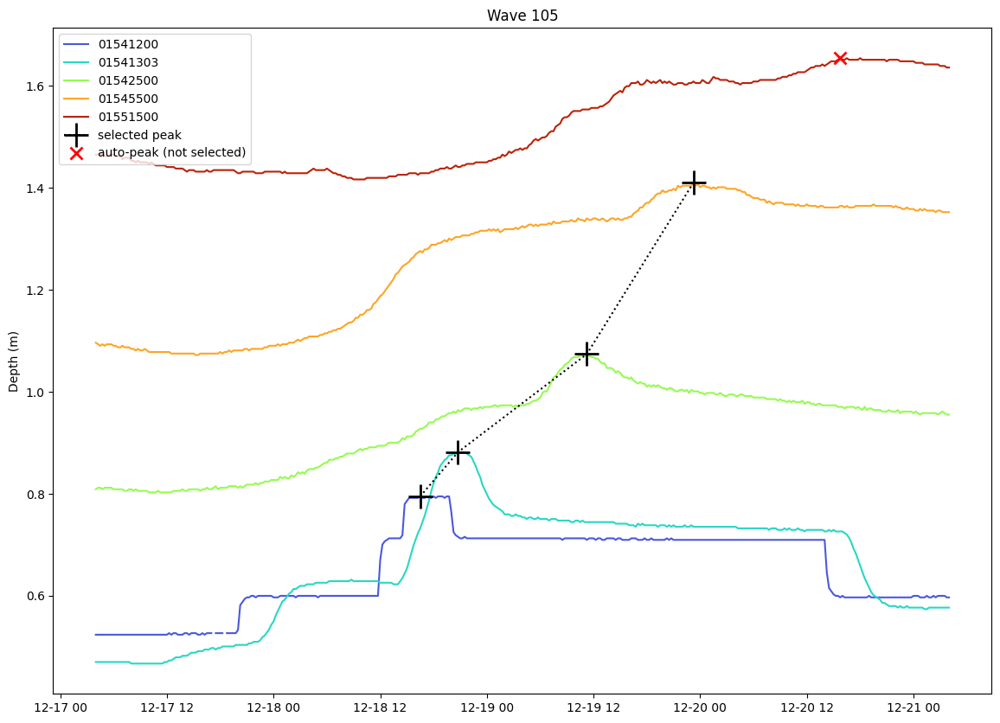

(01541200   2015-12-18 16:30:00+00:00
 01541303   2015-12-18 20:45:00+00:00
 01542500   2015-12-19 11:15:00+00:00
 01545500   2015-12-19 23:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.794963
 01541303    0.881620
 01542500    1.074004
 01545500    1.410254
 01551500         NaN
 dtype: float64)

In [117]:
wave = 105
adjustment = pd.Timedelta('1172 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'2015-11-19 21:15:00+00:00',
          #'01542500':'2015-11-20 09:15:00+00:00',
          #'01545500':'2015-11-21 21:00:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

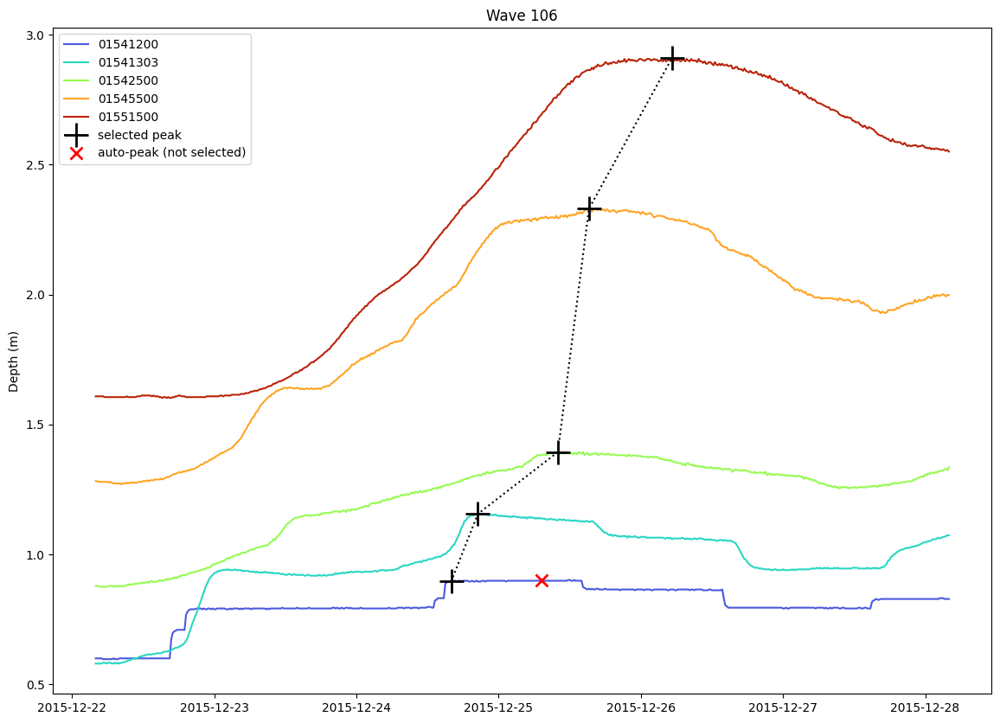

(01541200   2015-12-24 16:00:00+00:00
 01541303   2015-12-24 20:30:00+00:00
 01542500   2015-12-25 10:00:00+00:00
 01545500   2015-12-25 15:15:00+00:00
 01551500   2015-12-26 05:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.895547
 01541303    1.155940
 01542500    1.394044
 01545500    2.330750
 01551500    2.909935
 dtype: float64)

In [118]:
wave = 106
adjustment = pd.Timedelta('1177 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-12-24 16:00:00+00:00',
          #'01541303':'2015-11-19 21:15:00+00:00',
          #'01542500':'2015-11-20 09:15:00+00:00',
          #'01545500':'2015-11-21 21:00:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

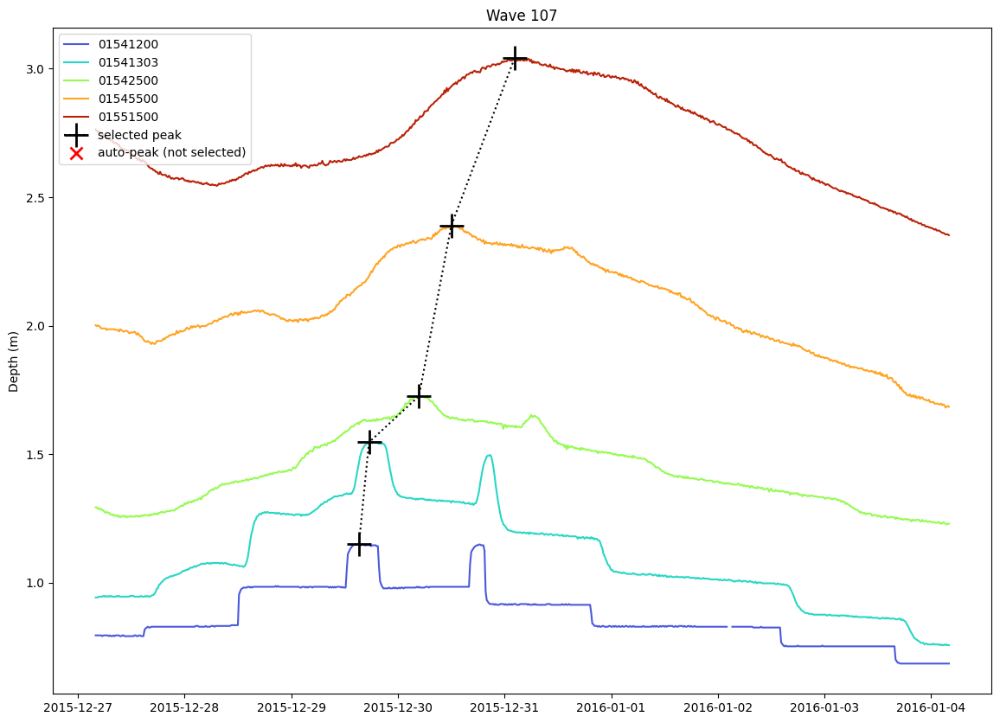

(01541200   2015-12-29 15:15:00+00:00
 01541303   2015-12-29 17:30:00+00:00
 01542500   2015-12-30 04:45:00+00:00
 01545500   2015-12-30 12:00:00+00:00
 01551500   2015-12-31 02:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.151579
 01541303    1.546084
 01542500    1.726276
 01545500    2.388662
 01551500    3.040999
 dtype: float64)

In [119]:
wave = 107
adjustment = pd.Timedelta('1182 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-12-30 18:15:00+00:00',
          #'01541303':'2015-12-30 20:45:00+00:00',
          #'01542500':'2015-12-31 06:00:00+00:00',
          #'01545500':'2015-12-31 14:30:00+00:00',
          #'01551500':'2016-01-01 2:00:00+00:00', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

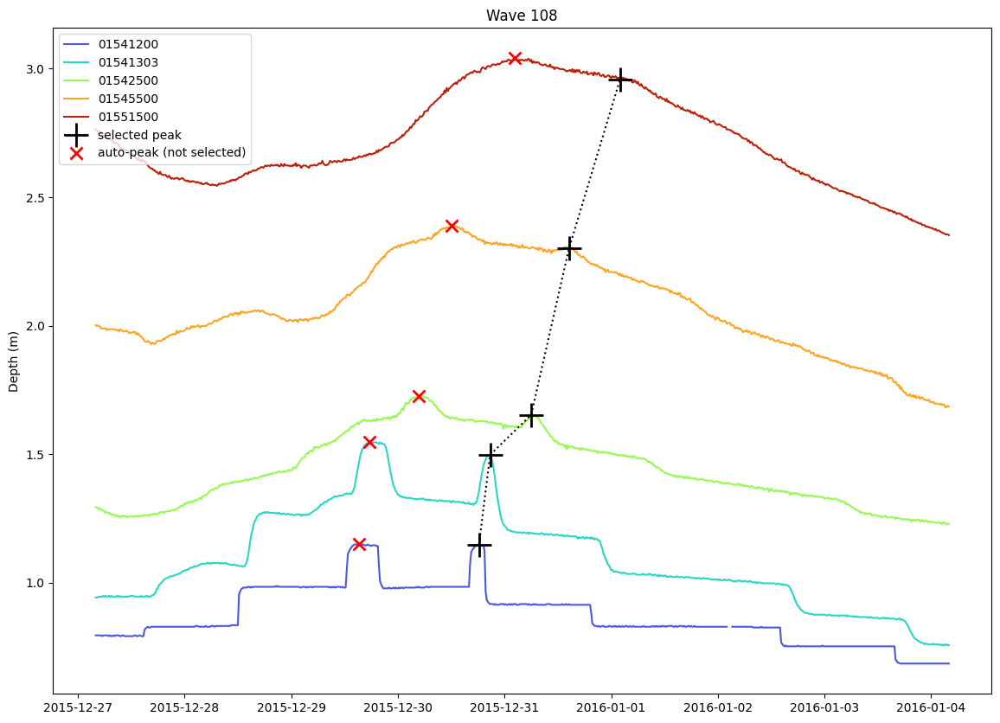

(01541200   2015-12-30 18:15:00+00:00
 01541303   2015-12-30 20:45:00+00:00
 01542500   2015-12-31 06:00:00+00:00
 01545500   2015-12-31 14:30:00+00:00
 01551500   2016-01-01 02:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.148531
 01541303    1.497316
 01542500    1.653124
 01545500    2.300270
 01551500    2.958703
 dtype: float64)

In [120]:
wave = 108
adjustment = pd.Timedelta('1182 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2015-12-30 18:15:00+00:00',
          '01541303':'2015-12-30 20:45:00+00:00',
          '01542500':'2015-12-31 06:00:00+00:00',
          '01545500':'2015-12-31 14:30:00+00:00',
          '01551500':'2016-01-01 2:00:00+00:00', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

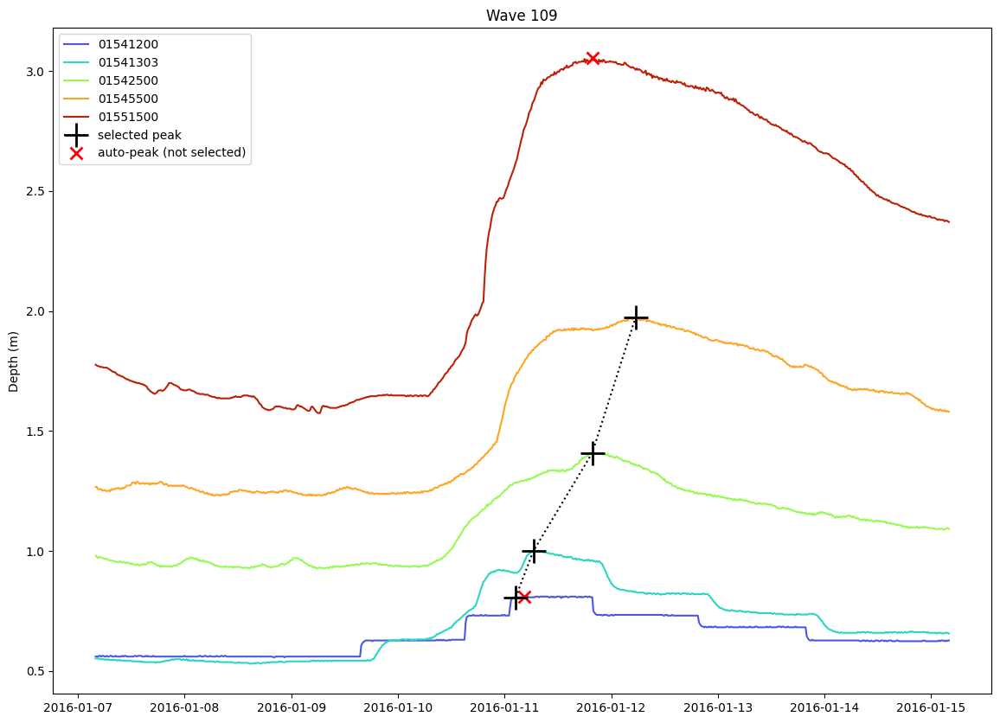

(01541200   2016-01-11 02:30:00+00:00
 01541303   2016-01-11 06:30:00+00:00
 01542500   2016-01-11 19:45:00+00:00
 01545500   2016-01-12 05:30:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.807155
 01541303    1.000492
 01542500    1.409284
 01545500    1.974134
 01551500         NaN
 dtype: float64)

In [121]:
wave = 109
adjustment = pd.Timedelta('1193 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-01-11 02:30:00+00:00',
          #'01541303':'2015-11-19 21:15:00+00:00',
          #'01542500':'2015-11-20 09:15:00+00:00',
          #'01545500':'2015-12-31 14:30:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

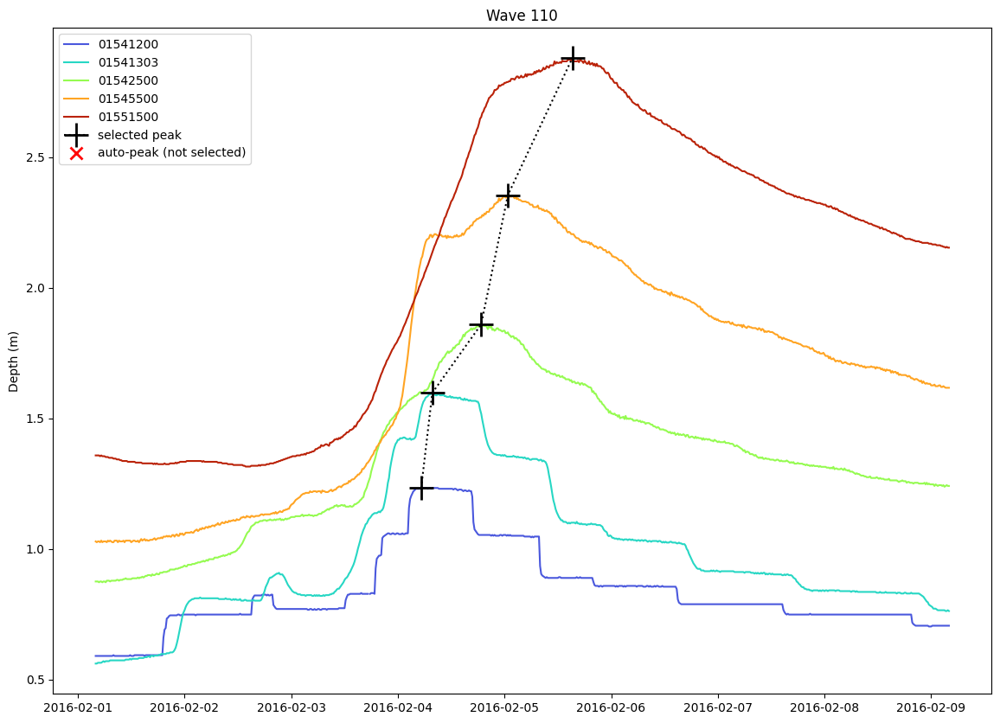

(01541200   2016-02-04 05:15:00+00:00
 01541303   2016-02-04 07:45:00+00:00
 01542500   2016-02-04 18:45:00+00:00
 01545500   2016-02-05 00:45:00+00:00
 01551500   2016-02-05 15:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.233875
 01541303    1.597900
 01542500    1.860388
 01545500    2.355134
 01551500    2.879455
 dtype: float64)

In [122]:
wave = 110
adjustment = pd.Timedelta('1218 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2015-12-24 16:00:00+00:00',
          #'01541303':'2015-11-19 21:15:00+00:00',
          #'01542500':'2015-11-20 09:15:00+00:00',
          #'01545500':'2015-11-21 21:00:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

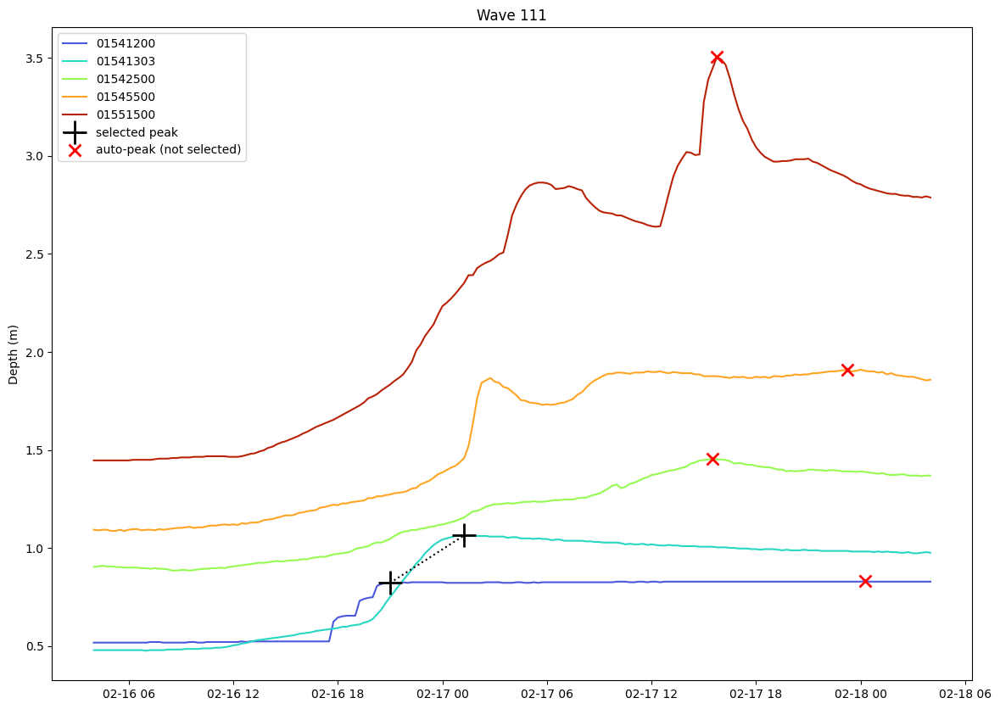

(01541200   2016-02-16 21:00:00+00:00
 01541303   2016-02-17 01:15:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.822395
 01541303    1.064500
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [123]:
wave = 111
adjustment = pd.Timedelta('1233 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-02-16 21:00:00+00:00',
          #'01541303':'2015-11-19 21:15:00+00:00',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

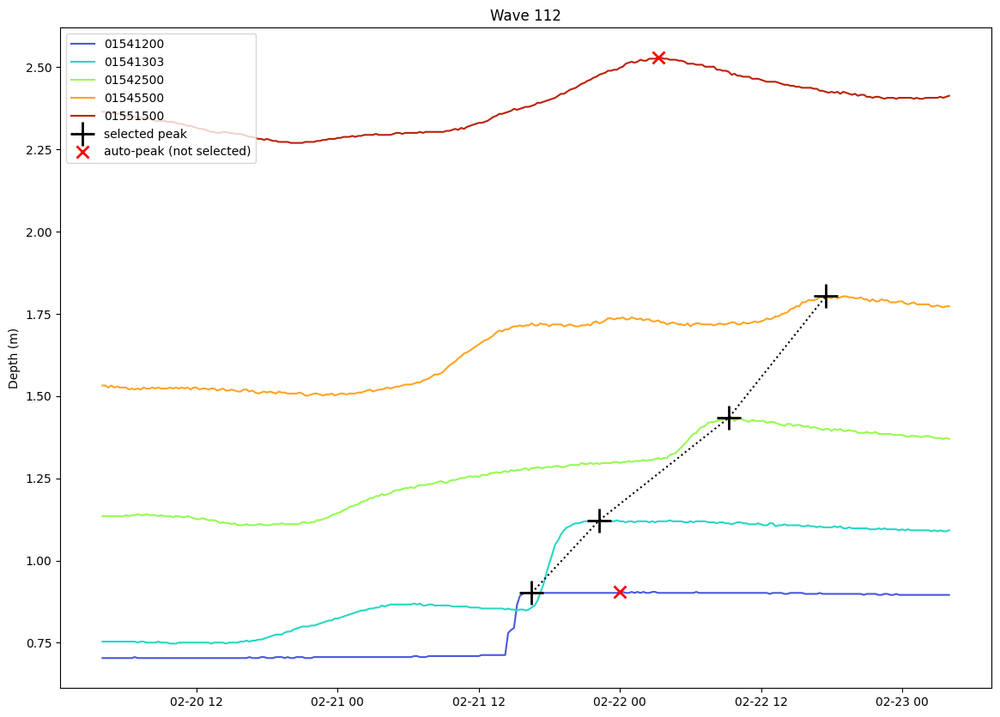

(01541200   2016-02-21 16:30:00+00:00
 01541303   2016-02-21 22:15:00+00:00
 01542500   2016-02-22 09:15:00+00:00
 01545500   2016-02-22 17:30:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.901643
 01541303    1.122412
 01542500    1.433668
 01545500    1.803446
 01551500         NaN
 dtype: float64)

In [124]:
wave = 112
adjustment = pd.Timedelta('1237 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-02-21 16:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

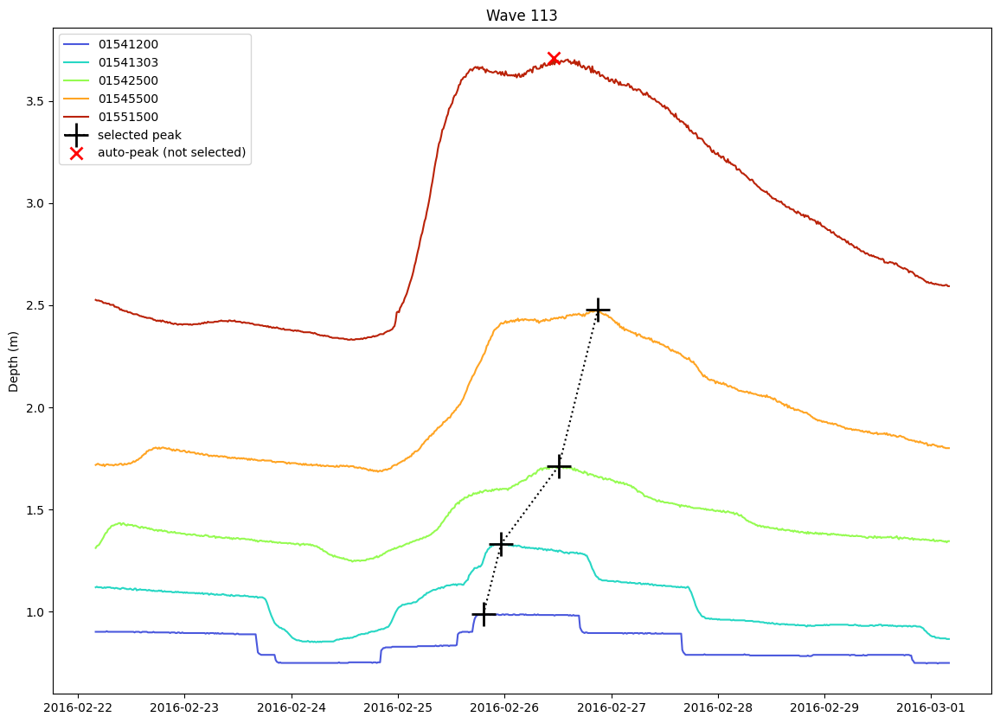

(01541200   2016-02-25 19:15:00+00:00
 01541303   2016-02-25 23:15:00+00:00
 01542500   2016-02-26 12:15:00+00:00
 01545500   2016-02-26 21:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.986987
 01541303    1.332724
 01542500    1.714084
 01545500    2.477054
 01551500         NaN
 dtype: float64)

In [125]:
wave = 113
adjustment = pd.Timedelta('1239 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2016-02-21 16:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

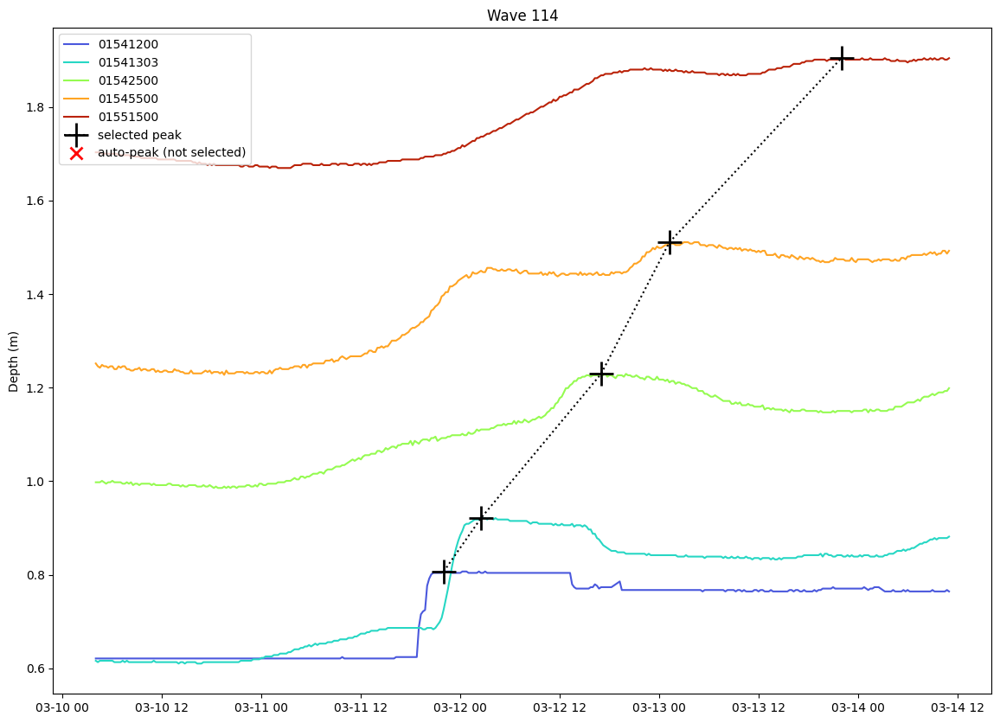

(01541200   2016-03-11 22:00:00+00:00
 01541303   2016-03-12 02:30:00+00:00
 01542500   2016-03-12 17:00:00+00:00
 01545500   2016-03-13 01:15:00+00:00
 01551500   2016-03-13 22:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.807155
 01541303    0.921244
 01542500    1.229452
 01545500    1.510838
 01551500    1.904095
 dtype: float64)

In [126]:
wave = 114
adjustment = pd.Timedelta('1256 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2016-02-21 16:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '4.3 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

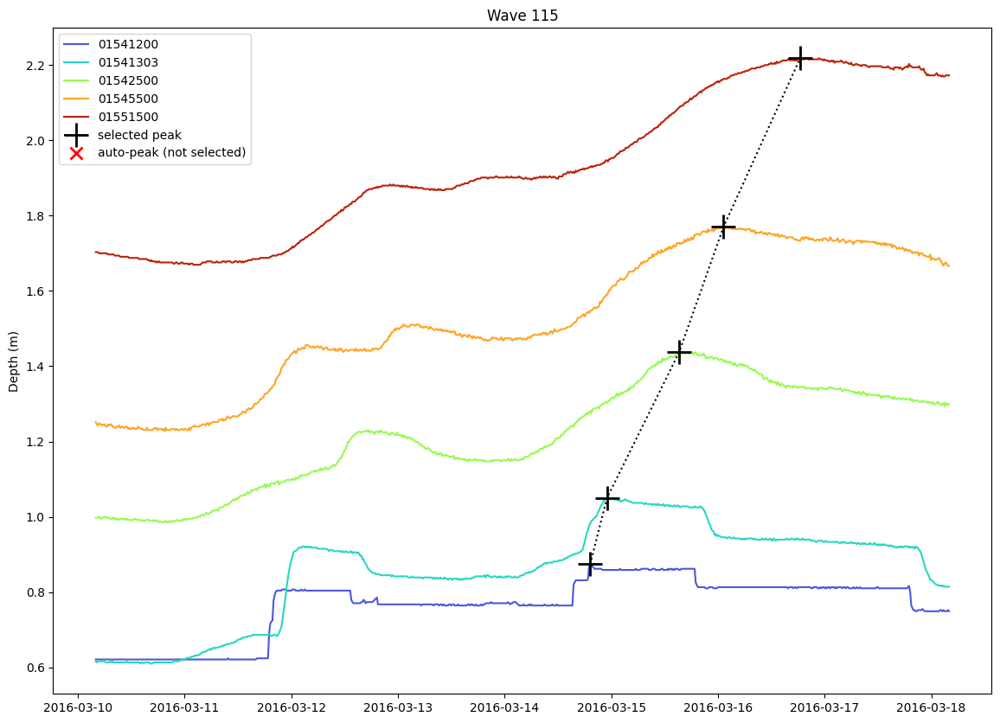

(01541200   2016-03-14 19:15:00+00:00
 01541303   2016-03-14 23:00:00+00:00
 01542500   2016-03-15 15:15:00+00:00
 01545500   2016-03-16 01:15:00+00:00
 01551500   2016-03-16 18:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.874211
 01541303    1.049260
 01542500    1.436716
 01545500    1.769918
 01551500    2.218039
 dtype: float64)

In [127]:
wave = 115
adjustment = pd.Timedelta('1256 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2016-02-21 16:30:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

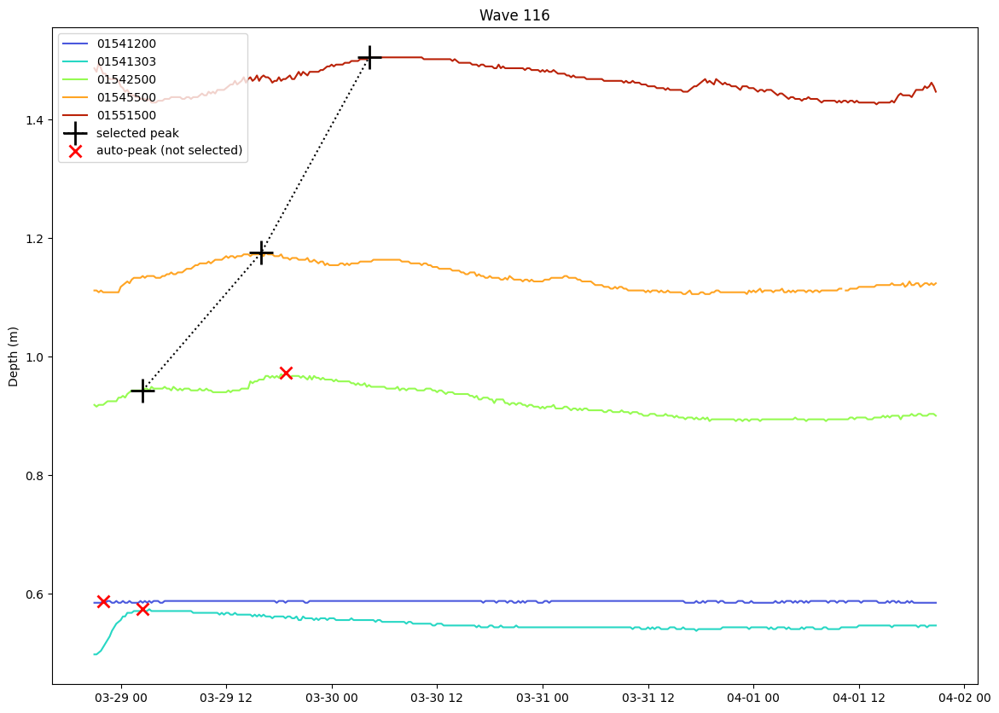

(01541200                         NaT
 01541303                         NaT
 01542500   2016-03-29 02:30:00+00:00
 01545500   2016-03-29 16:00:00+00:00
 01551500   2016-03-30 04:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.942940
 01545500    1.175558
 01551500    1.504807
 dtype: float64)

In [128]:
wave = 116
adjustment = pd.Timedelta('1274.7 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'2016-03-29 02:30:00+00:00',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '4 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

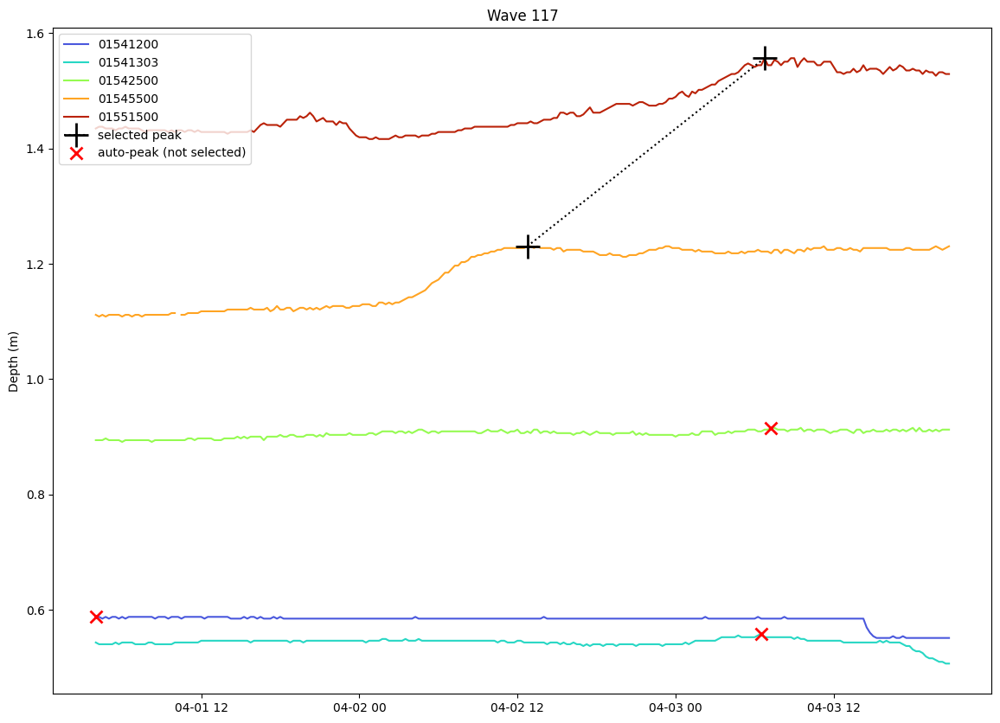

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2016-04-02 12:45:00+00:00
 01551500   2016-04-03 06:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.230422
 01551500    1.556623
 dtype: float64)

In [129]:
wave = 117
adjustment = pd.Timedelta('1278 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '2.7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

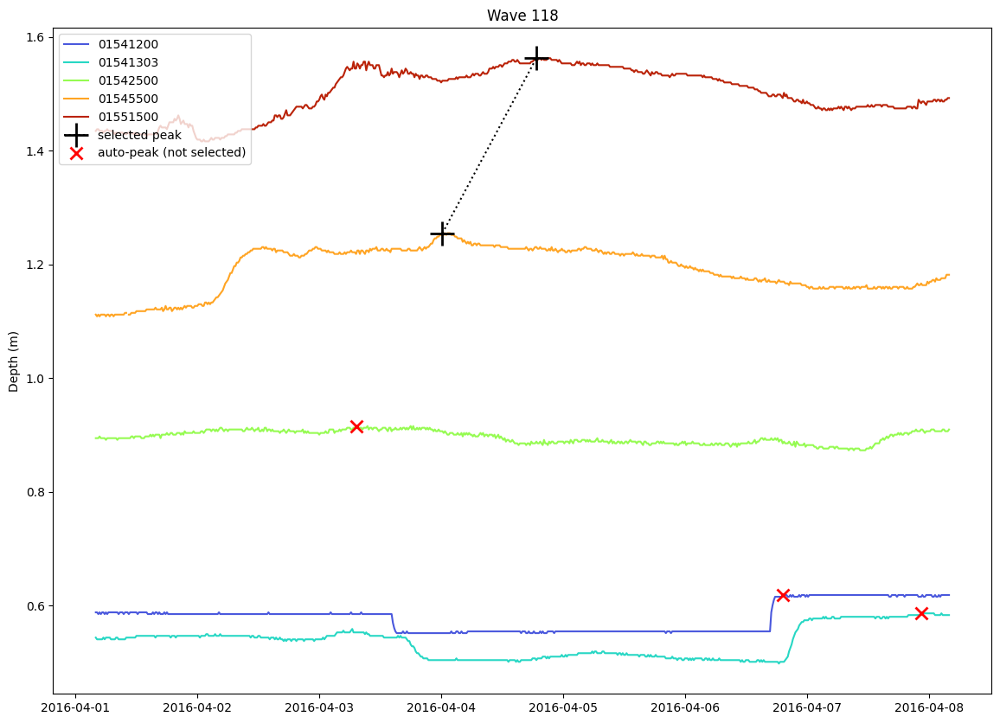

(01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2016-04-04 00:15:00+00:00
 01551500   2016-04-04 18:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    1.254806
 01551500    1.562719
 dtype: float64)

In [130]:
wave = 118
adjustment = pd.Timedelta('1278 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '7 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

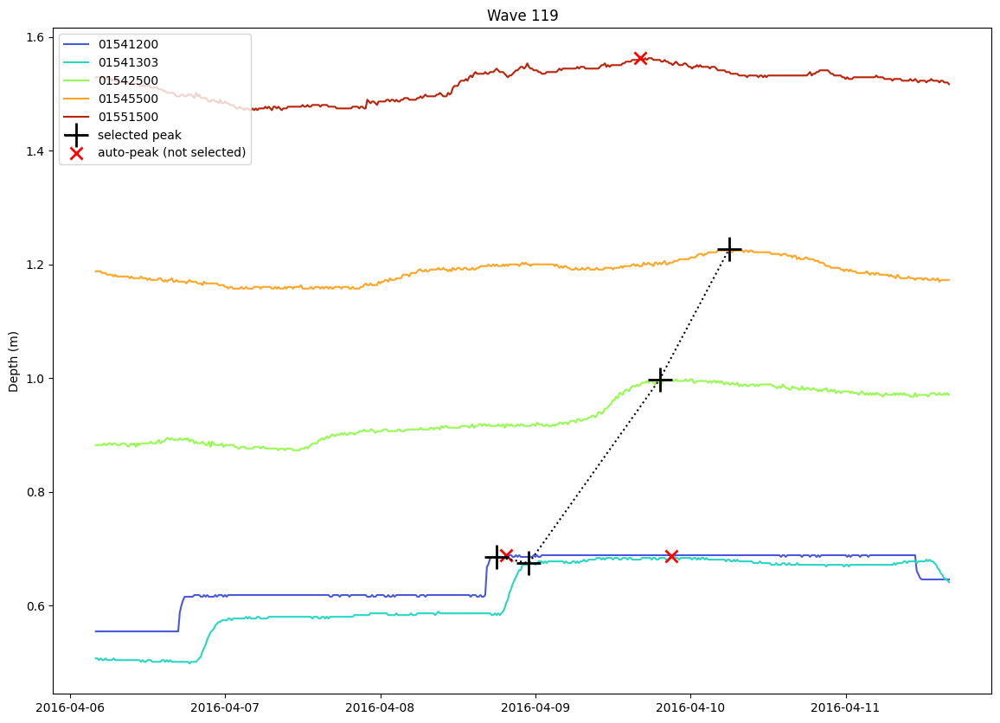

(01541200   2016-04-08 18:00:00+00:00
 01541303   2016-04-08 23:00:00+00:00
 01542500   2016-04-09 19:15:00+00:00
 01545500   2016-04-10 06:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.685235
 01541303    0.674356
 01542500    0.997804
 01545500    1.227374
 01551500         NaN
 dtype: float64)

In [131]:
wave = 119
adjustment = pd.Timedelta('1283 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-04-08 18:00:00+00:00',
          '01541303':'2016-04-08 23:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '5.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

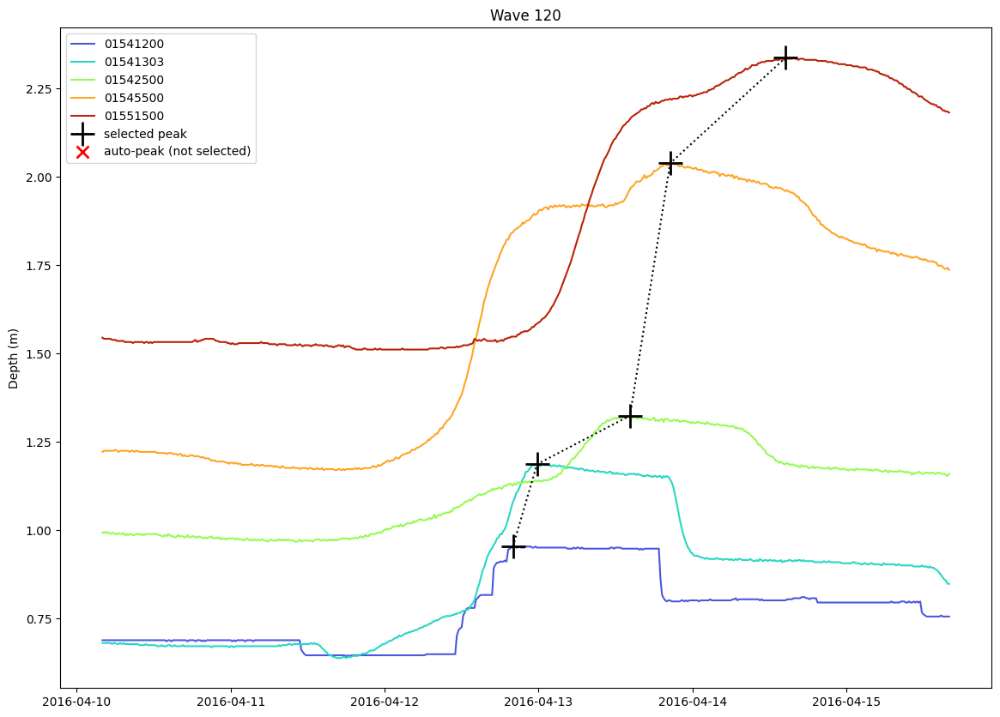

(01541200   2016-04-12 20:00:00+00:00
 01541303   2016-04-12 23:45:00+00:00
 01542500   2016-04-13 14:15:00+00:00
 01545500   2016-04-13 20:30:00+00:00
 01551500   2016-04-14 14:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.953459
 01541303    1.186420
 01542500    1.323940
 01545500    2.038142
 01551500    2.336911
 dtype: float64)

In [132]:
wave = 120
adjustment = pd.Timedelta('1287 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2016-04-08 18:00:00+00:00',
          #'01541303':'2016-04-08 23:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '5.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

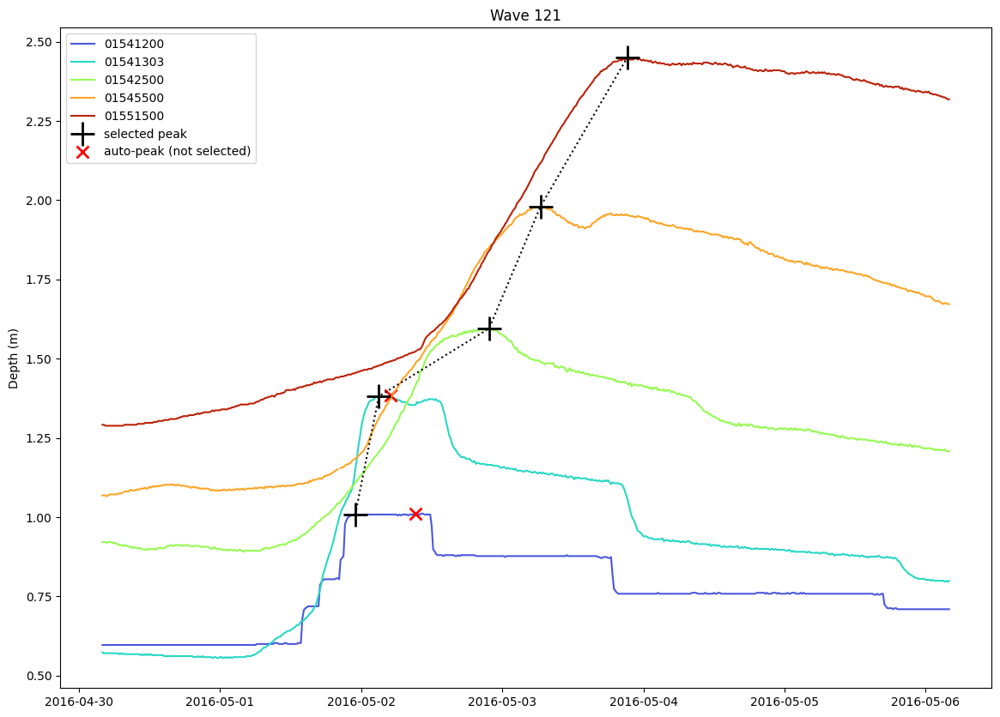

(01541200   2016-05-01 23:00:00+00:00
 01541303   2016-05-02 03:00:00+00:00
 01542500   2016-05-02 21:45:00+00:00
 01545500   2016-05-03 06:30:00+00:00
 01551500   2016-05-03 21:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    1.008323
 01541303    1.381492
 01542500    1.595212
 01545500    1.980230
 01551500    2.449687
 dtype: float64)

In [133]:
wave = 121
adjustment = pd.Timedelta('1307 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-05-01 23:00:00+00:00',
          '01541303':'2016-05-02 03:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'skip',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '6 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

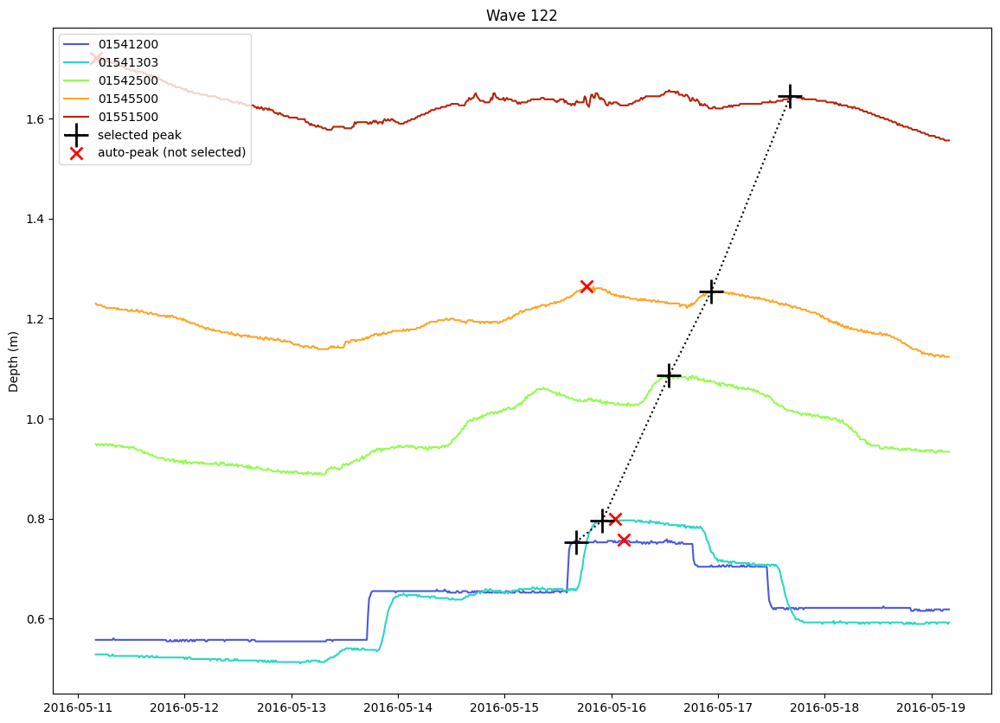

(01541200   2016-05-15 16:00:00+00:00
 01541303   2016-05-15 22:00:00+00:00
 01542500   2016-05-16 13:00:00+00:00
 01545500   2016-05-16 22:30:00+00:00
 01551500   2016-05-17 16:15:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.752291
 01541303    0.796276
 01542500    1.086196
 01545500    1.254806
 01551500    1.645015
 dtype: float64)

In [134]:
wave = 122
adjustment = pd.Timedelta('1318 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-05-15 16:00:00+00:00',
          '01541303':'2016-05-15 22:00:00+00:00',
          #'01542500':'skip',
          '01545500':'2016-05-16 22:30:00+00:00',
          '01551500':'2016-05-17 16:15:00+00:00', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

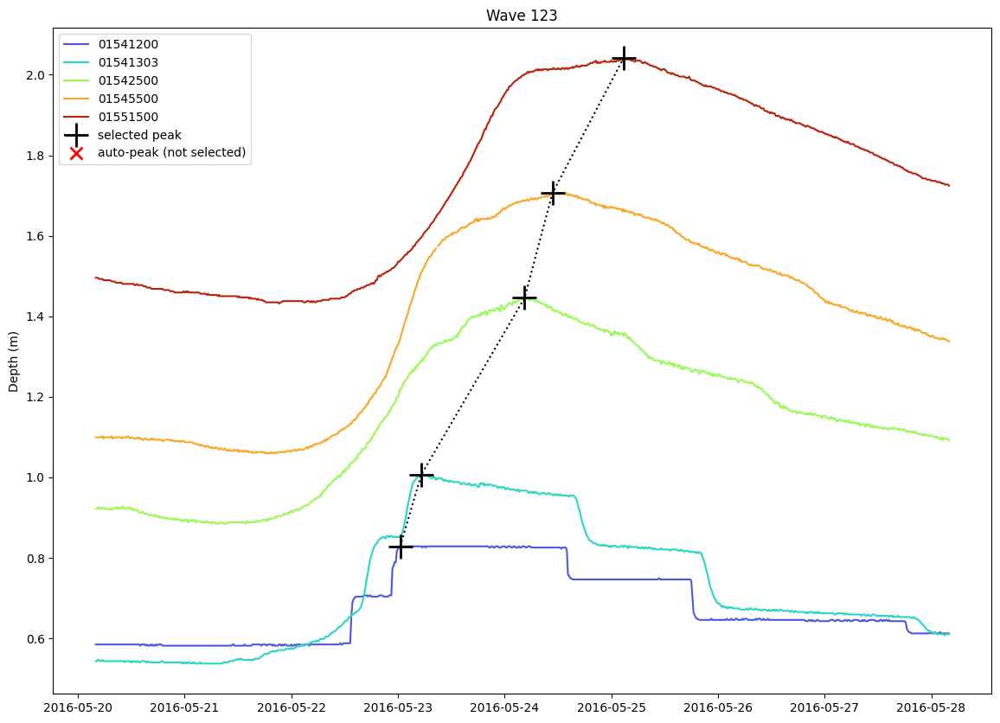

(01541200   2016-05-23 00:30:00+00:00
 01541303   2016-05-23 05:15:00+00:00
 01542500   2016-05-24 04:30:00+00:00
 01545500   2016-05-24 10:45:00+00:00
 01551500   2016-05-25 02:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.828491
 01541303    1.006588
 01542500    1.445860
 01545500    1.705910
 01551500    2.041255
 dtype: float64)

In [135]:
wave = 123
adjustment = pd.Timedelta('1327 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'2016-05-15 16:00:00+00:00',
          #'01541303':'2016-05-15 22:00:00+00:00',
          #'01542500':'skip',
          #'01545500':'2016-05-16 22:30:00+00:00',
          #'01551500':'2016-05-17 16:15:00+00:00', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

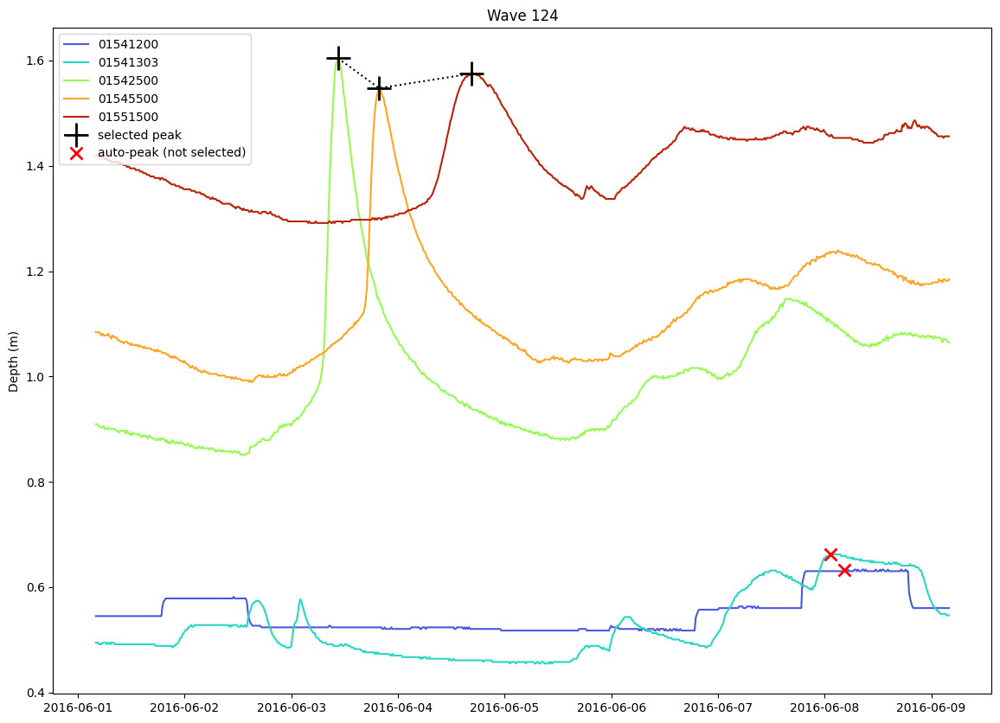

(01541200                         NaT
 01541303                         NaT
 01542500   2016-06-03 10:30:00+00:00
 01545500   2016-06-03 19:45:00+00:00
 01551500   2016-06-04 16:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.604356
 01545500    1.547414
 01551500    1.574911
 dtype: float64)

In [136]:
wave = 124
adjustment = pd.Timedelta('1339 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500':'2016-05-16 22:30:00+00:00',
          #'01551500':'2016-05-17 16:15:00+00:00', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

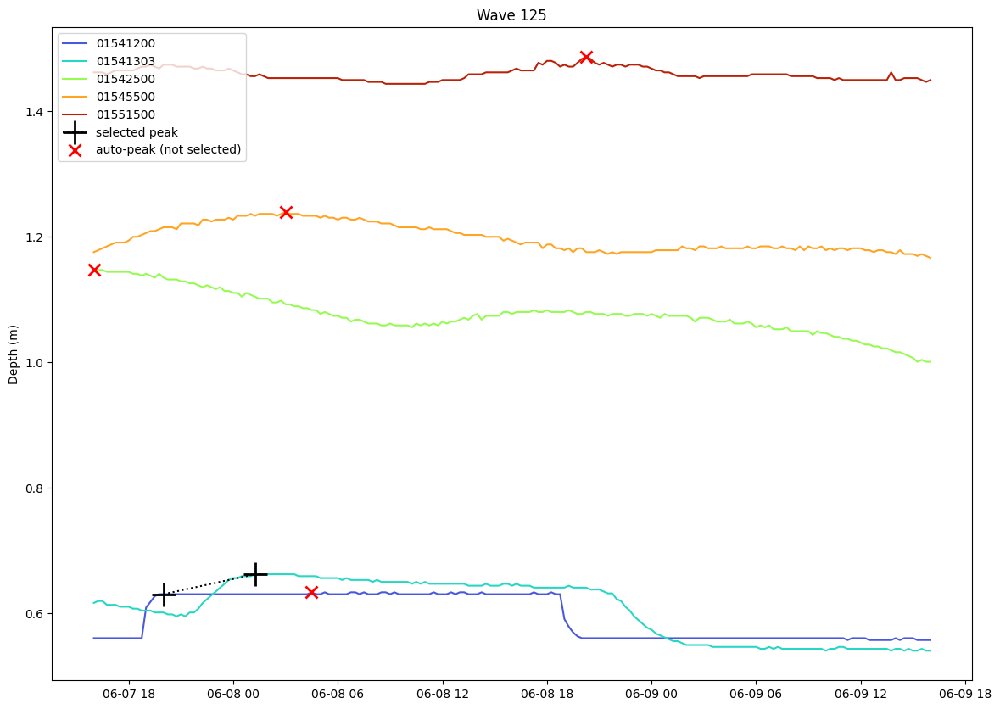

(01541200   2016-06-07 20:00:00+00:00
 01541303   2016-06-08 01:15:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.630371
 01541303    0.662164
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [137]:
wave = 125
adjustment = pd.Timedelta('1345.5 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-06-07 20:00:00+00:00',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '2 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

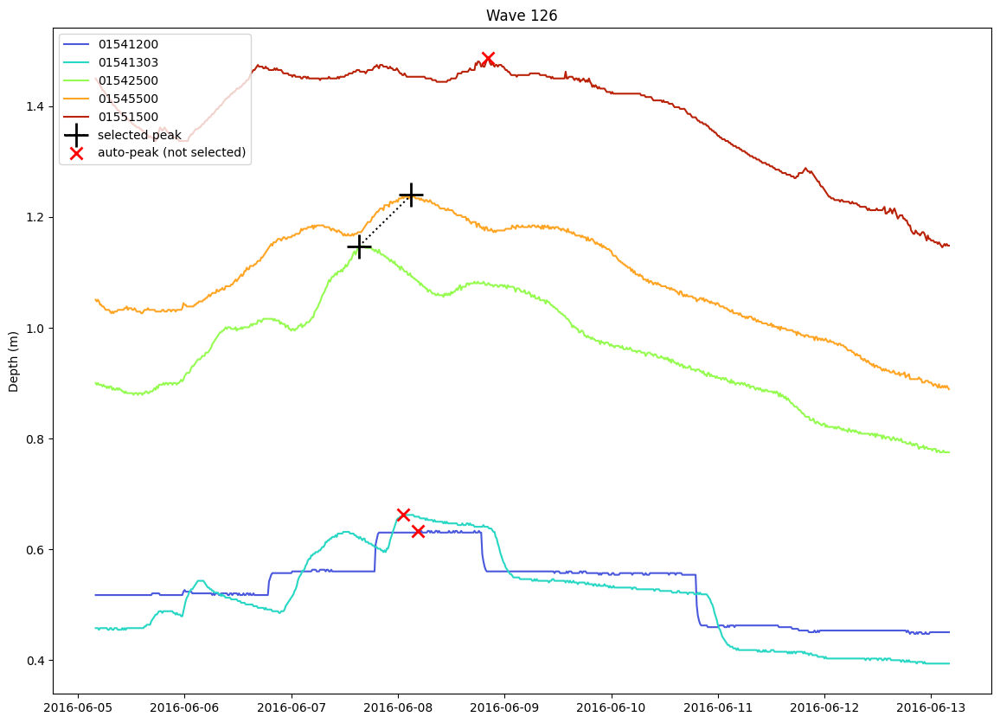

(01541200                         NaT
 01541303                         NaT
 01542500   2016-06-07 15:15:00+00:00
 01545500   2016-06-08 03:00:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    1.147156
 01545500    1.239566
 01551500         NaN
 dtype: float64)

In [138]:
wave = 126
adjustment = pd.Timedelta('1343 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500':'2016-05-16 22:30:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

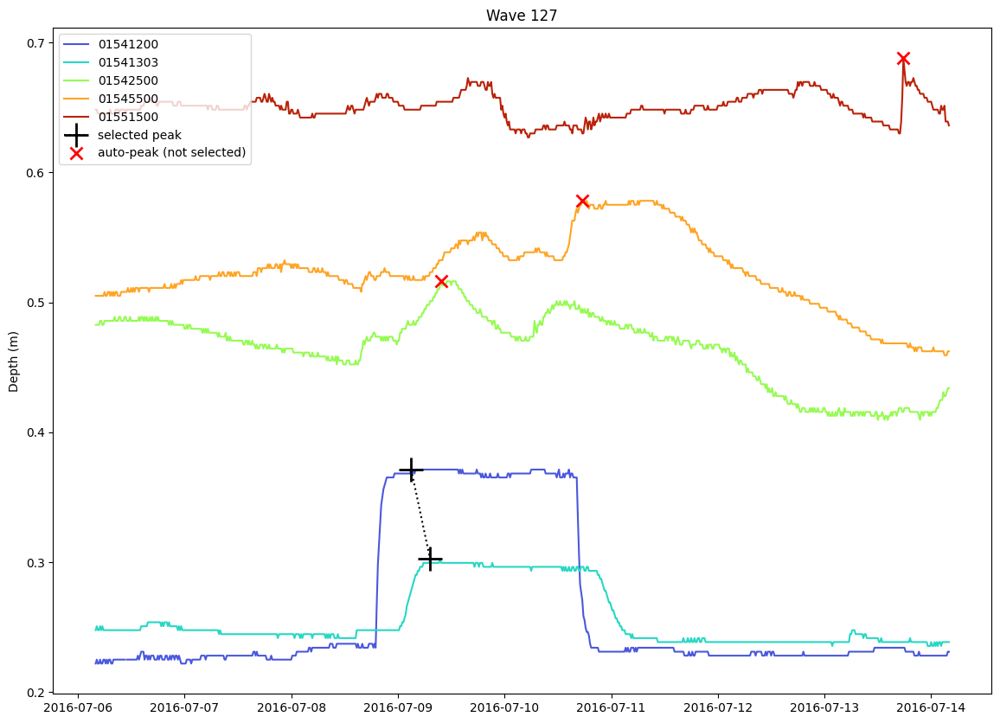

(01541200   2016-07-09 03:00:00+00:00
 01541303   2016-07-09 07:15:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.371291
 01541303    0.302500
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [139]:
wave = 127
adjustment = pd.Timedelta('1374 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

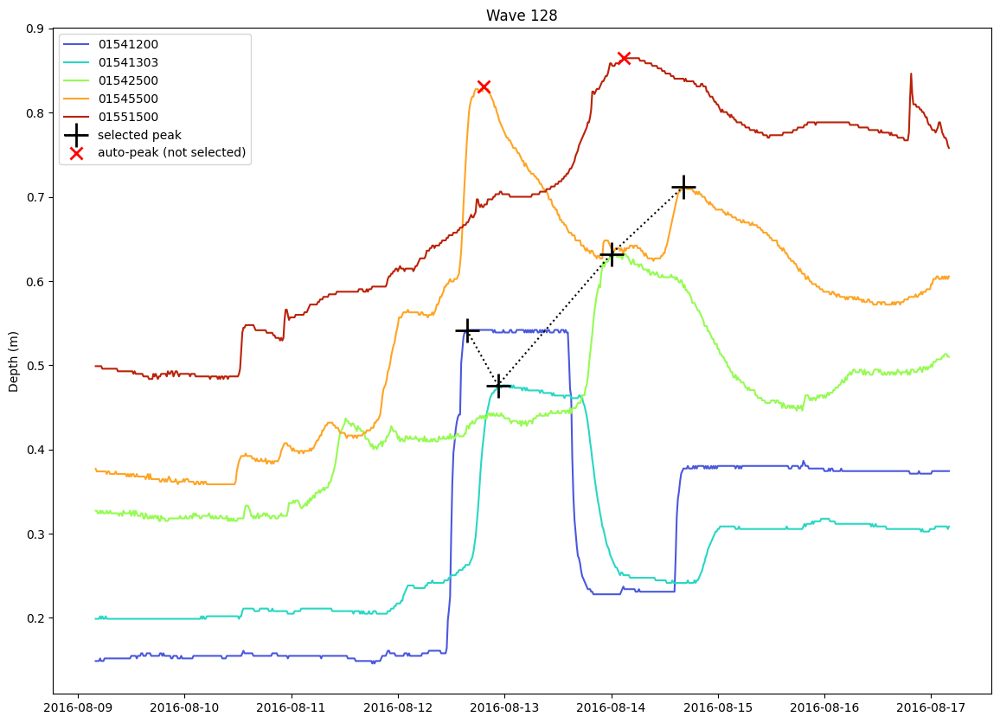

(01541200   2016-08-12 15:30:00+00:00
 01541303   2016-08-12 22:30:00+00:00
 01542500   2016-08-14 00:00:00+00:00
 01545500   2016-08-14 16:15:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.541979
 01541303    0.476236
 01542500    0.632044
 01545500    0.712262
 01551500         NaN
 dtype: float64)

In [140]:
wave = 128
adjustment = pd.Timedelta('1408 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          '01545500':'2016-08-14 16:15:00+00:00',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

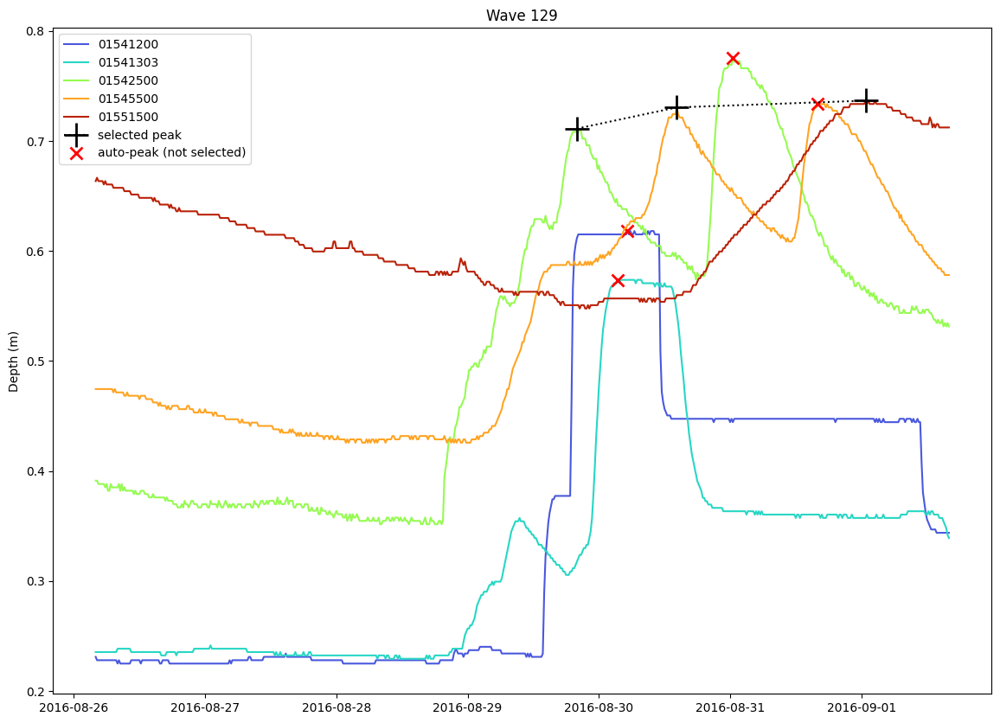

(01541200                         NaT
 01541303                         NaT
 01542500   2016-08-29 20:00:00+00:00
 01545500   2016-08-30 14:15:00+00:00
 01551500   2016-09-01 00:45:00+00:00
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.711292
 01545500    0.730550
 01551500    0.736711
 dtype: float64)

In [141]:
wave = 129
adjustment = pd.Timedelta('1425 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          '01542500':'2016-08-29 20:00:00+00:00',
          '01545500':'2016-08-30 14:15:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '6.5 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

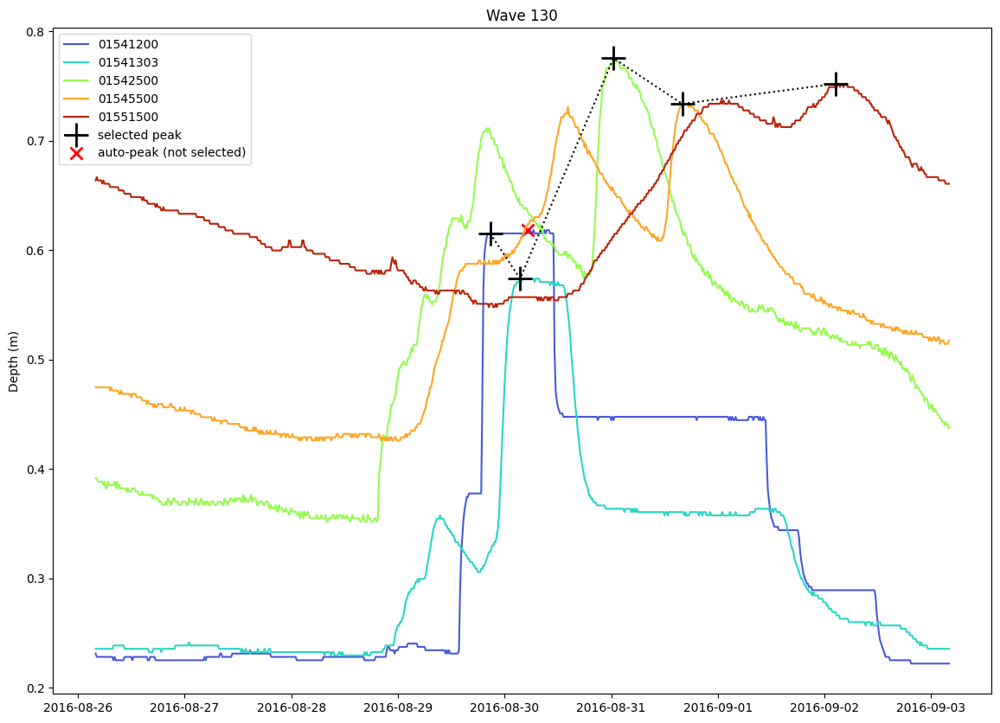

(01541200   2016-08-29 20:45:00+00:00
 01541303   2016-08-30 03:30:00+00:00
 01542500   2016-08-31 00:30:00+00:00
 01545500   2016-08-31 16:00:00+00:00
 01551500   2016-09-02 02:30:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.615131
 01541303    0.573772
 01542500    0.775300
 01545500    0.733598
 01551500    0.751951
 dtype: float64)

In [142]:
wave = 130
adjustment = pd.Timedelta('1425 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-08-29 20:45:00+00:00',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'2016-08-14 16:15:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

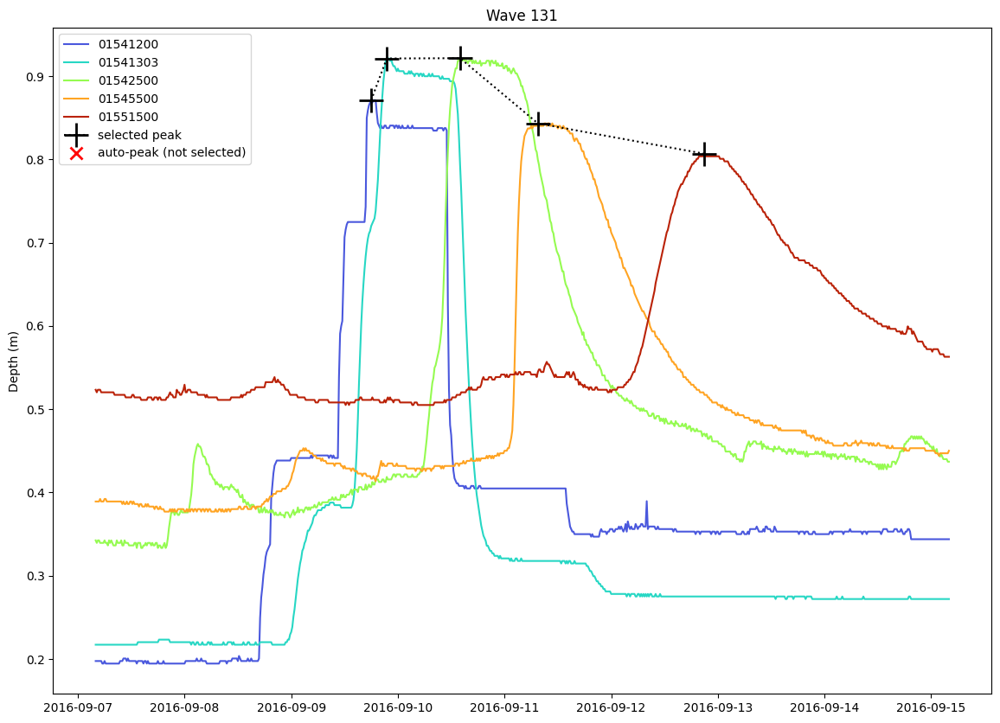

(01541200   2016-09-09 18:00:00+00:00
 01541303   2016-09-09 21:30:00+00:00
 01542500   2016-09-10 14:00:00+00:00
 01545500   2016-09-11 07:30:00+00:00
 01551500   2016-09-12 21:00:00+00:00
 dtype: datetime64[ns, UTC],
 01541200    0.871163
 01541303    0.921244
 01542500    0.921604
 01545500    0.843326
 01551500    0.806815
 dtype: float64)

In [143]:
wave = 131
adjustment = pd.Timedelta('1437 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          #'01541200':'skip',
          #'01541303':'skip',
          #'01542500':'skip',
          #'01545500':'2016-08-14 16:15:00+00:00',
          #'01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

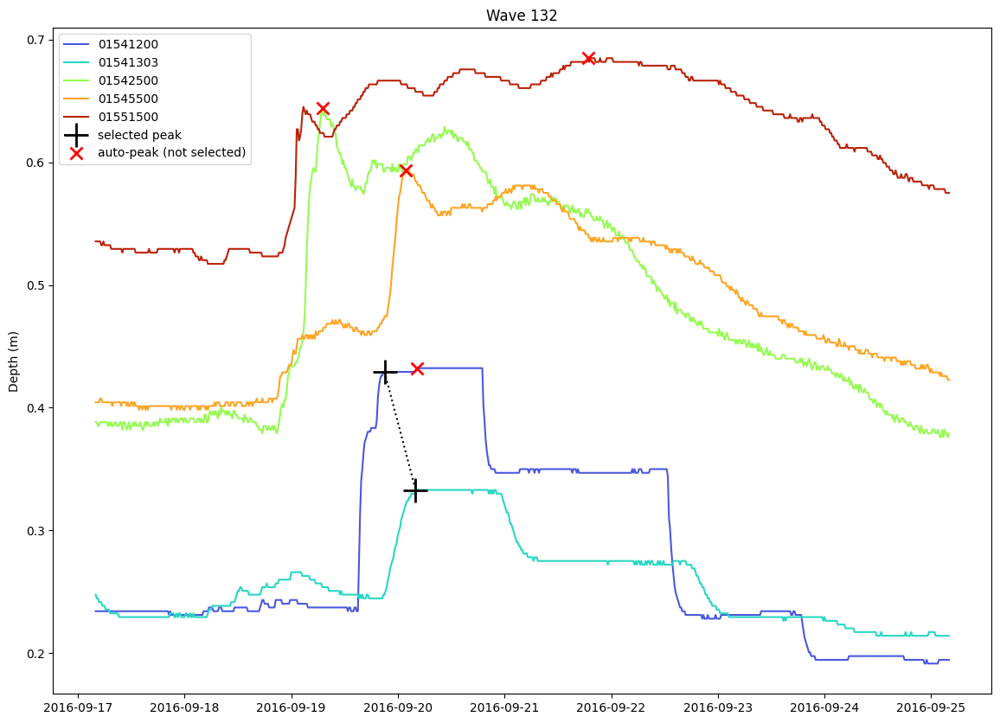

(01541200   2016-09-19 21:00:00+00:00
 01541303   2016-09-20 04:00:00+00:00
 01542500                         NaT
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200    0.429203
 01541303    0.332980
 01542500         NaN
 01545500         NaN
 01551500         NaN
 dtype: float64)

In [144]:
wave = 132
adjustment = pd.Timedelta('1447 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'2016-09-19 21:00:00+00:00',
          #'01541303':'skip',
          '01542500':'skip',
          '01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

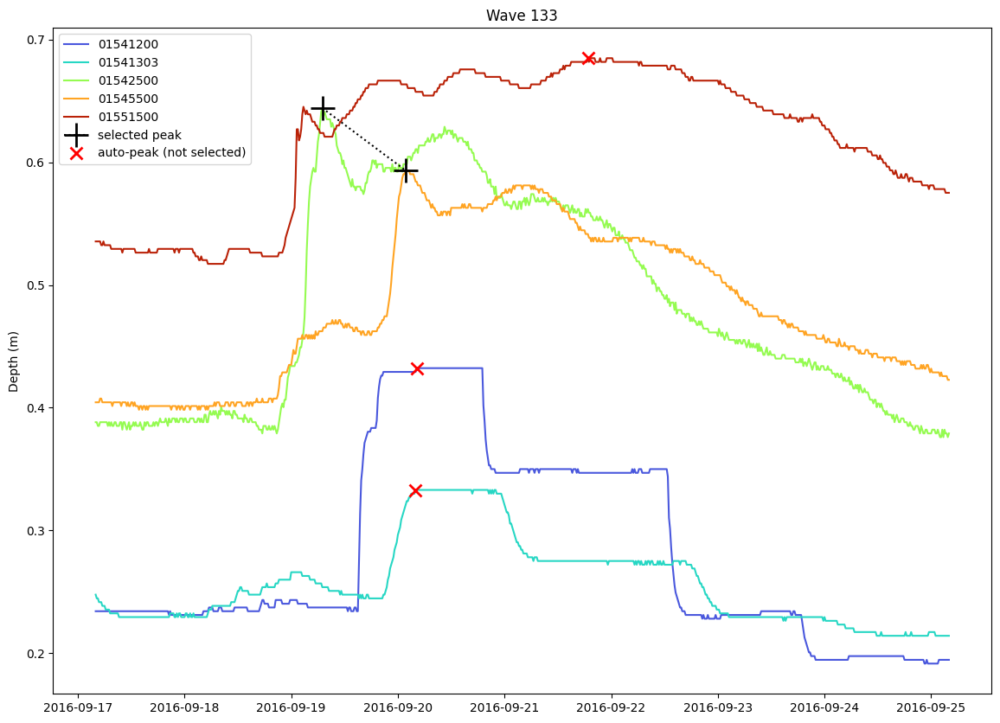

(01541200                         NaT
 01541303                         NaT
 01542500   2016-09-19 07:00:00+00:00
 01545500   2016-09-20 01:45:00+00:00
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 01541200         NaN
 01541303         NaN
 01542500    0.644236
 01545500    0.593390
 01551500         NaN
 dtype: float64)

In [145]:
wave = 133
adjustment = pd.Timedelta('1447 days') # Max is 1462 days!
# Manually choose the peak for sites, if needed
# Options are:
#     - #    : Comment out if you want to use auto-select of max
#     - 'skip'  :  don't collect for this station
#     - '2013-04-01 16:30:00+00:00'
manual = {
          '01541200':'skip',
          '01541303':'skip',
          #'01542500':'skip',
          #'01545500':'skip',
          '01551500':'skip', 
         }

start = time0 + adjustment
period = '8 days' # Size of search window; also used for plot
times, depth = analysis_functions.track_peak(water_depth, start, period, manual, 
                                             title_text=f'Wave {wave}', 
                                             legend_loc='upper left', 
                                             colors=site_colors,
                                             ylabel='Depth (m)'
                                             )
data_peak_times[wave] = times
data_peak_depth[wave] = depth
# Display the latest addition to the dict
times, depth

# All data Collection is Above This Point

In [146]:
data_peak_times

{0: 01541200   2012-10-30 18:00:00+00:00
 01541303   2012-10-30 21:15:00+00:00
 01542500   2012-10-31 10:00:00+00:00
 01545500   2012-10-31 15:45:00+00:00
 01551500   2012-11-01 02:00:00+00:00
 dtype: datetime64[ns, UTC],
 1: 01541200   2012-12-21 20:45:00+00:00
 01541303   2012-12-21 22:30:00+00:00
 01542500   2012-12-22 11:15:00+00:00
 01545500                         NaT
 01551500                         NaT
 dtype: datetime64[ns, UTC],
 2: 01541200   2013-01-14 13:00:00+00:00
 01541303   2013-01-14 16:45:00+00:00
 01542500   2013-01-15 03:15:00+00:00
 01545500   2013-01-15 08:15:00+00:00
 01551500   2013-01-15 20:00:00+00:00
 dtype: datetime64[ns, UTC],
 3: 01541200                         NaT
 01541303                         NaT
 01542500                         NaT
 01545500   2013-01-31 21:45:00+00:00
 01551500   2013-02-01 08:45:00+00:00
 dtype: datetime64[ns, UTC],
 4: 01541200   2013-02-28 12:45:00+00:00
 01541303   2013-02-28 19:15:00+00:00
 01542500   2013-03-01 11:00:00+0

In [147]:
data_peak_depth

{0: 01541200    1.614875
 01541303    1.939276
 01542500    2.055460
 01545500    2.492294
 01551500    3.391519
 dtype: float64,
 1: 01541200    1.291787
 01541303    1.674100
 01542500    1.787236
 01545500         NaN
 01551500         NaN
 dtype: float64,
 2: 01541200    1.288739
 01541303    1.771636
 01542500    1.960972
 01545500    2.885486
 01551500    3.751183
 dtype: float64,
 3: 01541200         NaN
 01541303         NaN
 01542500         NaN
 01545500    3.937046
 01551500    5.430631
 dtype: float64,
 4: 01541200    0.807155
 01541303    0.808468
 01542500    1.077052
 01545500    1.212134
 01551500         NaN
 dtype: float64,
 5: 01541200    0.959555
 01541303    1.226044
 01542500    1.522060
 01545500    2.196638
 01551500         NaN
 dtype: float64,
 6: 01541200    0.880307
 01541303    1.006588
 01542500    1.363564
 01545500    1.730294
 01551500    2.208895
 dtype: float64,
 7: 01541200         NaN
 01541303         NaN
 01542500    1.854292
 01545500    2.794046

In [148]:
print(data_peak_times.keys())
print(len(data_peak_times.keys()))

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133])
134


## Data Organization
There are two sets of data:
- data measured at each station, including the depth of the wave and the time of the peak.
- data calculated for each reach, including the lag time and celerity.

The datasets are also organized in two ways, until I decide which is more convenient:
- record format: a long list that can be selected by two keys, such as the wave# and reach, giving you the celerity & lag time
- table format: a table for each variable, like celerity and lag time, with each row a wave, and each column a reach.

The reach calculations:
- lag_times = downstream time - upstream time
- celerity = reach length / lag time

In [149]:
# Station data in record format
v1 = pd.concat(data_peak_times)
print(f'v1 shape: {v1.shape} (includes NaNs); 134 waves x 5 stations = {134*5}\n')

v2 = v1.dropna()
print(f'v2 shape: {v2.shape}-- {v1.shape[0]-v2.shape[0]} NaNs dropped. 670-185 = 485 observations at stations.\n')

v3 = v2.reset_index()
v3 = v3.rename(columns={'level_1':'site', 'level_0':'wave', 0:'time'})
print(f'v3 shape: {v3.shape}')
print(f"v3.columns: {v3.columns}\n")

v4 = v3.copy()
v4['q'] = v4.apply(lambda x: (discharge.loc[x['time'], x['site']]), axis=1)
v4['depth'] = v4.apply(lambda x: (water_depth.loc[x['time'], x['site']]), axis=1)
print(f'v4 shape: {v4.shape}')
print(f"v4.columns: {v4.columns}")
print(f"v4['q'] NaNs: {v4['q'].isna().sum()}")
print(f"v4['depth'] NaNs: {v4['depth'].isna().sum()}")
print(f"Some of the station observations have depths, but not discharges.\n")
validation_stations = v4
validation_stations.to_parquet('validation_stations.parquet', compression='gzip')
validation_stations

v1 shape: (670,) (includes NaNs); 134 waves x 5 stations = 670

v2 shape: (485,)-- 185 NaNs dropped. 670-185 = 485 observations at stations.

v3 shape: (485, 3)
v3.columns: Index(['wave', 'site', 'time'], dtype='object')

v4 shape: (485, 5)
v4.columns: Index(['wave', 'site', 'time', 'q', 'depth'], dtype='object')
v4['q'] NaNs: 8
v4['depth'] NaNs: 0
Some of the station observations have depths, but not discharges.



,wave,site,time,q,depth
0,0,01541200,2012-10-30 18:00:00+00:00,120.912736,1.614875
1,0,01541303,2012-10-30 21:15:00+00:00,125.726592,1.939276
2,0,01542500,2012-10-31 10:00:00+00:00,265.611584,2.055460
3,0,01545500,2012-10-31 15:45:00+00:00,470.058880,2.492294
4,0,01551500,2012-11-01 02:00:00+00:00,843.840640,3.391519
...,...,...,...,...,...
480,131,01551500,2016-09-12 21:00:00+00:00,51.253408,0.806815
481,132,01541200,2016-09-19 21:00:00+00:00,6.003162,0.429203
482,132,01541303,2016-09-20 04:00:00+00:00,7.645536,0.332980
483,133,01542500,2016-09-19 07:00:00+00:00,27.637197,0.644236


In [150]:
# validation data organized by reach & wave in record format
# celerity is calculated over reaches
# depth and discharge at stations.
# Each wave will have one celerity and an US and DS depth & discharage
# This is repetitious, but for graphing it is easier to have it all in one table than to do a lookup...

US = v4.shift()
US = US.rename(columns={'wave':'USwave', 'site':'USsite', 'time':'UStime', 'q':'USq', 'depth':'USdepth'})
print(f"US shape: {US.shape}")
print(f"How many NaNs for USwave?  {US['USwave'].isna().sum()}")
print("  there are rows where the last DS station to observe a wave\n  has been shifted to the first US station to observe the next wave.\n")

v6 = pd.concat([US, v4], axis=1).rename(columns={'site':'DSsite', 'time':'DStime', 'q':'DSq', 'depth':'DSdepth'})
v6['dwave'] = v6['wave']-v6['USwave']
v6['dtime'] = v6['DStime']-v6['UStime'] 
v6['dq'] = v6['DSq']-v6['USq'] 
v6['ddepth'] = v6['DSdepth']-v6['USdepth']
print(f"v6 shape: {v6.shape}; We expect 485 stations - 134 waves = 351 reaches with wave observations.")
print(f"Number of reaches with wave observations: \nvalue_counts for {v6['dwave'].value_counts(dropna=False)}\n")

v7 = v6.loc[v6['dwave']==0]
print("For v7, we will drop the US station row for each wave; keeping only the DS station for each reach.")
print(f"v7 shape: {v7.shape}  --Getting rid of 134 US stations, we should now have 351 'reach-observations'.")
print(f"v7 columns: {v7.columns}\n   --> We can get rid of 'dwave' now. All values are zero\n")

us_reaches = reaches.reset_index().loc[:,['index', 'us', 'length']].rename(columns={'index':'reach'}) # We only want the reach name ('index') and length.
v8merge = v7.merge(us_reaches, how='left', left_on='USsite', right_on='us', validate='m:1')
v8merge['c'] = v8merge['length']/v8merge['dtime'].dt.total_seconds()
print(f"v8merge shape: {v8merge.shape} --> Should still have 351 'reach-observations' plus four new columns.")
print(f"   v8merge.columns: {v8merge.columns}")
print(f"   v8merge check: 'USsite' columns should have same values as new 'us' column: {v8merge['USsite'].equals(v8merge['us'])}\n")

# Final clean-up
columns = ['wave', 'reach', 'USsite', 'DSsite', 'length', 'UStime', 'USdepth', 'USq', 'DStime', 'DSdepth', 'DSq','dtime', 'ddepth', 'dq', 'c']
validation_reaches = v8merge.reindex(columns=columns)
print(f"final validation_reaches.shape: {validation_reaches.shape}")
print(f"   validation_reaches.columns: {validation_reaches.columns}")

#
validation_reaches.to_parquet('validation_reaches.parquet', compression='gzip')
validation_reaches

US shape: (485, 5)
How many NaNs for USwave?  1
  there are rows where the last DS station to observe a wave
  has been shifted to the first US station to observe the next wave.

v6 shape: (485, 14); We expect 485 stations - 134 waves = 351 reaches with wave observations.
Number of reaches with wave observations: 
value_counts for dwave
0.0    351
1.0    133
NaN      1
Name: count, dtype: int64

For v7, we will drop the US station row for each wave; keeping only the DS station for each reach.
v7 shape: (351, 14)  --Getting rid of 134 US stations, we should now have 351 'reach-observations'.
v7 columns: Index(['USwave', 'USsite', 'UStime', 'USq', 'USdepth', 'wave', 'DSsite',
       'DStime', 'DSq', 'DSdepth', 'dwave', 'dtime', 'dq', 'ddepth'],
      dtype='object')
   --> We can get rid of 'dwave' now. All values are zero

v8merge shape: (351, 18) --> Should still have 351 'reach-observations' plus four new columns.
   v8merge.columns: Index(['USwave', 'USsite', 'UStime', 'USq', 'USdept

,wave,reach,USsite,DSsite,length,UStime,USdepth,USq,DStime,DSdepth,DSq,dtime,ddepth,dq,c
0,0,Curwensville-Hyde,01541200,01541303,13034,2012-10-30 18:00:00+00:00,1.614875,120.912736,2012-10-30 21:15:00+00:00,1.939276,125.726592,0 days 03:15:00,0.324401,4.813856,1.114017
1,0,Hyde-Karthaus,01541303,01542500,71700,2012-10-30 21:15:00+00:00,1.939276,125.726592,2012-10-31 10:00:00+00:00,2.055460,265.611584,0 days 12:45:00,0.116184,139.884992,1.562092
2,0,Karthaus-Renovo,01542500,01545500,55524,2012-10-31 10:00:00+00:00,2.055460,265.611584,2012-10-31 15:45:00+00:00,2.492294,470.058880,0 days 05:45:00,0.436834,204.447296,2.682319
3,0,Renovo-Williamsport,01545500,01551500,93772,2012-10-31 15:45:00+00:00,2.492294,470.058880,2012-11-01 02:00:00+00:00,3.391519,843.840640,0 days 10:15:00,0.899225,373.781760,2.541247
4,1,Curwensville-Hyde,01541200,01541303,13034,2012-12-21 20:45:00+00:00,1.291787,87.215744,2012-12-21 22:30:00+00:00,1.674100,99.391968,0 days 01:45:00,0.382313,12.176224,2.068889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,131,Hyde-Karthaus,01541303,01542500,71700,2016-09-09 21:30:00+00:00,0.921244,40.776192,2016-09-10 14:00:00+00:00,0.921604,54.934592,0 days 16:30:00,0.000360,14.158400,1.207071
347,131,Karthaus-Renovo,01542500,01545500,55524,2016-09-10 14:00:00+00:00,0.921604,54.934592,2016-09-11 07:30:00+00:00,0.843326,54.934592,0 days 17:30:00,-0.078278,0.000000,0.881333
348,131,Renovo-Williamsport,01545500,01551500,93772,2016-09-11 07:30:00+00:00,0.843326,54.934592,2016-09-12 21:00:00+00:00,0.806815,51.253408,1 days 13:30:00,-0.036511,-3.681184,0.694607
349,132,Curwensville-Hyde,01541200,01541303,13034,2016-09-19 21:00:00+00:00,0.429203,6.003162,2016-09-20 04:00:00+00:00,0.332980,7.645536,0 days 07:00:00,-0.096223,1.642374,0.517222


In [151]:
validation_reaches.describe()

,wave,length,USdepth,USq,DSdepth,DSq,dtime,ddepth,dq,c
count,351.000000,351.000000,351.000000,347.000000,351.000000,344.000000,351,351.000000,341.000000,351.000000
mean,65.319088,56917.521368,1.320683,130.735646,1.596484,217.073790,0 days 11:29:01.025641025,0.275801,88.384123,1.480205
std,38.832617,29637.538870,0.610908,169.750439,0.794641,266.300944,0 days 06:57:47.752148970,0.292475,123.773731,0.720899
min,0.000000,13034.000000,0.348220,4.813856,0.302500,5.691677,0 days 01:45:00,-0.715920,-155.742400,0.212974
25%,32.500000,13034.000000,0.898595,41.059360,1.075348,63.358840,0 days 06:00:00,0.104469,14.441568,0.965107
50%,65.000000,55524.000000,1.230422,77.304864,1.445500,129.690944,0 days 10:30:00,0.262193,49.837568,1.448222
75%,101.500000,71700.000000,1.596556,146.397856,1.949265,256.337832,0 days 15:07:30,0.380165,110.435520,1.764309
max,133.000000,93772.000000,4.336334,1393.186560,5.430631,2089.779840,1 days 18:45:00,1.665178,937.286080,5.608485


In [152]:
# Double-check to make sure everything is correct: only value should be zeros
print('time: ',((validation_reaches['DStime']-validation_reaches['UStime'])-validation_reaches['dtime']).unique())
print('q: ',((validation_reaches['DSq']-validation_reaches['USq'])-validation_reaches['dq']).unique())
print('depth: ',((validation_reaches['DSdepth']-validation_reaches['USdepth'])-validation_reaches['ddepth']).unique())

time:  <TimedeltaArray>
['0 days']
Length: 1, dtype: timedelta64[ns]
q:  [ 0. nan]
depth:  [0.]


In [153]:
# The length column is just the length of that reach; there should only be four different values
validation_reaches[['reach','USsite', 'DSsite', 'length']].value_counts()

reach                USsite    DSsite    length
Karthaus-Renovo      01542500  01545500  55524     94
Curwensville-Hyde    01541200  01541303  13034     93
Hyde-Karthaus        01541303  01542500  71700     83
Renovo-Williamsport  01545500  01551500  93772     81
Name: count, dtype: int64

# Create Table Format:

wave is index, column is station or reach; each variable gets its own table

In [154]:
peak_times = pd.concat(data_peak_times)
peak_times.index.names=['wave', 'station']
peak_times.name = 'peak_time'
peak_times = peak_times.unstack()
peak_times.to_parquet('validation_times-table.parquet', compression='gzip')
peak_times

station,01541200,01541303,01542500,01545500,01551500
wave,,,,,
0,2012-10-30 18:00:00+00:00,2012-10-30 21:15:00+00:00,2012-10-31 10:00:00+00:00,2012-10-31 15:45:00+00:00,2012-11-01 02:00:00+00:00
1,2012-12-21 20:45:00+00:00,2012-12-21 22:30:00+00:00,2012-12-22 11:15:00+00:00,NaT,NaT
2,2013-01-14 13:00:00+00:00,2013-01-14 16:45:00+00:00,2013-01-15 03:15:00+00:00,2013-01-15 08:15:00+00:00,2013-01-15 20:00:00+00:00
3,NaT,NaT,NaT,2013-01-31 21:45:00+00:00,2013-02-01 08:45:00+00:00
4,2013-02-28 12:45:00+00:00,2013-02-28 19:15:00+00:00,2013-03-01 11:00:00+00:00,2013-03-01 21:00:00+00:00,NaT
...,...,...,...,...,...
129,NaT,NaT,2016-08-29 20:00:00+00:00,2016-08-30 14:15:00+00:00,2016-09-01 00:45:00+00:00
130,2016-08-29 20:45:00+00:00,2016-08-30 03:30:00+00:00,2016-08-31 00:30:00+00:00,2016-08-31 16:00:00+00:00,2016-09-02 02:30:00+00:00
131,2016-09-09 18:00:00+00:00,2016-09-09 21:30:00+00:00,2016-09-10 14:00:00+00:00,2016-09-11 07:30:00+00:00,2016-09-12 21:00:00+00:00


In [155]:
peak_depths = pd.concat(data_peak_depth)
peak_depths.index.names=['wave', 'station']
peak_depths.name = 'peak_depth'
peak_depths = peak_depths.unstack()
peak_depths.to_parquet('validation_depths-table.parquet', compression='gzip')
peak_depths

station,01541200,01541303,01542500,01545500,01551500
wave,,,,,
0,1.614875,1.939276,2.055460,2.492294,3.391519
1,1.291787,1.674100,1.787236,NaN,NaN
2,1.288739,1.771636,1.960972,2.885486,3.751183
3,NaN,NaN,NaN,3.937046,5.430631
4,0.807155,0.808468,1.077052,1.212134,NaN
...,...,...,...,...,...
129,NaN,NaN,0.711292,0.730550,0.736711
130,0.615131,0.573772,0.775300,0.733598,0.751951
131,0.871163,0.921244,0.921604,0.843326,0.806815


In [156]:
# Reach data (lag time) in table format
data_lag_times = []
for wave in peak_times.index:
    lags = {}
    for reach in reaches.index:
        us = reaches.loc[reach,'us']
        ds = reaches.loc[reach,'ds']
        # convert the time differences from timedeltas to float(seconds) before storage.
        diff = (peak_times.loc[wave,ds] - peak_times.loc[wave,us]).total_seconds()
        lags[reach] = diff
    data_lag_times.append(lags)
#the_times = 
lag_times = pd.DataFrame(data=data_lag_times)#, index=peak_times.index, columns=reaches.index)
lag_times =lag_times.rename_axis('reaches', axis='columns')
lag_times =lag_times.rename_axis('wave', axis='index')
lag_times.to_parquet('validation_lags-table.parquet', compression='gzip')
lag_times

reaches,Curwensville-Hyde,Hyde-Karthaus,Karthaus-Renovo,Renovo-Williamsport
wave,,,,
0,11700.0,45900.0,20700.0,36900.0
1,6300.0,45900.0,NaN,NaN
2,13500.0,37800.0,18000.0,42300.0
3,NaN,NaN,NaN,39600.0
4,23400.0,56700.0,36000.0,NaN
...,...,...,...,...
129,NaN,NaN,65700.0,124200.0
130,24300.0,75600.0,55800.0,124200.0
131,12600.0,59400.0,63000.0,135000.0


In [157]:
# Reach data (celerity) in table format
data_celerity = []
for wave in lag_times.index:
    cel = {}
    for reach in lag_times:
        dist = reaches.loc[reach, 'length']
        lag = lag_times.loc[wave, reach]
        cel[reach] = np.divide(dist, lag)
    data_celerity.append(cel)
celerity = pd.DataFrame(data=data_celerity)
celerity.index.name = 'wave'
celerity.columns.name = 'reach'
celerity.to_parquet('validation_celerity-table.parquet', compression='gzip')
#celerity.stack()
celerity

reach,Curwensville-Hyde,Hyde-Karthaus,Karthaus-Renovo,Renovo-Williamsport
wave,,,,
0,1.114017,1.562092,2.682319,2.541247
1,2.068889,1.562092,NaN,NaN
2,0.965481,1.896825,3.084667,2.216832
3,NaN,NaN,NaN,2.367980
4,0.557009,1.264550,1.542333,NaN
...,...,...,...,...
129,NaN,NaN,0.845114,0.755008
130,0.536379,0.948413,0.995054,0.755008
131,1.034444,1.207071,0.881333,0.694607


# Check data
Did I calculate celerity the same way in both table and record format?

In [158]:
# The validation data are the same, whether in table or record format.
# validation_reaches: 351 rows
# celerity.stack(): 351 rows  --> .stack() drops nans
test = (validation_reaches.set_index(['wave', 'reach'])['c']-celerity.stack())
print(f"test.value_counts:\n{test.value_counts()}")
test

test.value_counts:
0.0    351
Name: count, dtype: int64


wave  reach              
0     Curwensville-Hyde      0.0
      Hyde-Karthaus          0.0
      Karthaus-Renovo        0.0
      Renovo-Williamsport    0.0
1     Curwensville-Hyde      0.0
                            ... 
131   Hyde-Karthaus          0.0
      Karthaus-Renovo        0.0
      Renovo-Williamsport    0.0
132   Curwensville-Hyde      0.0
133   Karthaus-Renovo        0.0
Length: 351, dtype: float64

In [159]:
records = validation_stations.set_index(['wave', 'site'])[['time', 'depth', 'q']]
test2 = records['time']-peak_times.stack()
print(f"test2.value_counts:\n{test2.value_counts()}")
test3 = records['depth']-peak_depths.stack()
print(f"test3.value_counts:\n{test3.value_counts()}")
# There is no table with discharge
test2

test2.value_counts:
0 days    485
Name: count, dtype: int64
test3.value_counts:
0.0    485
Name: count, dtype: int64


wave  site    
0     01541200   0 days
      01541303   0 days
      01542500   0 days
      01545500   0 days
      01551500   0 days
                  ...  
131   01551500   0 days
132   01541200   0 days
      01541303   0 days
133   01542500   0 days
      01545500   0 days
Length: 485, dtype: timedelta64[ns]

# Check for Nans in validation records

In [160]:
# There's one in wave 27...
validation_reaches.loc[validation_reaches['wave']==27]

,wave,reach,USsite,DSsite,length,UStime,USdepth,USq,DStime,DSdepth,DSq,dtime,ddepth,dq,c
74,27,Renovo-Williamsport,01545500,01551500,93772,2014-03-13 12:00:00+00:00,3.187238,761.72192,2014-03-13 23:45:00+00:00,4.043791,NaN,0 days 11:45:00,0.856553,NaN,2.216832


In [161]:
# Some of the stations couldn't get discharge observations for some of the waves. Stage was no problem, tho...
print(f"Which columns contain NaN's? {validation_reaches.loc[:,validation_reaches.isna().any(axis=0)].columns.to_list()}\n")
print(f"List of rows that contain NaNs: (all are in discharge) \n")
validation_reaches.loc[validation_reaches.isna().any(axis=1)]

Which columns contain NaN's? ['USq', 'DSq', 'dq']

List of rows that contain NaNs: (all are in discharge) 



,wave,reach,USsite,DSsite,length,UStime,USdepth,USq,DStime,DSdepth,DSq,dtime,ddepth,dq,c
74,27,Renovo-Williamsport,01545500,01551500,93772,2014-03-13 12:00:00+00:00,3.187238,761.721920,2014-03-13 23:45:00+00:00,4.043791,NaN,0 days 11:45:00,0.856553,NaN,2.216832
153,57,Curwensville-Hyde,01541200,01541303,13034,2015-02-04 13:45:00+00:00,0.727907,19.000573,2015-02-04 19:45:00+00:00,1.131556,NaN,0 days 06:00:00,0.403649,NaN,0.603426
154,57,Hyde-Karthaus,01541303,01542500,71700,2015-02-04 19:45:00+00:00,1.131556,NaN,2015-02-05 15:15:00+00:00,0.830164,42.192032,0 days 19:30:00,-0.301392,NaN,1.021368
155,57,Karthaus-Renovo,01542500,01545500,55524,2015-02-05 15:15:00+00:00,0.830164,42.192032,2015-02-06 04:45:00+00:00,1.148126,NaN,0 days 13:30:00,0.317962,NaN,1.142469
156,58,Curwensville-Hyde,01541200,01541303,13034,2015-02-11 15:00:00+00:00,0.727907,19.000573,2015-02-11 19:00:00+00:00,0.790180,NaN,0 days 04:00:00,0.062273,NaN,0.905139
157,58,Hyde-Karthaus,01541303,01542500,71700,2015-02-11 19:00:00+00:00,0.790180,NaN,2015-02-12 00:45:00+00:00,0.824068,41.342528,0 days 05:45:00,0.033888,NaN,3.463768
158,59,Renovo-Williamsport,01545500,01551500,93772,2015-02-13 03:30:00+00:00,1.236518,NaN,2015-02-13 13:00:00+00:00,1.291447,NaN,0 days 09:30:00,0.054929,NaN,2.741871
159,60,Curwensville-Hyde,01541200,01541303,13034,2015-03-05 22:45:00+00:00,1.166819,72.491008,2015-03-06 01:15:00+00:00,2.149588,NaN,0 days 02:30:00,0.982769,NaN,1.448222
160,60,Hyde-Karthaus,01541303,01542500,71700,2015-03-06 01:15:00+00:00,2.149588,NaN,2015-03-06 13:30:00+00:00,1.485484,138.752320,0 days 12:15:00,-0.664104,NaN,1.625850
161,60,Karthaus-Renovo,01542500,01545500,55524,2015-03-06 13:30:00+00:00,1.485484,138.752320,2015-03-07 00:30:00+00:00,1.937558,NaN,0 days 11:00:00,0.452074,NaN,1.402121


In [162]:
peak_depths.describe()
# The median depths get deeper as you go downstream.

station,01541200,01541303,01542500,01545500,01551500
count,93.000000,100.000000,101.000000,110.000000,81.000000
mean,0.943856,1.136554,1.364802,1.748970,2.183081
std,0.314946,0.525570,0.456131,0.759193,1.015295
min,0.371291,0.302500,0.482692,0.538526,0.736711
25%,0.752291,0.796276,1.055716,1.237280,1.556623
50%,0.895547,1.062976,1.323940,1.585514,1.958959
75%,1.099763,1.394446,1.671412,2.096816,2.702671
max,1.739843,2.990836,2.671156,4.336334,5.430631


<Axes: >

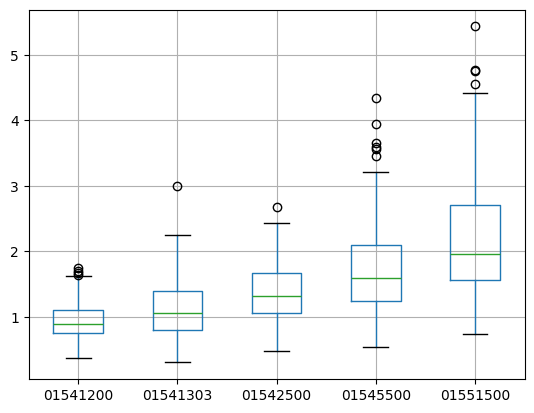

In [163]:
peak_depths.boxplot()

In [164]:
lag_hours = lag_times/3600
lag_hours.describe()

reaches,Curwensville-Hyde,Hyde-Karthaus,Karthaus-Renovo,Renovo-Williamsport
count,93.000000,83.000000,94.000000,81.000000
mean,4.833333,13.774096,9.731383,18.805556
std,2.324355,4.568018,3.727845,7.323229
min,1.750000,4.500000,2.750000,6.000000
25%,3.500000,11.000000,7.312500,14.250000
50%,4.250000,13.250000,9.375000,17.250000
75%,5.750000,15.625000,11.250000,20.750000
max,17.000000,26.000000,21.500000,42.750000


Text(0.5, 0, 'Wave travel time in hours')

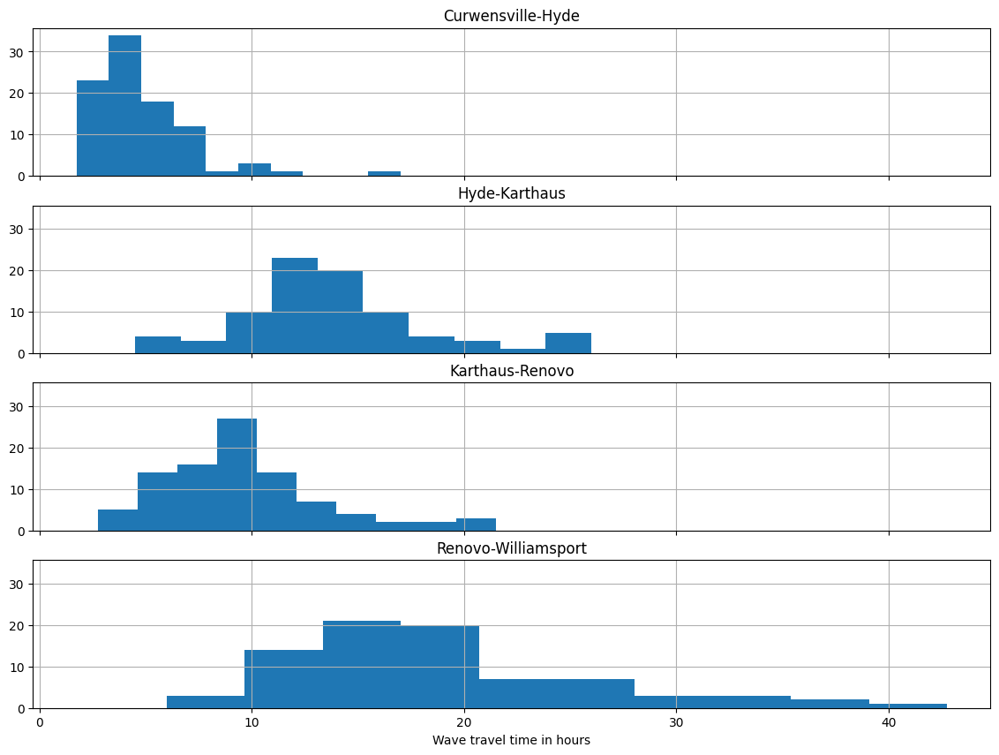

In [165]:
# Plot histograms of lag times for each reach
# Lag times are largely determined by the length of the reach
# But this can show the variation in wave travel time for each reach
fig, axes = plt.subplots(4, sharex='all', sharey='all', figsize= (14,10))
lag_hours['Curwensville-Hyde'].hist(ax=axes[0])
lag_hours['Hyde-Karthaus'].hist(ax=axes[1])
lag_hours['Karthaus-Renovo'].hist(ax=axes[2])
lag_hours['Renovo-Williamsport'].hist(ax=axes[3])
axes[0].set_title('Curwensville-Hyde')
axes[1].set_title('Hyde-Karthaus')
axes[2].set_title('Karthaus-Renovo')
axes[3].set_title('Renovo-Williamsport')
axes[3].set_xlabel('Wave travel time in hours')

In [166]:
celerity.describe()

reach,Curwensville-Hyde,Hyde-Karthaus,Karthaus-Renovo,Renovo-Williamsport
count,93.000000,83.000000,94.000000,81.000000
mean,0.896955,1.625949,1.836387,1.587171
std,0.375848,0.650232,0.789851,0.611925
min,0.212974,0.766026,0.717364,0.609305
25%,0.629662,1.274748,1.370963,1.255315
50%,0.851895,1.503145,1.645448,1.510016
75%,1.034444,1.810606,2.109628,1.827914
max,2.068889,4.425926,5.608485,4.341296


<Axes: >

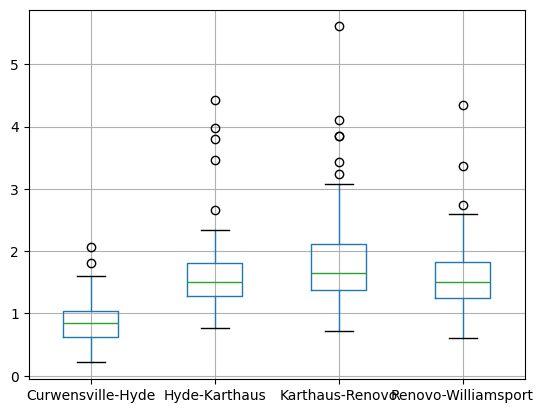

In [167]:
# Create boxplots of celerity by reach
celerity.boxplot()

Text(0, 0.5, 'Peak Height (m)')

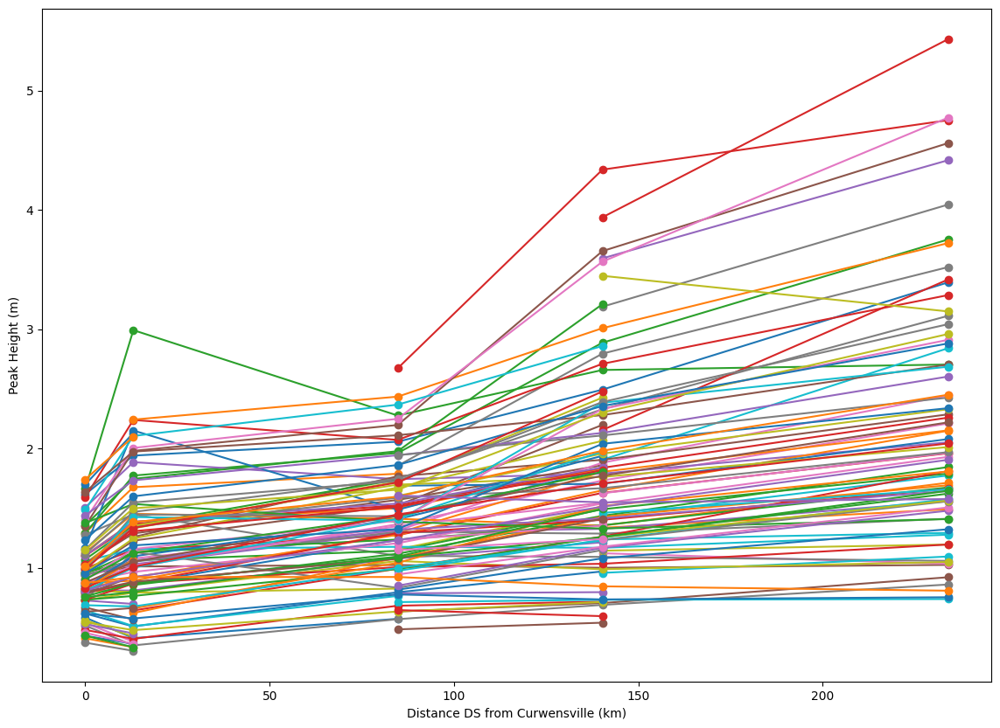

In [168]:
# Plot the size of each wave as it travels past the stations
fig, ax = plt.subplots(figsize= (14,10))
for wave in peak_depths.index:
    x = (stations.loc['01541200','position_nhd_m'] - stations['position_nhd_m'])/1000 # Distance DS from Curwensville station (km)
    y = peak_depths.loc[wave,:]
    ax.plot(x, y, 'o-', label=f"Wave #{wave}")
#ax.legend()
ax.set_xlabel('Distance DS from Curwensville (km)')
ax.set_ylabel('Peak Height (m)')

Text(0, 0.5, 'Celerity (m/s)')

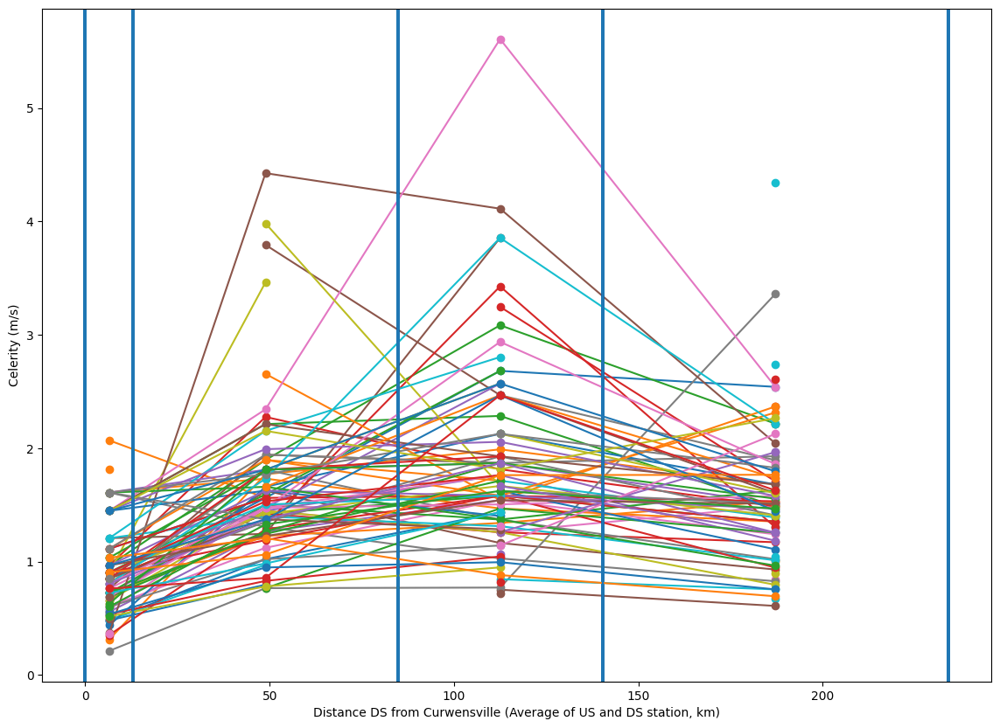

In [169]:
# Plot the celerity of each wave at the middle of the reach
# ~~Note that the reaches involving Bower all have unusually fast celerities.~~
# The reaches involving Bower were dropped.
# Celerities tend to increase in a downstream direction except for wave #2.

# Note: Upstream is on the right in this diagram. X is the distance to a DS point.

fig, ax = plt.subplots(figsize= (14,10))
for wave in peak_depths.index:
    avg_pos = []
    for reach in reaches.index:
        us = reaches.loc[reach,'us']
        ds = reaches.loc[reach,'ds']
        us_loc = stations.at[us,'position_nhd_m']
        ds_loc = stations.at[ds,'position_nhd_m']
        avg = np.mean([us_loc, ds_loc])
        position = (stations.loc['01541200','position_nhd_m'] - avg)/1000
        avg_pos.append(position)    
    y = celerity.loc[wave]
    ax.plot(avg_pos, y, 'o-', label=f"Wave #{wave}")
    for station in stations.index:
        ax.axvline((stations.loc['01541200','position_nhd_m'] - stations.at[station, 'position_nhd_m'])/1000)
#ax.legend(loc='upper right')
ax.set_xlabel('Distance DS from Curwensville (Average of US and DS station, km)')
ax.set_ylabel('Celerity (m/s)')

Text(0, 0.5, 'Celerity (m/s)')

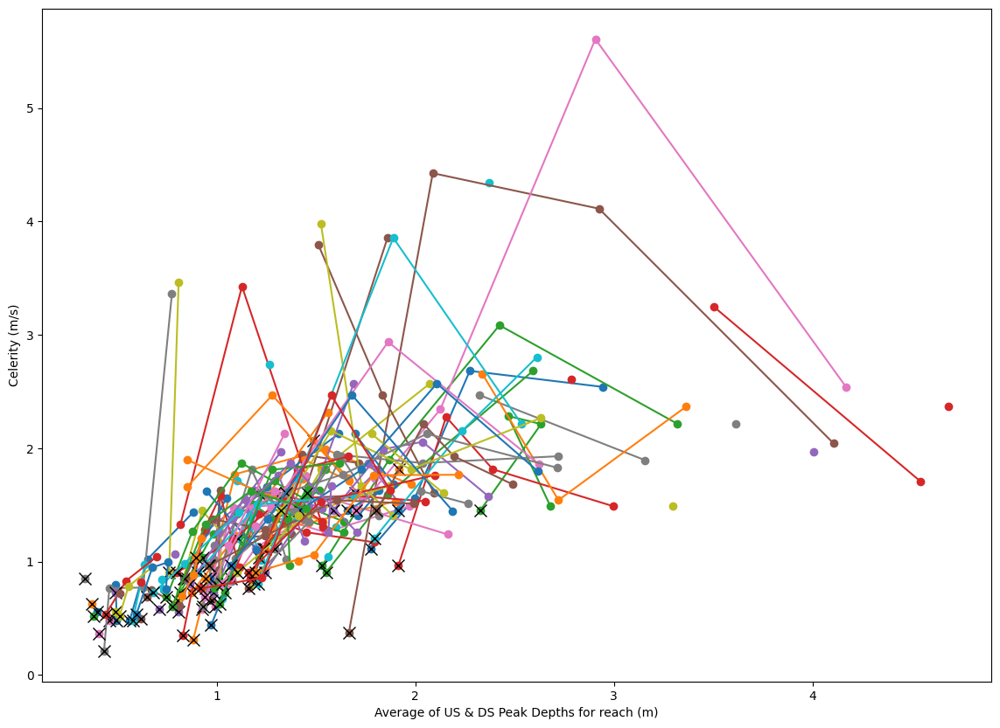

In [170]:
# Plot the celerity of each wave as a function of peak depth
# The reaches involving the Bower station were dropped using the bower_mask
# Higher discharges have higher celerities.
fig, ax = plt.subplots(figsize= (14,10))
for wave in peak_depths.index:
    avg_Q = []
    for reach in reaches.index:
        us = reaches.at[reach,'us']
        ds = reaches.at[reach,'ds']
        us_s = peak_depths.at[wave,us]
        ds_s = peak_depths.at[wave,ds]
        avg = np.mean([us_s, ds_s])
        avg_Q.append(avg)    
    y = celerity.loc[wave]
    ax.plot(avg_Q, y, 'o-', label=f"Wave #{wave}")
    ax.plot(avg_Q[0], y.iloc[0], 'x', color='black', markersize=10,) # The first reach has an X
#ax.legend(loc='upper left')
ax.set_xlabel('Average of US & DS Peak Depths for reach (m)')
ax.set_ylabel('Celerity (m/s)')

In [171]:
# Get reach symbols & colors from reaches file
reach_marker = reaches[['symbol', 'color']] 
reach_marker

,symbol,color
Curwensville-Hyde,+,#2f9df5
Hyde-Karthaus,x,#4df884
Karthaus-Renovo,*,#dedd32
Renovo-Williamsport,o,#f65f18


Curwensville-Hyde  m:0.6590965744213373,  b:0.2101771573046124, r²:0.5298412543459518, p: 1.3874823485368616e-16
Hyde-Karthaus  m:0.8082105515044841,  b:0.5714906241964472, r²:0.3030115157410321, p: 6.997610280827393e-08
Karthaus-Renovo  m:0.9912298885001561,  b:0.3027038039717811, r²:0.5135992408441443, p: 4.581590266871188e-16
Renovo-Williamsport  m:0.34822346133757337,  b:0.8936204865738945, r²:0.25989304662436147, p: 1.1677403448781452e-06


Text(0, 0.5, 'Celerity (m/s)')

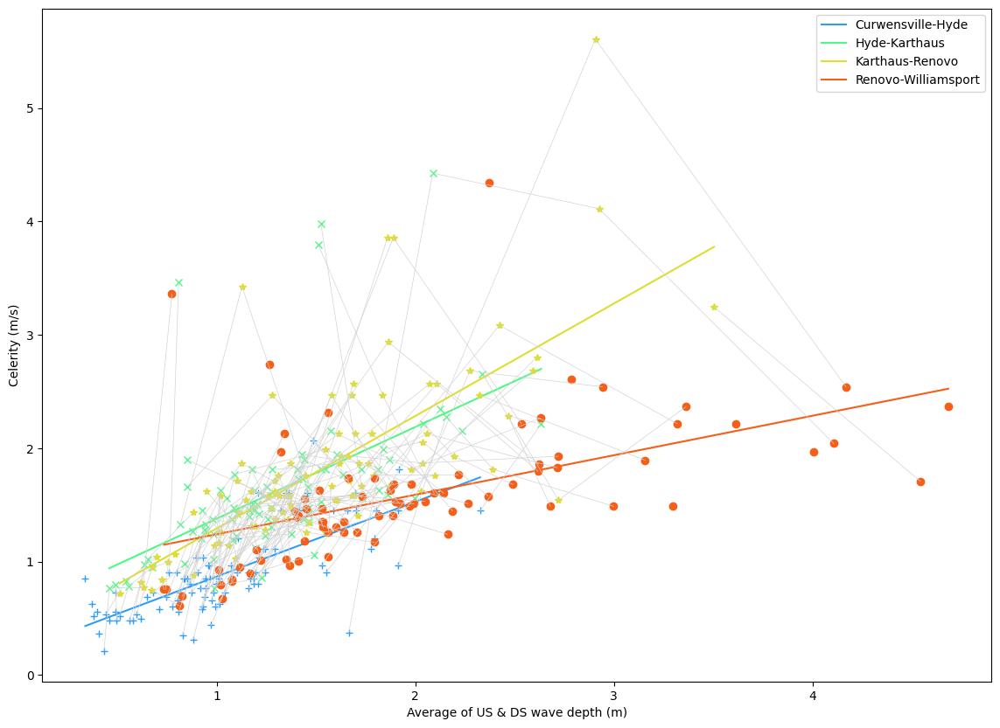

In [172]:
# Plot the celerity of each wave as a function of peak discharge
# But set colors by reach
fig, ax = plt.subplots(figsize= (14,10))

ds_Q = {}
for reach in reaches.index:
    ds = reaches.at[reach, 'ds']
    us = reaches.at[reach, 'us']
    x = (peak_depths.loc[:,ds]+ peak_depths.loc[:,us])/2
    y = celerity.loc[:,reach]
    mask = ~np.isnan(x) & ~np.isnan(y) # Mask out all NaNs
    ax.plot(x, y, color=reach_marker.loc[reach, 'color'], marker=reach_marker.loc[reach,'symbol'], linestyle='None')
    gradient, intercept, r_value, p_value, std_err = linregress(x[mask],y[mask])
    print(f'{reach}  m:{gradient},  b:{intercept}, r²:{r_value**2}, p: {p_value}')
    mn=np.min(x)
    mx=np.max(x)
    x1=np.linspace(mn,mx,500)
    y1=gradient*x1+intercept
    ax.plot(x1,y1,'-', color=reach_marker.loc[reach, 'color'], label=reach)
for wave in peak_depths.index:
    xx = []
    yy = []
    for reach in reaches.index:
        ds = reaches.at[reach, 'ds']
        us = reaches.at[reach, 'us']
        xx.append((peak_depths.at[wave,us] + peak_depths.at[wave,ds])/2)
        #select = validation_celerity.loc[:, 'wave'] == wave & validation_celerity.loc[:, 'reach'] == reach 
        #y = validation_celerity.loc[select, 'celerity']
        yy.append(celerity.loc[wave, reach])
    ax.plot(xx, yy, color='lightgray', linewidth=0.5, label=None)
ax.legend()
ax.set_xlabel('Average of US & DS wave depth (m)')
ax.set_ylabel('Celerity (m/s)')
#fig.savefig('validation_avgdepth_celerity.svg')

Curwensville-Hyde  m:0.5125963658113731,  b:0.3125224506269574, r²:0.5103824705829607, p: 8.941237652126977e-16
Hyde-Karthaus  m:0.8837335934281771,  b:0.3896038485885136, r²:0.3289649972576084, p: 1.4483129855457598e-08
Karthaus-Renovo  m:0.8371079681917488,  b:0.39918223926607754, r²:0.5659379344416111, p: 2.32482503767036e-18
Renovo-Williamsport  m:0.32848419138758195,  b:0.8700635875728471, r²:0.2970408268823758, p: 1.4361205072493706e-07


Text(0, 0.5, 'Celerity (m/s)')

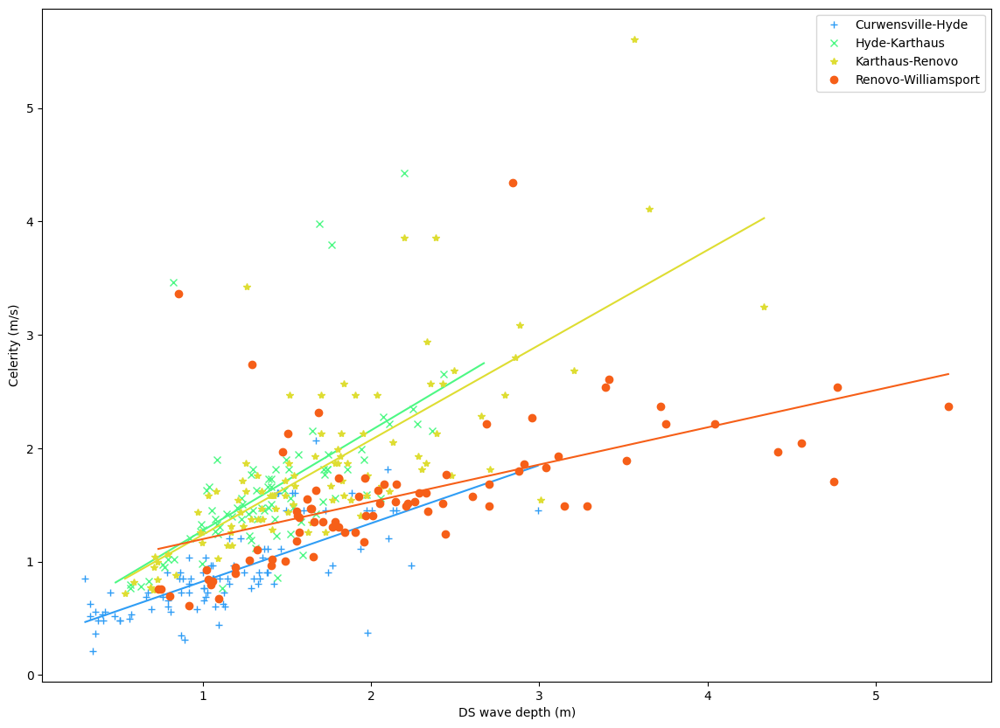

In [173]:
# Plot the celerity of each wave as a function of peak discharge
# But set colors by reach
fig, ax = plt.subplots(figsize= (14,10))

ds_Q = {}
for reach in reaches.index:
    ds = reaches.at[reach, 'ds']
    x = peak_depths.loc[:,ds]
    y = celerity.loc[:,reach]
    mask = ~np.isnan(x) & ~np.isnan(y) # Mask out all NaNs
    ax.plot(x, y, color=reach_marker.loc[reach, 'color'], marker=reach_marker.loc[reach,'symbol'], linestyle='None', label=reach)
    gradient, intercept, r_value, p_value, std_err = linregress(x[mask],y[mask])
    print(f'{reach}  m:{gradient},  b:{intercept}, r²:{r_value**2}, p: {p_value}')
    mn=np.min(x)
    mx=np.max(x)
    x1=np.linspace(mn,mx,500)
    y1=gradient*x1+intercept
    ax.plot(x1,y1,'-', color=reach_marker.loc[reach, 'color'], label=None)
    #ax.plot([],[], '-', color=reach_marker.loc[reach, 'color'], marker=reach_marker.loc[reach,'symbol'], label=reach)
ax.legend()
ax.set_xlabel('DS wave depth (m)')
ax.set_ylabel('Celerity (m/s)')
#fig.savefig("Validation_DSdepth-Celerity.svg")

Curwensville-Hyde  m:0.5125963658113731,  b:0.3125224506269574, r²:0.5103824705829607, p: 8.941237652126977e-16
Hyde-Karthaus  m:0.8837335934281771,  b:0.3896038485885136, r²:0.3289649972576084, p: 1.4483129855457598e-08
Karthaus-Renovo  m:0.8371079681917488,  b:0.39918223926607754, r²:0.5659379344416111, p: 2.32482503767036e-18
Renovo-Williamsport  m:0.32848419138758195,  b:0.8700635875728471, r²:0.2970408268823758, p: 1.4361205072493706e-07


Text(0, 0.5, 'Celerity (m/s)')

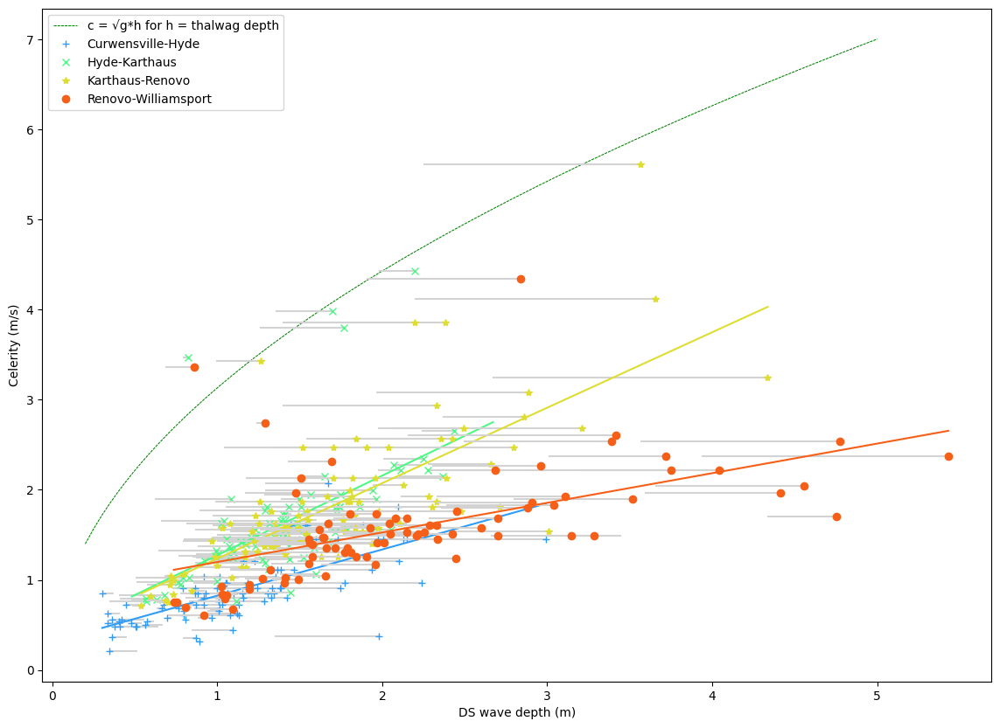

In [174]:
# Plot the celerity of each wave as a function of depth
# But set colors by reach
fig, ax = plt.subplots(figsize= (14,10))
x_min = 0.2
x_max = 5
x_range_m = np.linspace(x_min, x_max, 100)
# c = √g*D for a Theoretical curve 
y = (x_range_m * 9.8)**0.5
ax.plot(x_range_m, y, linestyle=(0,(3,1)), linewidth=0.75, color='green', label='c = √g*h for h = thalwag depth')

ds_Q = {}
for reach in reaches.index:
    us = reaches.at[reach, 'us']
    ds = reaches.at[reach, 'ds']
    x0 = peak_depths.loc[:,us]
    x = peak_depths.loc[:,ds]
    y = celerity.loc[:,reach]
    mask = ~np.isnan(x) & ~np.isnan(y) # Mask out all NaNs
    ax.hlines(y, x0, x, color='lightgray')
    ax.plot(x, y, color=reach_marker.loc[reach, 'color'], marker=reach_marker.loc[reach,'symbol'], linestyle='None', label=reach)
    gradient, intercept, r_value, p_value, std_err = linregress(x[mask],y[mask])
    print(f'{reach}  m:{gradient},  b:{intercept}, r²:{r_value**2}, p: {p_value}')
    mn=np.min(x)
    mx=np.max(x)
    x1=np.linspace(mn,mx,500)
    y1=gradient*x1+intercept
    ax.plot(x1,y1,'-', color=reach_marker.loc[reach, 'color'], label=None)
    #ax.plot([],[], '-', color=reach_marker.loc[reach, 'color'], marker=reach_marker.loc[reach,'symbol'], label=reach)
ax.legend()
ax.set_xlabel('DS wave depth (m)')
ax.set_ylabel('Celerity (m/s)')
#fig.savefig("Validation_US_DSdepth-Celerity.svg")

Curwensville-Hyde  m:0.5125963658113731,  b:0.3125224506269574, r²:0.5103824705829607, p: 8.941237652126977e-16
Hyde-Karthaus  m:0.8837335934281771,  b:0.3896038485885136, r²:0.3289649972576084, p: 1.4483129855457598e-08
Karthaus-Renovo  m:0.8371079681917488,  b:0.39918223926607754, r²:0.5659379344416111, p: 2.32482503767036e-18
Renovo-Williamsport  m:0.32848419138758195,  b:0.8700635875728471, r²:0.2970408268823758, p: 1.4361205072493706e-07


Text(0, 0.5, 'Celerity (m/s)')

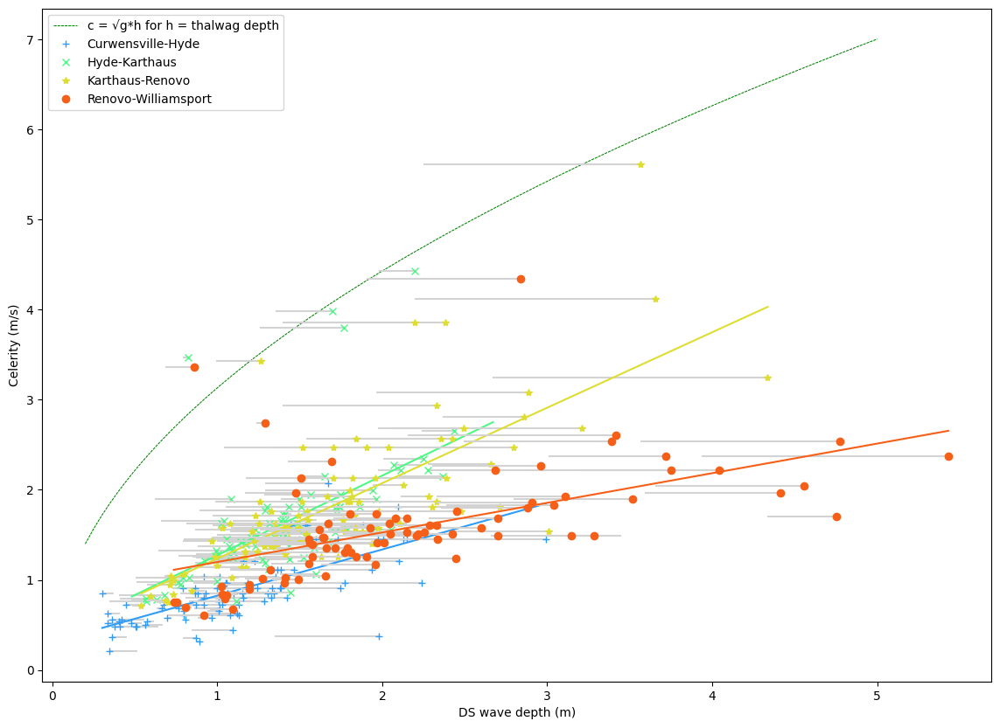

In [175]:
# Plot the celerity of each wave as a function of peak discharge
# But set colors by reach
fig, ax = plt.subplots(figsize= (14,10))
x_min = 0.2
x_max = 5
x_range_m = np.linspace(x_min, x_max, 100)
# c = √g*D for a Theoretical curve 
y = (x_range_m * 9.8)**0.5
ax.plot(x_range_m, y, linestyle=(0,(3,1)), linewidth=0.75, color='green', label='c = √g*h for h = thalwag depth')

ds_Q = {}
for reach in reaches.index:
    us = reaches.at[reach, 'us']
    ds = reaches.at[reach, 'ds']
    x0 = peak_depths.loc[:,us]
    x = peak_depths.loc[:,ds]
    y = celerity.loc[:,reach]
    mask = ~np.isnan(x) & ~np.isnan(y) # Mask out all NaNs
    ax.hlines(y, x0, x, color='lightgray')
    ax.plot(x, y, color=reach_marker.loc[reach, 'color'], marker=reach_marker.loc[reach,'symbol'], linestyle='None', label=reach)
    gradient, intercept, r_value, p_value, std_err = linregress(x[mask],y[mask])
    print(f'{reach}  m:{gradient},  b:{intercept}, r²:{r_value**2}, p: {p_value}')
    mn=np.min(x)
    mx=np.max(x)
    x1=np.linspace(mn,mx,500)
    y1=gradient*x1+intercept
    ax.plot(x1,y1,'-', color=reach_marker.loc[reach, 'color'], label=None)
    #ax.plot([],[], '-', color=reach_marker.loc[reach, 'color'], marker=reach_marker.loc[reach,'symbol'], label=reach)
ax.legend()
ax.set_xlabel('DS wave depth (m)')
ax.set_ylabel('Celerity (m/s)')
#fig.savefig("Validation_US_DSdepth-Celerity.svg")